<a href="https://colab.research.google.com/github/jithsg/MODELING/blob/main/Copy_of_Hybrid_nmos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam

# ---- Step 1: Data Loading ----
device_files = [
    "nfet_120_40.CSV",
    "nfet_200_40.CSV",
    "nfet_200_80.CSV",
    "nfet_400_40.CSV",
    "nfet_800_40.CSV"
]

flattened_vectors = []
per_device_raw_data = []

for path in device_files:
    df = pd.read_csv(path).sort_values(by=["V_gs", "V_ds"])
    Id = df["I_ds"].values
    gm = df["gm"].values
    gds = df["gds"].values
    flat = np.stack([Id, gm, gds], axis=1).flatten()
    flattened_vectors.append(flat)
    per_device_raw_data.append(df)

device_matrix = np.array(flattened_vectors)
pca = PCA(n_components=3)
device_signatures = pca.fit_transform(device_matrix)

# ---- Step 2: Feature Construction ----
X = []
y_id, y_gm, y_gd = [], [], []

for i, df in enumerate(per_device_raw_data):
    P = device_signatures[i]
    for _, row in df.iterrows():
        vgs = row["V_gs"]
        vds = row["V_ds"]
        temp = row["temp"]
        id_val = max(row["I_ds"], 1e-12)
        gm_val = row["gm"]
        gd_val = row["gds"]
        X.append([*P, vgs, vds, temp])
        y_id.append(np.log10(id_val))
        y_gm.append(gm_val)
        y_gd.append(gd_val)

X = np.array(X)
y_id = np.array(y_id)
y_gm = np.array(y_gm)
y_gd = np.array(y_gd)

# ---- Step 3: Scaling ----
scaler_gm = StandardScaler()
scaler_gd = StandardScaler()
y_gm_scaled = scaler_gm.fit_transform(y_gm.reshape(-1, 1)).flatten()
y_gd_scaled = scaler_gd.fit_transform(y_gd.reshape(-1, 1)).flatten()

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

y_combined = np.stack([y_id, y_gm_scaled, y_gd_scaled], axis=1)

print("X_scaled shape:", X_scaled.shape)
print("y_combined shape:", y_combined.shape)



import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Step 2.1: Custom loss function
def hybrid_loss(y_true, y_pred):
    log_Id_true = y_true[:, 0]
    gm_true     = y_true[:, 1]
    gd_true     = y_true[:, 2]

    log_Id_pred = y_pred[:, 0]
    gm_pred     = y_pred[:, 1]
    gd_pred     = y_pred[:, 2]

    # Base losses
    loss_Id = tf.reduce_mean(tf.square(log_Id_true - log_Id_pred))
    # loss_Id = tf.reduce_mean(tf.square((10**log_Id_true - 10**log_Id_pred) / (10**log_Id_true + 1e-12)))

    loss_gm = tf.reduce_mean(tf.square(gm_true - gm_pred))
    loss_gd = tf.reduce_mean(tf.square(gd_true - gd_pred))

    # First-order smoothness
    gm_smooth = tf.reduce_mean(tf.square(gm_pred[1:] - gm_pred[:-1]))
    gd_smooth = tf.reduce_mean(tf.square(gd_pred[1:] - gd_pred[:-1]))

    # Second-order smoothness (∂²gm, ∂²gd)
    gm_second = tf.reduce_mean(tf.square(gm_pred[2:] - 2 * gm_pred[1:-1] + gm_pred[:-2]))
    gd_second = tf.reduce_mean(tf.square(gd_pred[2:] - 2 * gd_pred[1:-1] + gd_pred[:-2]))

    total_loss = (
    2.2 * loss_Id +
    1.5 * loss_gm +
    1.0 * loss_gd +
    0.02 * gm_smooth +
    0.01 * gd_smooth +
    0.002 * gm_second +
    0.005 * gd_second
)



    return total_loss


# ---- Step 4: Train/Test Split ----
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_combined, test_size=0.2, random_state=42)

model = Sequential([
    Input(shape=(6,)),  # [P0, P1, P2, Vgs, Vds, Temp]
    Dense(64, activation='tanh'),
    Dense(64, activation='tanh'),
    Dense(64, activation='tanh'),
    Dense(64, activation='tanh'),
    Dense(3)  # [log10(Id), gm, gd]
])



model.compile(optimizer=Adam(learning_rate=0.001), loss=hybrid_loss)
history = model.fit(X_train, y_train, validation_split=0.1, epochs=300, batch_size=64, verbose=1)

# ---- Step 7: Prediction & GPR ----
y_pred = model.predict(X_test)
log_Id_pred = y_pred[:, 0]
gm_pred = scaler_gm.inverse_transform(y_pred[:, 1].reshape(-1, 1)).flatten()
gd_pred = scaler_gd.inverse_transform(y_pred[:, 2].reshape(-1, 1)).flatten()

log_Id_true = y_test[:, 0]
gm_true = scaler_gm.inverse_transform(y_test[:, 1].reshape(-1, 1)).flatten()
gd_true = scaler_gd.inverse_transform(y_test[:, 2].reshape(-1, 1)).flatten()

Id_pred_nn = 10 ** log_Id_pred
Id_true = 10 ** log_Id_true
residuals = Id_true - Id_pred_nn
X_gp = X_test[:, 3:]  # Vgs, Vds, Temp

kernel = C(1.0) * RBF(length_scale=[0.1, 0.1, 10.0])
gpr = GaussianProcessRegressor(kernel=kernel, alpha=1e-12, normalize_y=True)
gpr.fit(X_gp, residuals)

residual_pred, _ = gpr.predict(X_gp, return_std=True)
Id_pred_hybrid = Id_pred_nn + residual_pred

# ---- Step 8: Evaluation ----
def evaluate_metrics(true, pred, label):
    mse = mean_squared_error(true, pred)
    r2 = r2_score(true, pred)
    print(f"{label} → MSE: {mse:.4e}, R²: {r2:.4f}")

evaluate_metrics(Id_true, Id_pred_nn, "NN I_ds")
evaluate_metrics(Id_true, Id_pred_hybrid, "Hybrid NN+GPR I_ds")
evaluate_metrics(gm_true, gm_pred, "gm")
evaluate_metrics(gd_true, gd_pred, "gd")


X_scaled shape: (9300, 6)
y_combined shape: (9300, 3)
Epoch 1/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 25.5157 - val_loss: 9.6756
Epoch 2/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.6820 - val_loss: 6.7109
Epoch 3/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.5488 - val_loss: 5.8248
Epoch 4/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4470 - val_loss: 4.8384
Epoch 5/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4328 - val_loss: 4.3695
Epoch 6/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2789 - val_loss: 3.9639
Epoch 7/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.5552 - val_loss: 3.5967
Epoch 8/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.2103 - val_loss: 3.2061
Epoch 9/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.8952 - val_loss: 2.9233
Epoch 10/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.5872 - val_loss: 2.5741
Epoch 11/300
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.2456 - va

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


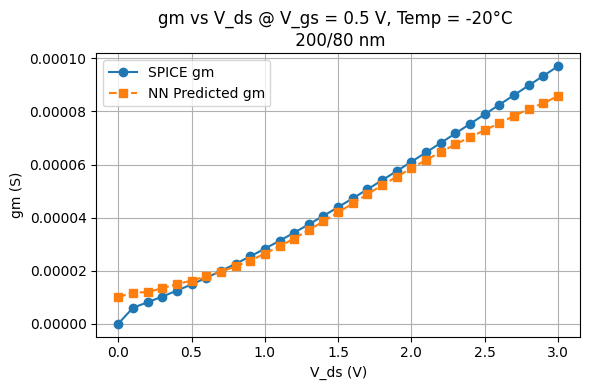

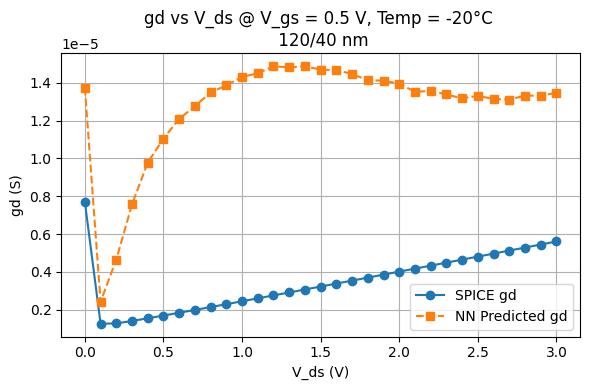

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Set Vgs and temperature for comparison
VGS_TARGET = .5
TEMP_TARGET = -20

# Load and filter SPICE data
df_spice = pd.read_csv("nfet_120_40-1.CSV").sort_values(by=["V_gs", "V_ds"])
mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
df_filtered = df_spice[mask].sort_values(by="V_ds")

if df_filtered.empty:
    print(f"⚠️ No data found for Vgs={VGS_TARGET} V, Temp={TEMP_TARGET}°C")
else:
    # Prepare input
    signature = device_signatures[0]  # Device 1
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # Predict with model → outputs: [log10(Id), gm_scaled, gd_scaled]
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gd_pred_scaled = y_pred[:, 2]

    # Invert standard scaling
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()
    gd_pred = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # True gm and gd
    gm_spice = df_filtered["gm"].values
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.figure(figsize=(6, 4))
    plt.plot(vds_vals, gm_spice, "o-", label="SPICE gm")
    plt.plot(vds_vals, gm_pred, "s--", label="NN Predicted gm")
    plt.xlabel("V_ds (V)")
    plt.ylabel("gm (S)")
    plt.title(f"gm vs V_ds @ V_gs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C \n 120/80 nm")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot gd
    plt.figure(figsize=(6, 4))
    plt.plot(vds_vals, gd_spice, "o-", label="SPICE gd")
    plt.plot(vds_vals, gd_pred, "s--", label="NN Predicted gd")
    plt.xlabel("V_ds (V)")
    plt.ylabel("gd (S)")
    plt.title(f"gd vs V_ds @ V_gs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C \n 120/40 nm")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


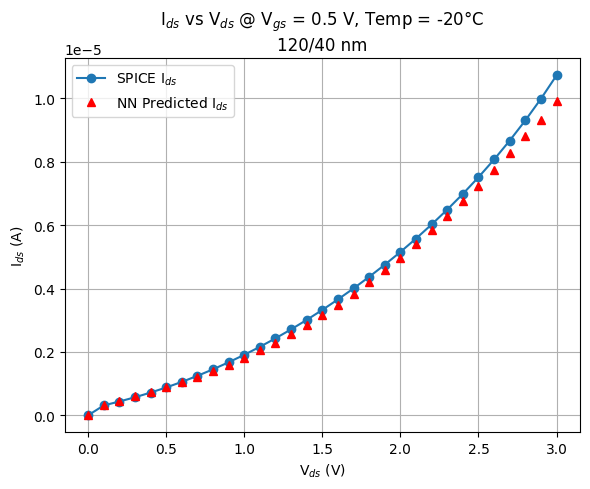

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


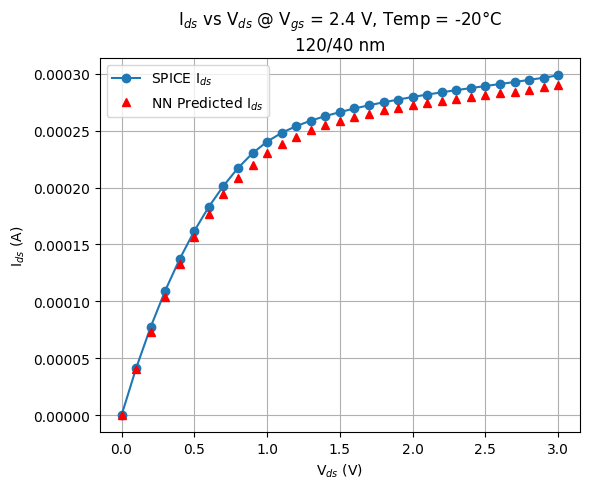

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


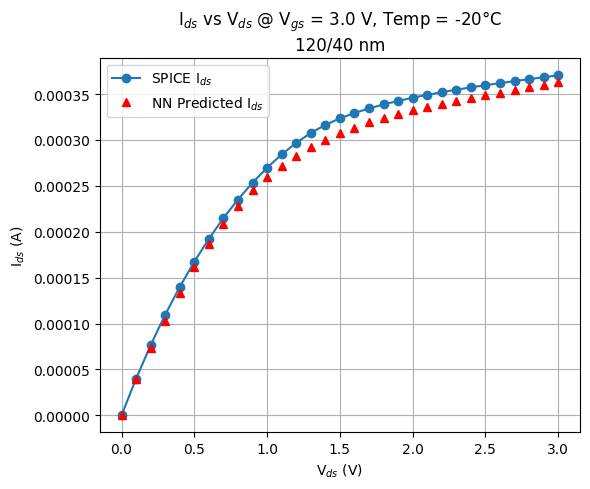

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_120_40-1.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[0]  # PCA vector for Device 1
TEMP_TARGET = -20
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)

    # Predict [log_Id, gm_scaled, gd_scaled]
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Get SPICE values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot I_ds vs V_ds
    plt.figure(figsize=(6, 5))
    plt.plot(Vds_vals, Id_spice, "o-", label="SPICE I$_{ds}$")
    # plt.plot(Vds_vals, Id_pred, "s--", label="NN Predicted I$_{ds}$")
    plt.plot(Vds_vals, Id_pred, "^", color='red', label="NN Predicted I$_{ds}$")  # '^' = triangle up


    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n120/40 nm")

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


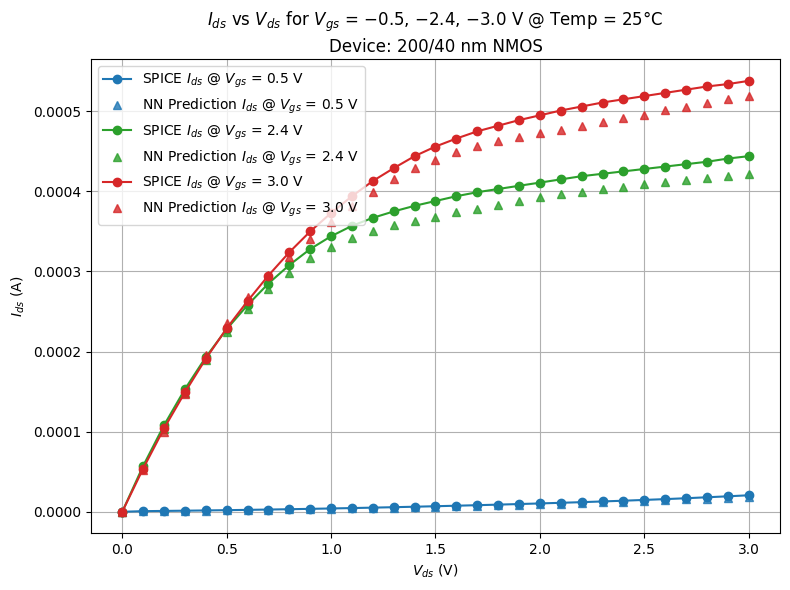

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for PMOS Device 1
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[1]  # PCA vector for pfet_120_40
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

# Color map for each Vgs
color_map = {
    0.5: '#1f77b4',
    2.4: '#2ca02c',
    3.0: '#d62728'
}


# Initialize combined plot
plt.figure(figsize=(8, 6))

for VGS_TARGET in VGS_TARGETS:
    color = color_map[VGS_TARGET]

    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Extract values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot SPICE and NN with same color, but different markers
    plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"NN Prediction $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

# Final labels and styling
plt.xlabel("$V_{ds}$ (V)")
plt.ylabel("$I_{ds}$ (A)")
plt.title("$I_{ds}$ vs $V_{ds}$ for $V_{gs}$ = −0.5, −2.4, −3.0 V @ Temp = 25°C\nDevice: 200/40 nm NMOS")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


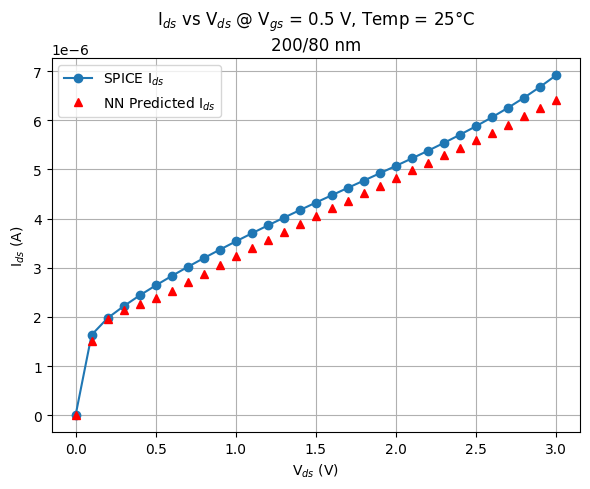

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


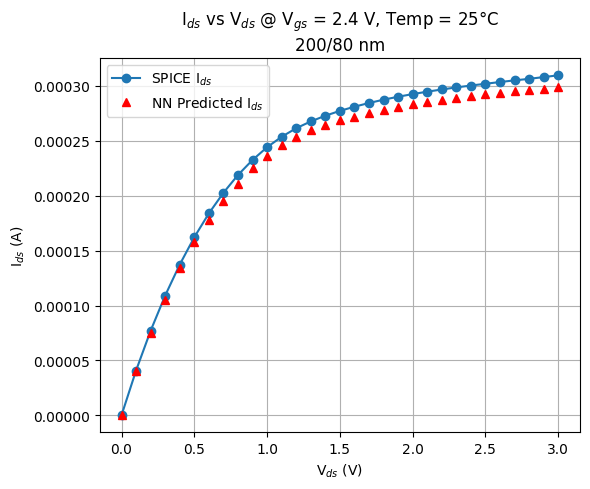

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


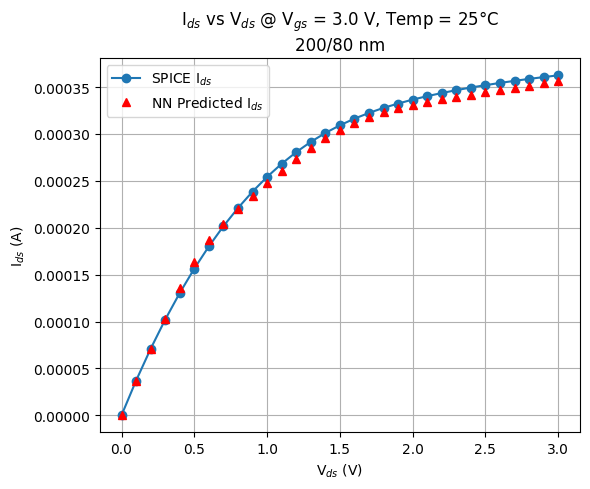

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[2]  # PCA vector for Device 1
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)

    # Predict [log_Id, gm_scaled, gd_scaled]
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Get SPICE values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot I_ds vs V_ds
    plt.figure(figsize=(6, 5))
    plt.plot(Vds_vals, Id_spice, "o-", label="SPICE I$_{ds}$")
    # plt.plot(Vds_vals, Id_pred, "s--", label="NN Predicted I$_{ds}$")
    plt.plot(Vds_vals, Id_pred, "^", color='red', label="NN Predicted I$_{ds}$")  # '^' = triangle up


    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n200/80 nm")

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


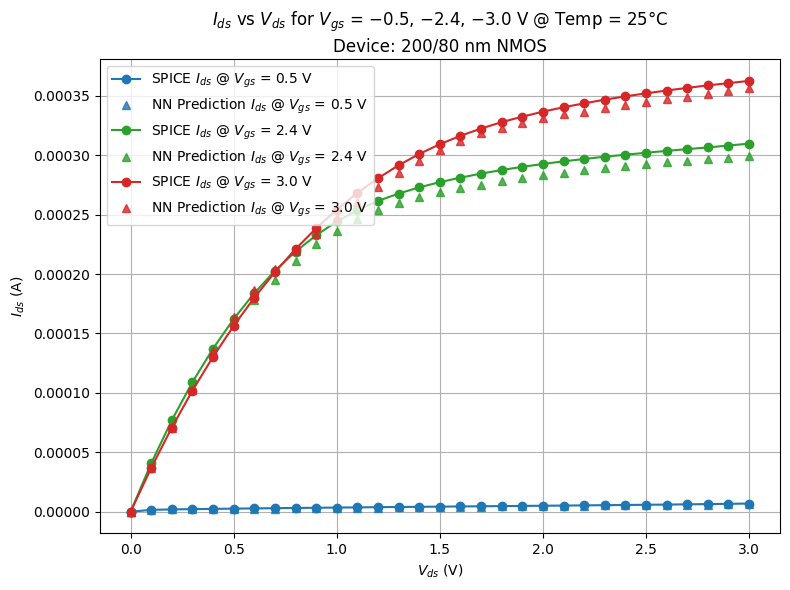

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for PMOS Device 1
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[2]  # PCA vector for pfet_120_40
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

# Color map for each Vgs
color_map = {
    0.5: '#1f77b4',
    2.4: '#2ca02c',
    3.0: '#d62728'
}


# Initialize combined plot
plt.figure(figsize=(8, 6))

for VGS_TARGET in VGS_TARGETS:
    color = color_map[VGS_TARGET]

    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Extract values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot SPICE and NN with same color, but different markers
    plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"NN Prediction $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

# Final labels and styling
plt.xlabel("$V_{ds}$ (V)")
plt.ylabel("$I_{ds}$ (A)")
plt.title("$I_{ds}$ vs $V_{ds}$ for $V_{gs}$ = −0.5, −2.4, −3.0 V @ Temp = 25°C\nDevice: 200/80 nm NMOS")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


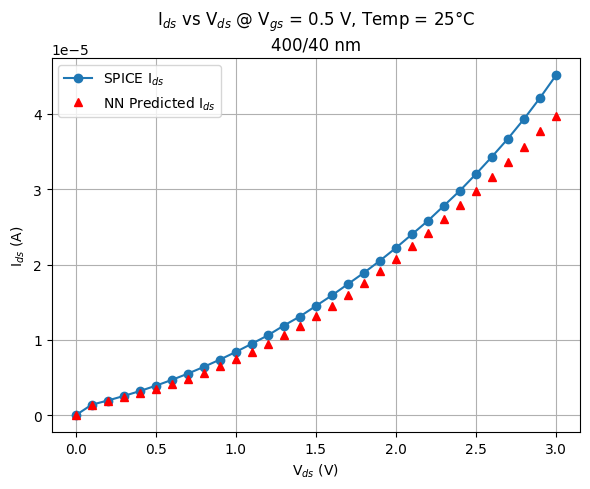

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


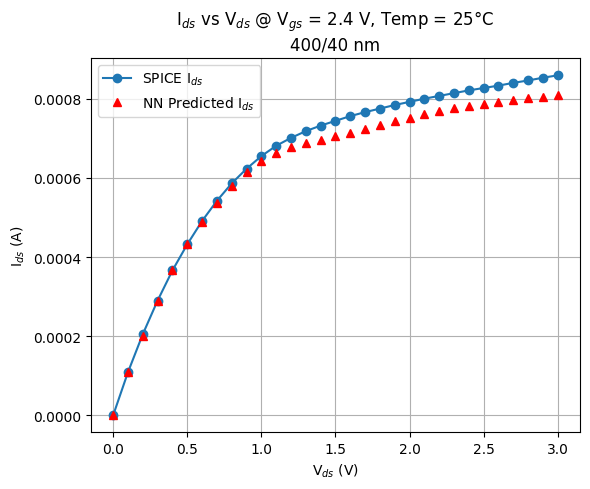

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


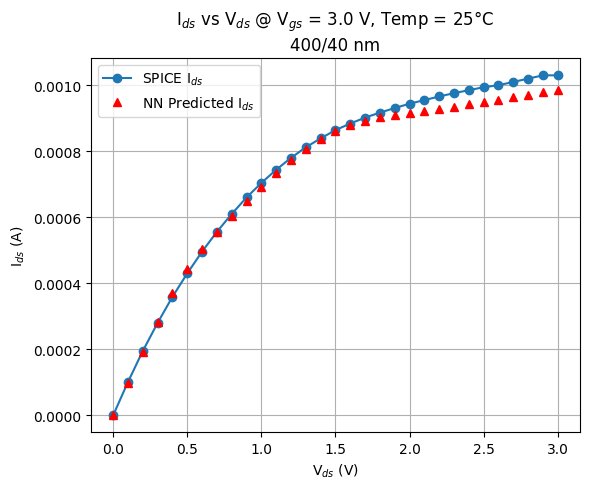

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[3]  # PCA vector for Device 1
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)

    # Predict [log_Id, gm_scaled, gd_scaled]
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Get SPICE values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot I_ds vs V_ds
    plt.figure(figsize=(6, 5))
    plt.plot(Vds_vals, Id_spice, "o-", label="SPICE I$_{ds}$")
    # plt.plot(Vds_vals, Id_pred, "s--", label="NN Predicted I$_{ds}$")
    plt.plot(Vds_vals, Id_pred, "^", color='red', label="NN Predicted I$_{ds}$")  # '^' = triangle up


    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n400/40 nm")

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


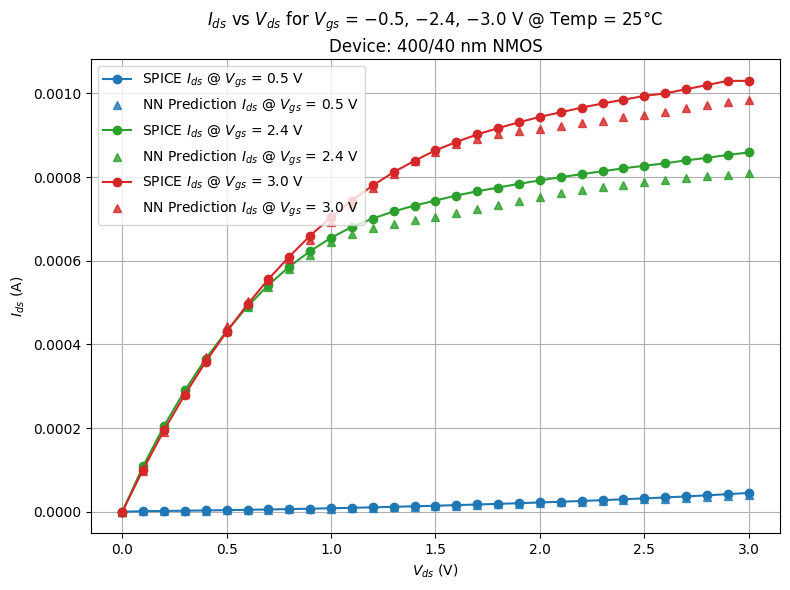

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for PMOS Device 1
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[3]  # PCA vector for pfet_120_40
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

# Color map for each Vgs
color_map = {
    0.5: '#1f77b4',
    2.4: '#2ca02c',
    3.0: '#d62728'
}


# Initialize combined plot
plt.figure(figsize=(8, 6))

for VGS_TARGET in VGS_TARGETS:
    color = color_map[VGS_TARGET]

    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Extract values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot SPICE and NN with same color, but different markers
    plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"NN Prediction $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

# Final labels and styling
plt.xlabel("$V_{ds}$ (V)")
plt.ylabel("$I_{ds}$ (A)")
plt.title("$I_{ds}$ vs $V_{ds}$ for $V_{gs}$ = −0.5, −2.4, −3.0 V @ Temp = 25°C\nDevice: 400/40 nm NMOS")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


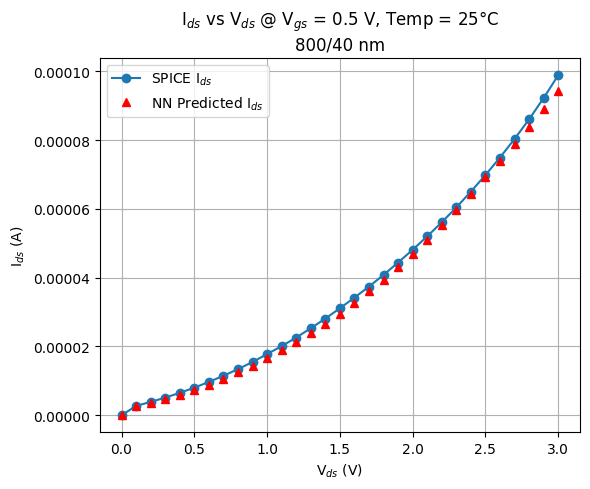

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


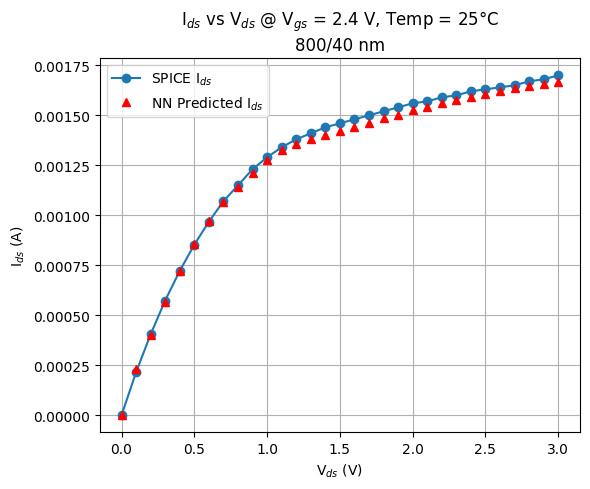

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


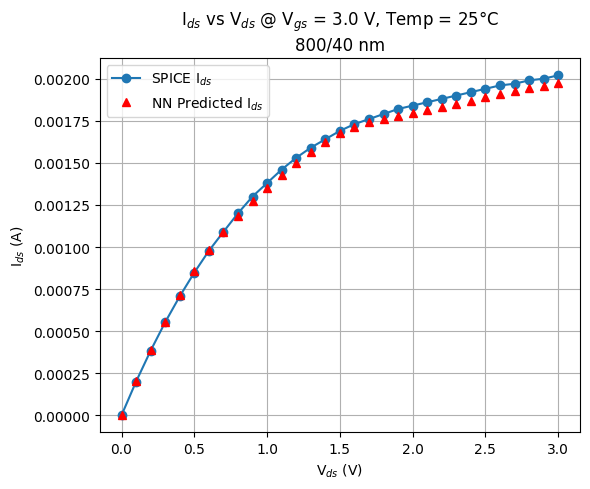

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[4]  # PCA vector for Device 1
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)

    # Predict [log_Id, gm_scaled, gd_scaled]
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Get SPICE values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot I_ds vs V_ds
    plt.figure(figsize=(6, 5))
    plt.plot(Vds_vals, Id_spice, "o-", label="SPICE I$_{ds}$")
    # plt.plot(Vds_vals, Id_pred, "s--", label="NN Predicted I$_{ds}$")
    plt.plot(Vds_vals, Id_pred, "^", color='red', label="NN Predicted I$_{ds}$")  # '^' = triangle up


    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n800/40 nm")

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


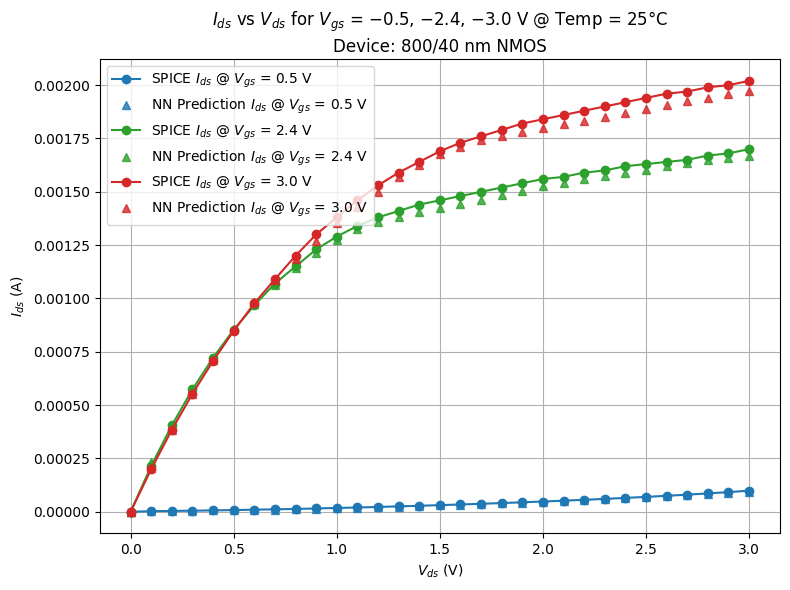

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for PMOS Device 1
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[4]  # PCA vector for pfet_120_40
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

# Color map for each Vgs
color_map = {
    0.5: '#1f77b4',
    2.4: '#2ca02c',
    3.0: '#d62728'
}


# Initialize combined plot
plt.figure(figsize=(8, 6))

for VGS_TARGET in VGS_TARGETS:
    color = color_map[VGS_TARGET]

    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Extract values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot SPICE and NN with same color, but different markers
    plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"NN Prediction $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

# Final labels and styling
plt.xlabel("$V_{ds}$ (V)")
plt.ylabel("$I_{ds}$ (A)")
plt.title("$I_{ds}$ vs $V_{ds}$ for $V_{gs}$ = −0.5, −2.4, −3.0 V @ Temp = 25°C\nDevice: 800/40 nm NMOS")
plt.legend(loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


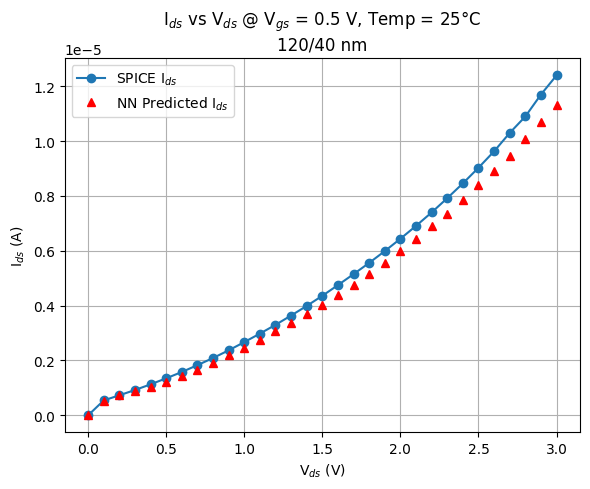

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


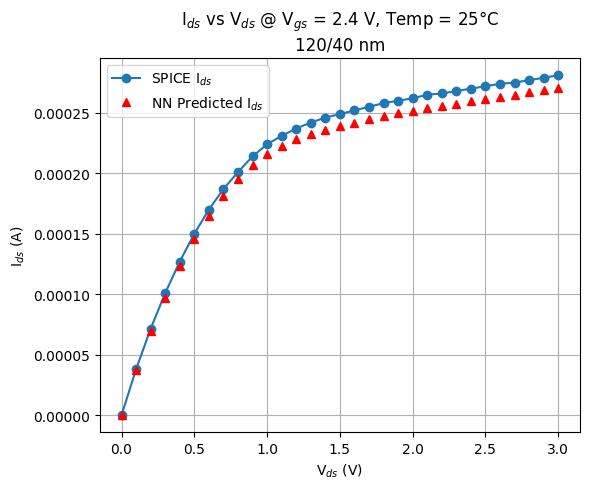

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


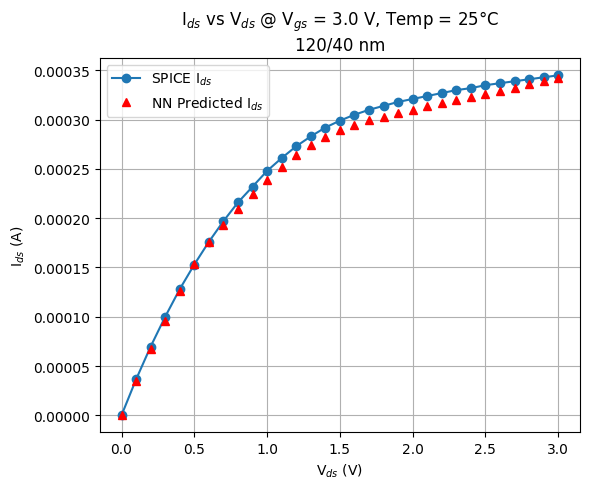

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[0]  # PCA vector for Device 1
TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Prepare model input
    X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_scaled_input = scaler.transform(X_input)

    # Predict [log_Id, gm_scaled, gd_scaled]
    y_pred = model.predict(X_scaled_input)
    log_Id_pred = y_pred[:, 0]
    Id_pred = 10 ** log_Id_pred

    # Get SPICE values
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plot I_ds vs V_ds
    plt.figure(figsize=(6, 5))
    plt.plot(Vds_vals, Id_spice, "o-", label="SPICE I$_{ds}$")
    # plt.plot(Vds_vals, Id_pred, "s--", label="NN Predicted I$_{ds}$")
    plt.plot(Vds_vals, Id_pred, "^", color='red', label="NN Predicted I$_{ds}$")  # '^' = triangle up


    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n120/40 nm")

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


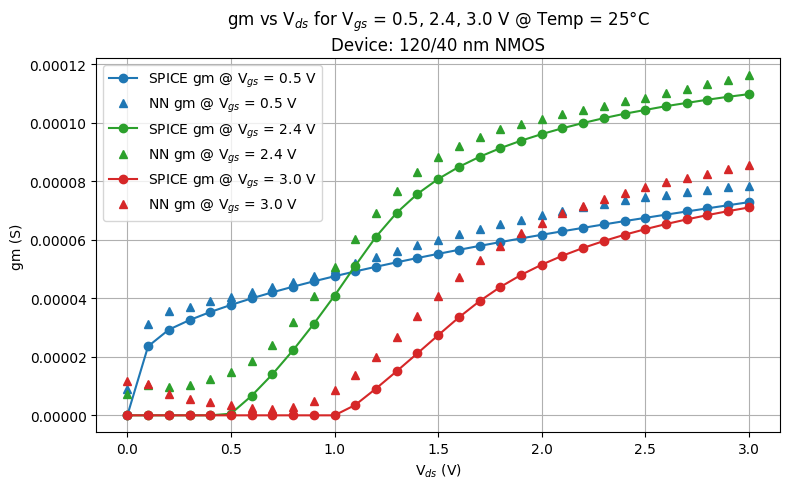

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 2  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


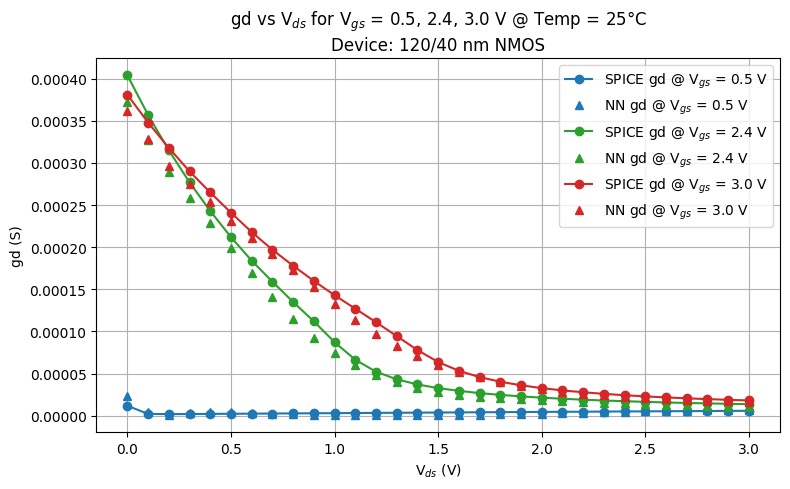

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 0  # nfet_800_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gd
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE gd @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gd_pred, "^", color=color, linestyle='None', label=f"NN gd @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gd (S)")
plt.title("gd vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 0  # nfet_800_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gd
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE gd @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gd_pred, "^", color=color, linestyle='None', label=f"NN gd @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gd (S)")
plt.title("gd vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


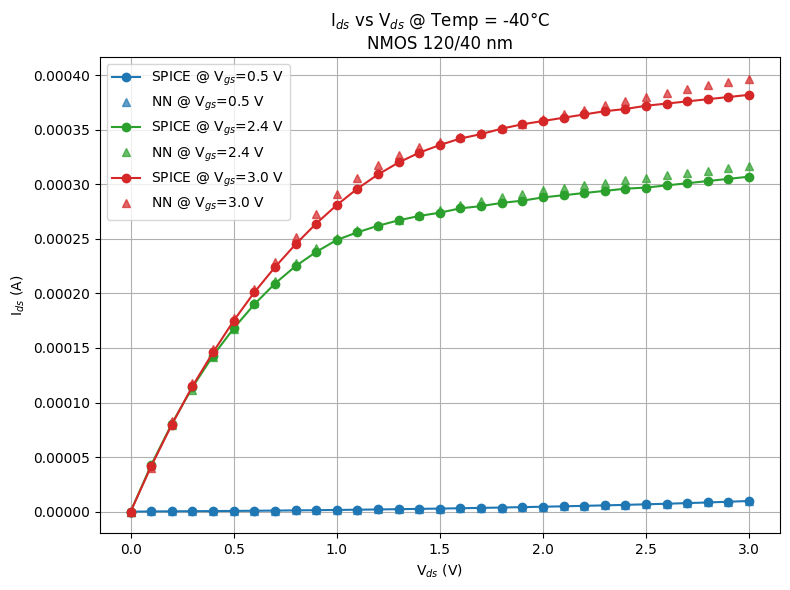

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


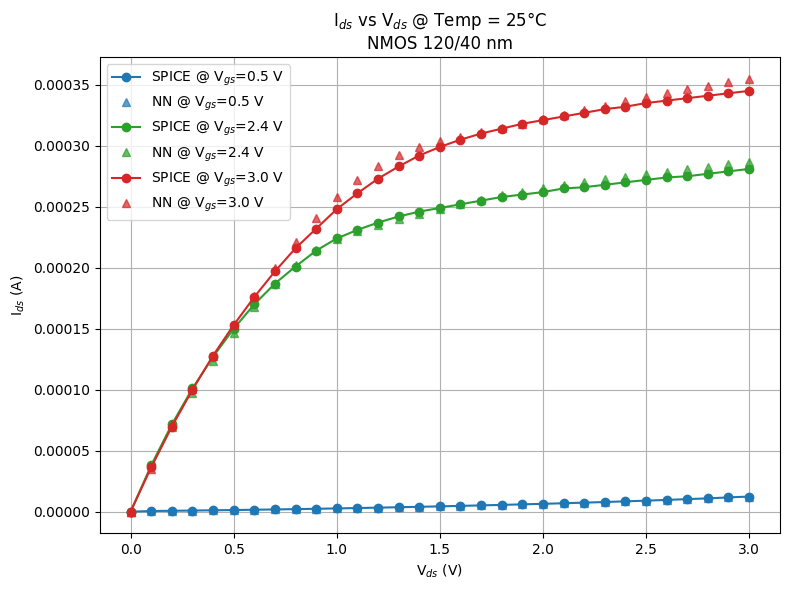

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


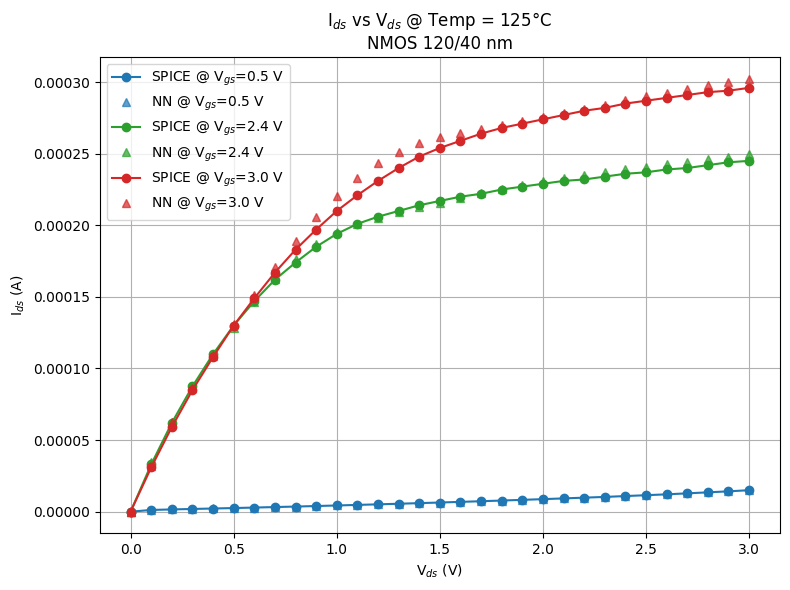

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 0  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 120/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


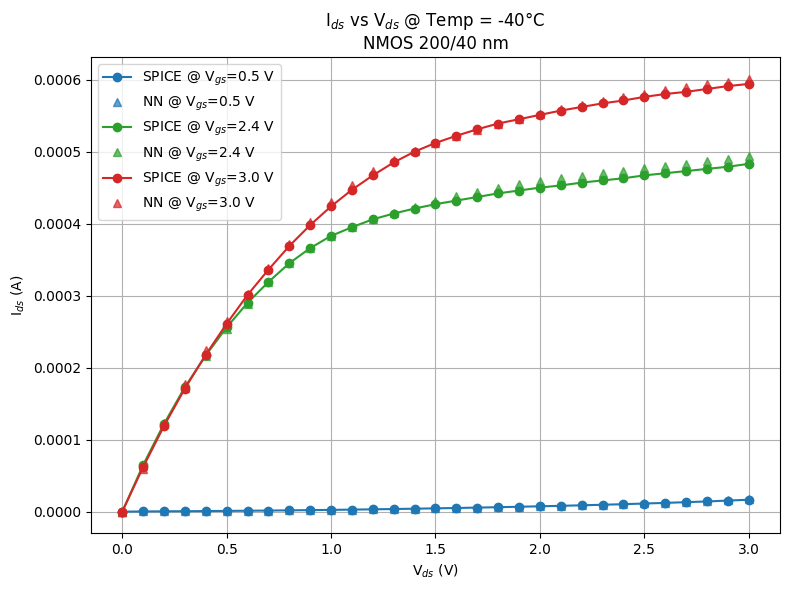

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


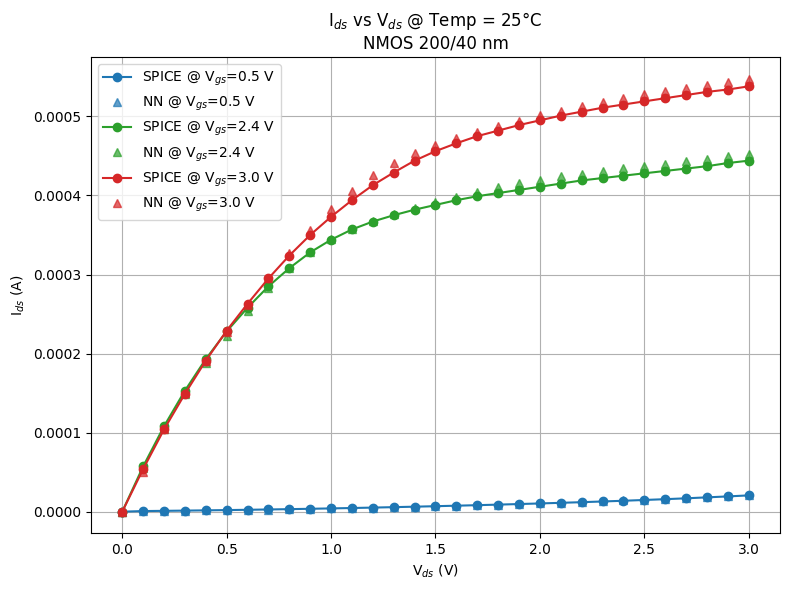

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


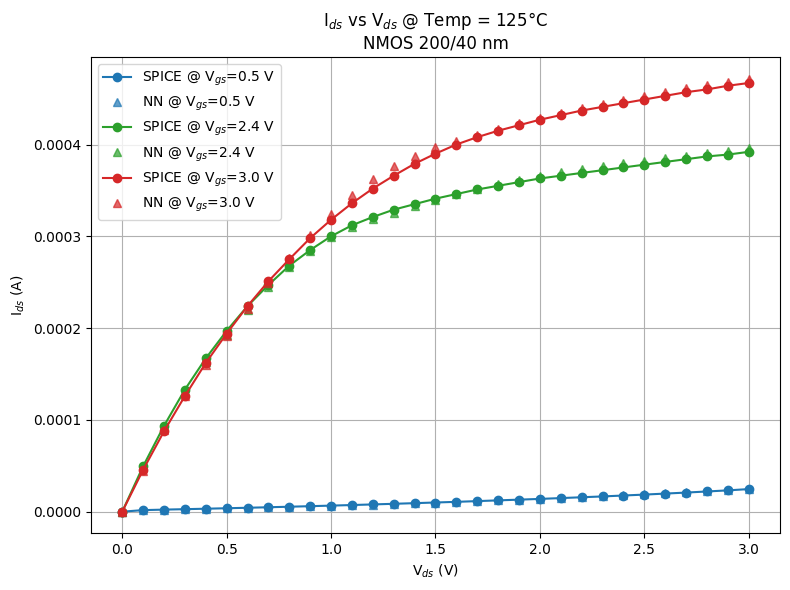

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 1  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 200/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


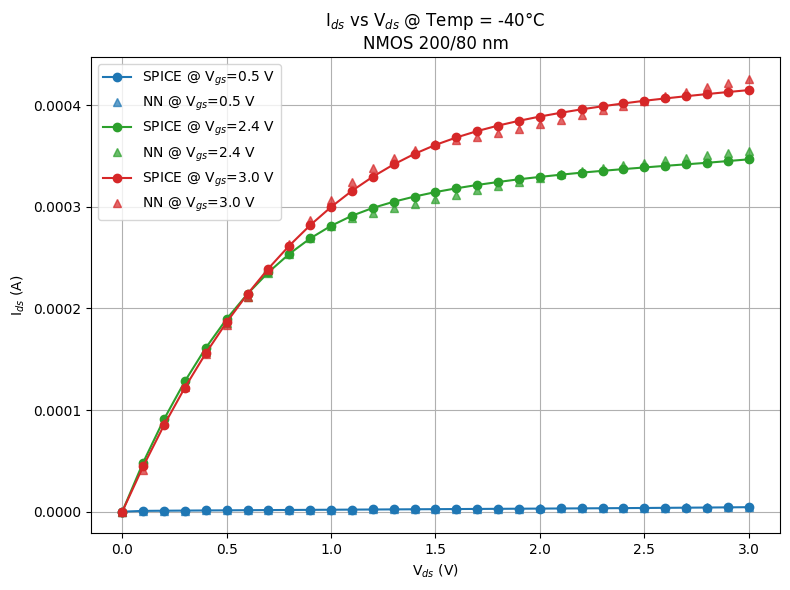

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


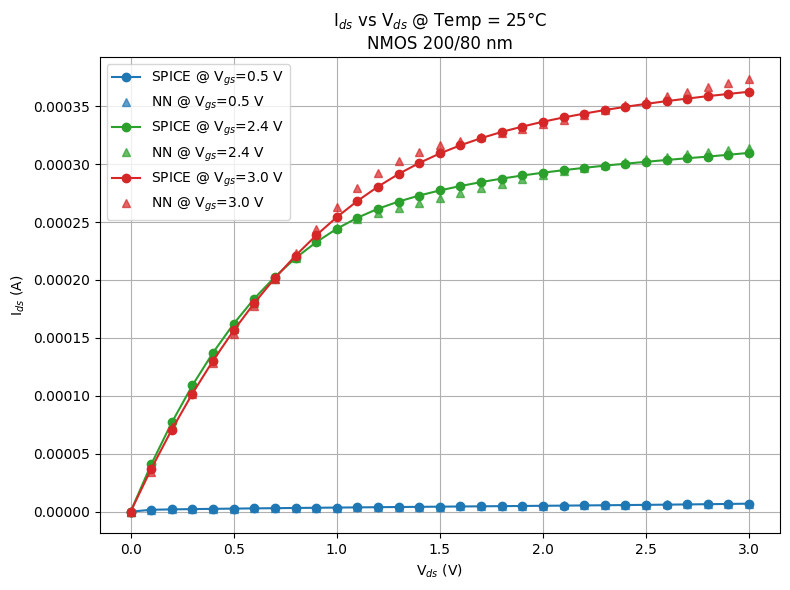

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


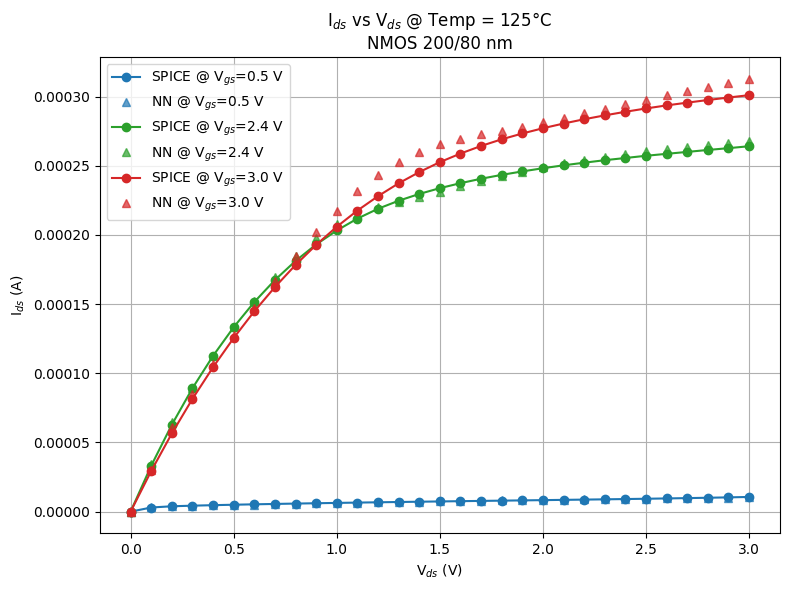

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 2  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 200/80 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


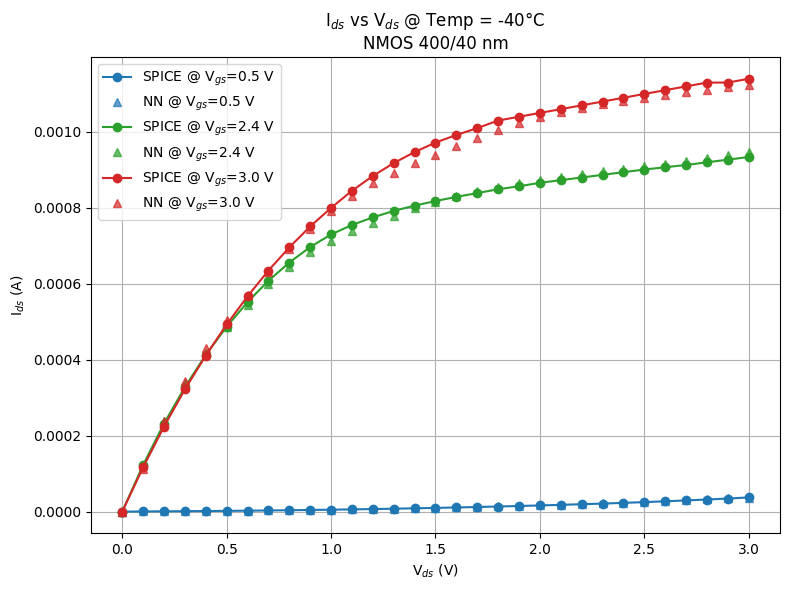

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


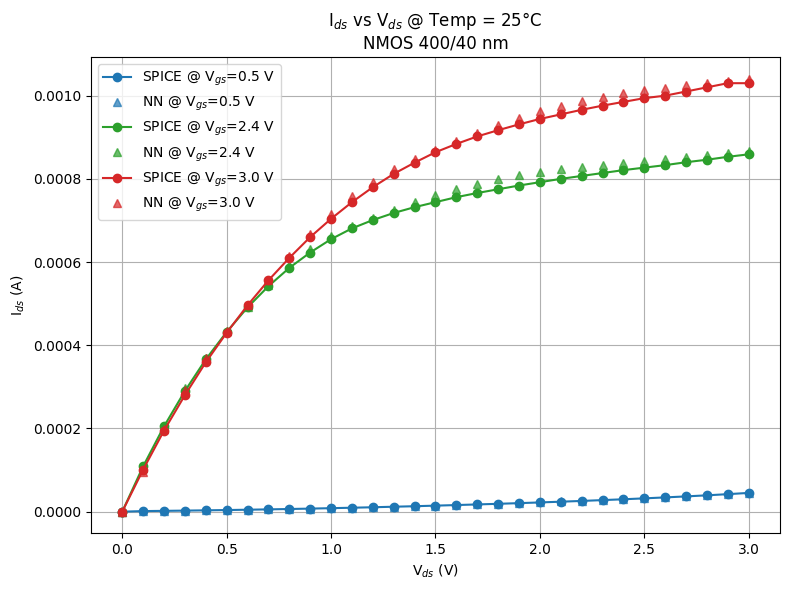

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


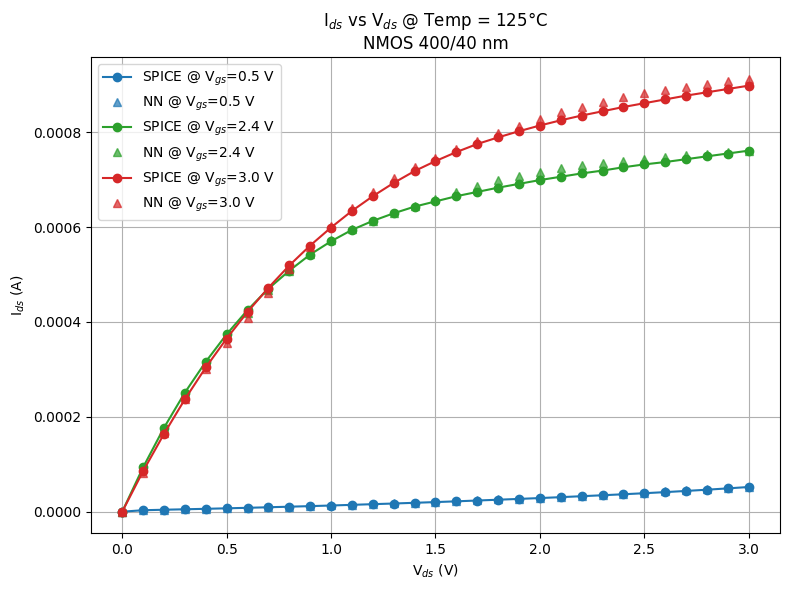

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 3  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 400/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


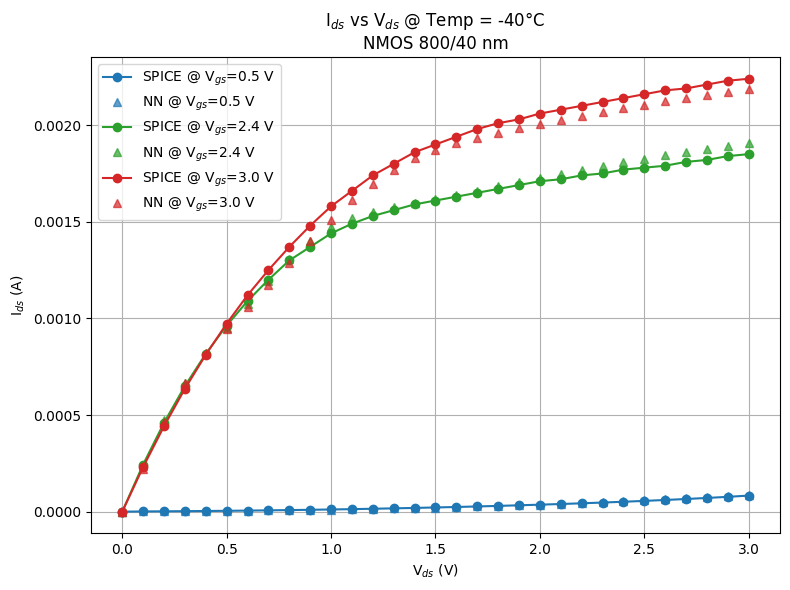

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


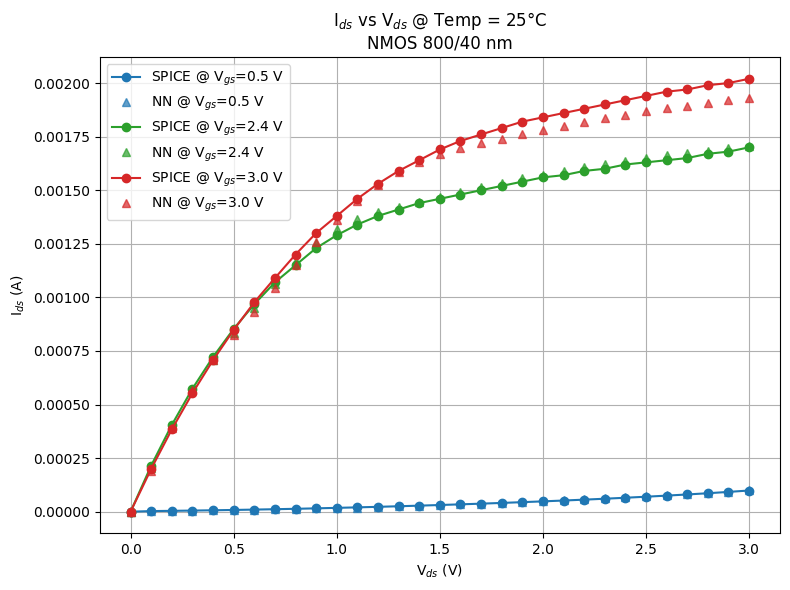

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


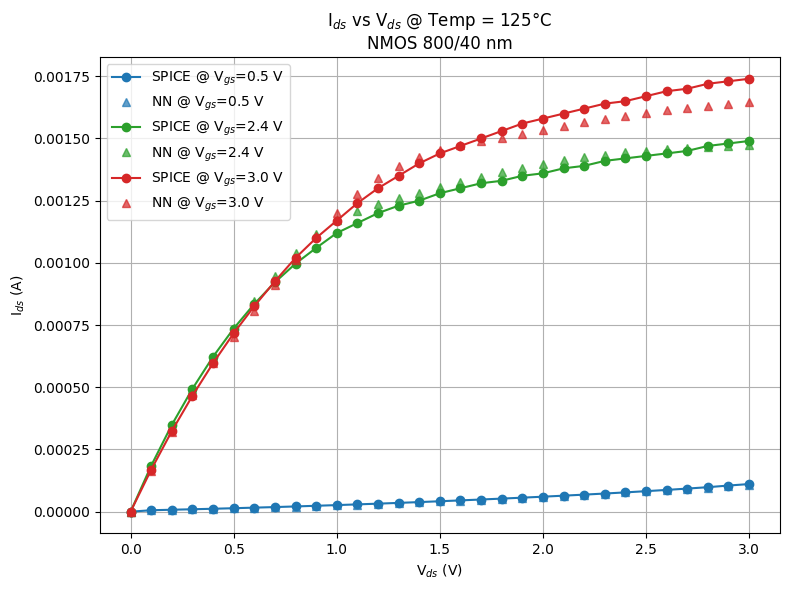

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 4  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 800/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


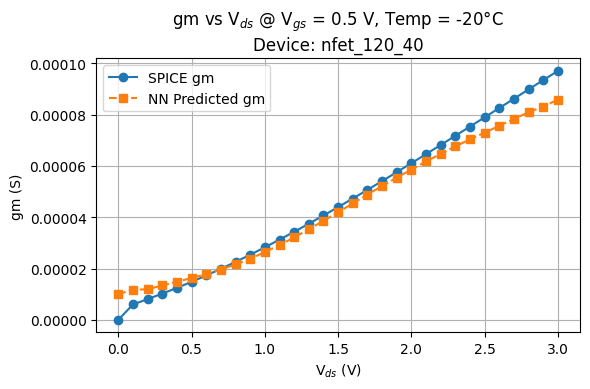

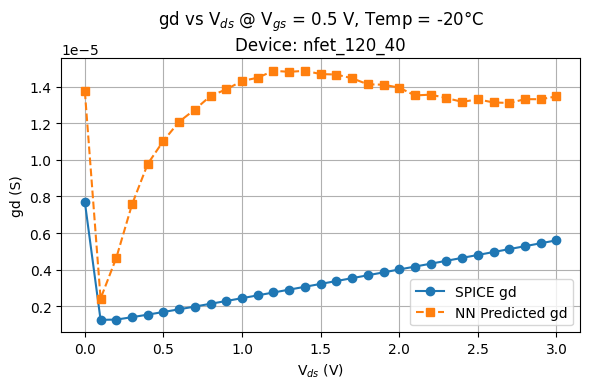

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

VGS_TARGET = 0.5
TEMP_TARGET = -20

df_spice = pd.read_csv("nfet_120_40-1.CSV").sort_values(by=["V_gs", "V_ds"])
mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
df_filtered = df_spice[mask].sort_values(by="V_ds")

if df_filtered.empty:
    print(f"⚠️ No data found for Vgs={VGS_TARGET} V, Temp={TEMP_TARGET}°C")
else:
    signature = device_signatures[0]  # nfet_120_40
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gd_pred_scaled = y_pred[:, 2]

    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()
    gd_pred = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    gm_spice = df_filtered["gm"].values
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.figure(figsize=(6, 4))
    plt.plot(vds_vals, gm_spice, "o-", label="SPICE gm")
    plt.plot(vds_vals, gm_pred, "s--", label="NN Predicted gm")
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("gm (S)")
    plt.title(f"gm vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET:.1f} V, Temp = {TEMP_TARGET}°C\nDevice: nfet_120_40")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot gd
    plt.figure(figsize=(6, 4))
    plt.plot(vds_vals, gd_spice, "o-", label="SPICE gd")
    plt.plot(vds_vals, gd_pred, "s--", label="NN Predicted gd")
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("gd (S)")
    plt.title(f"gd vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET:.1f} V, Temp = {TEMP_TARGET}°C\nDevice: nfet_120_40")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


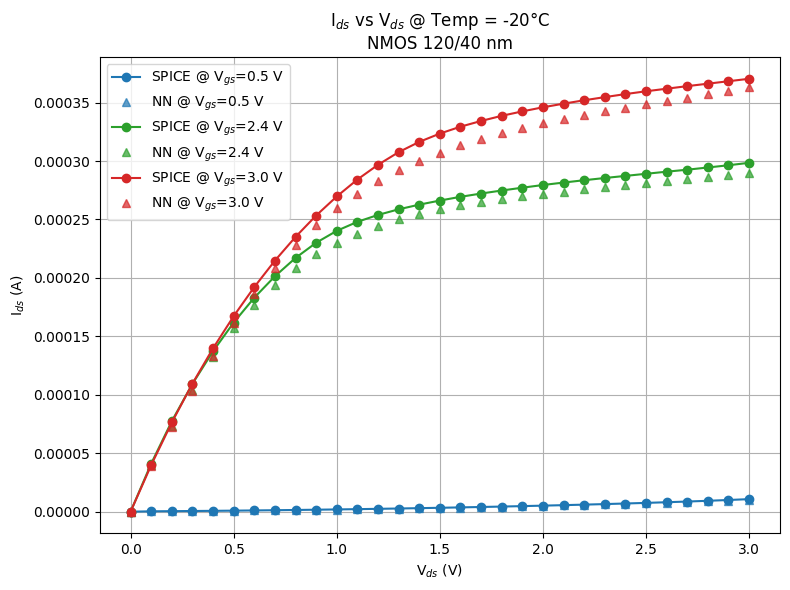

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


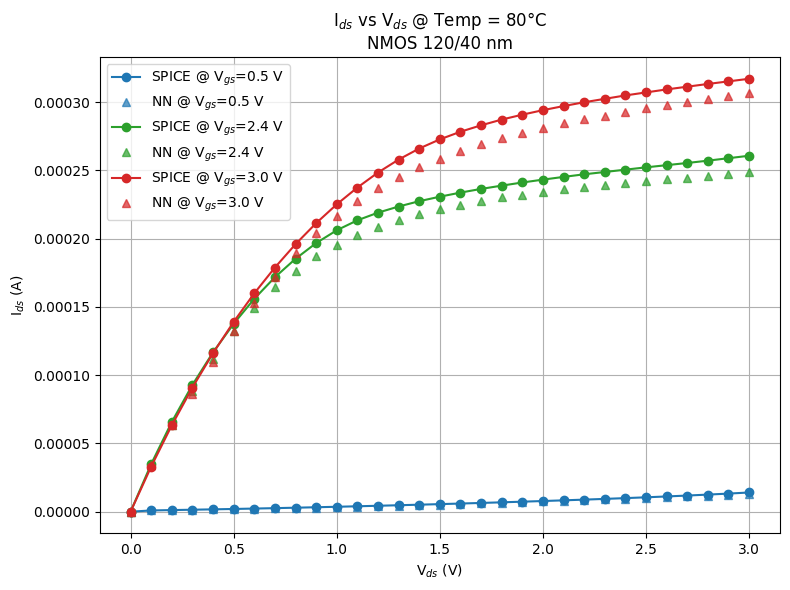

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 0  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_120_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 120/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


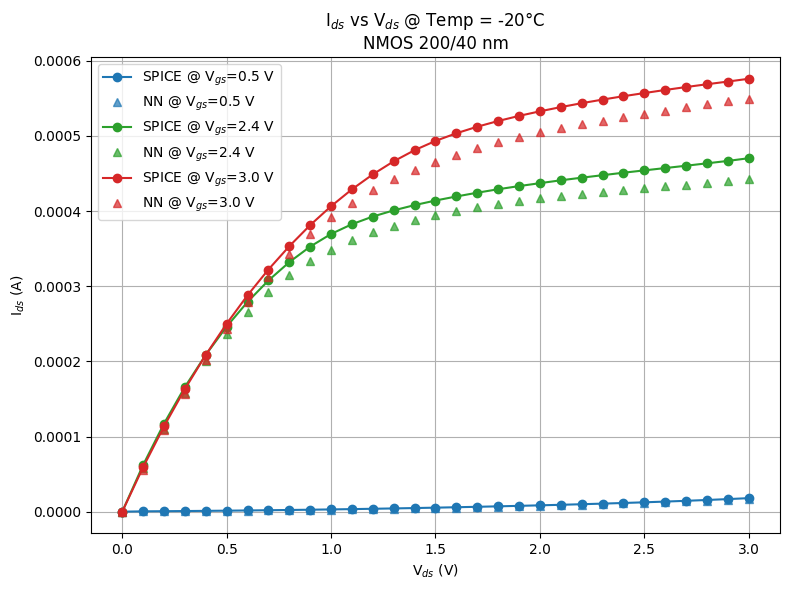

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


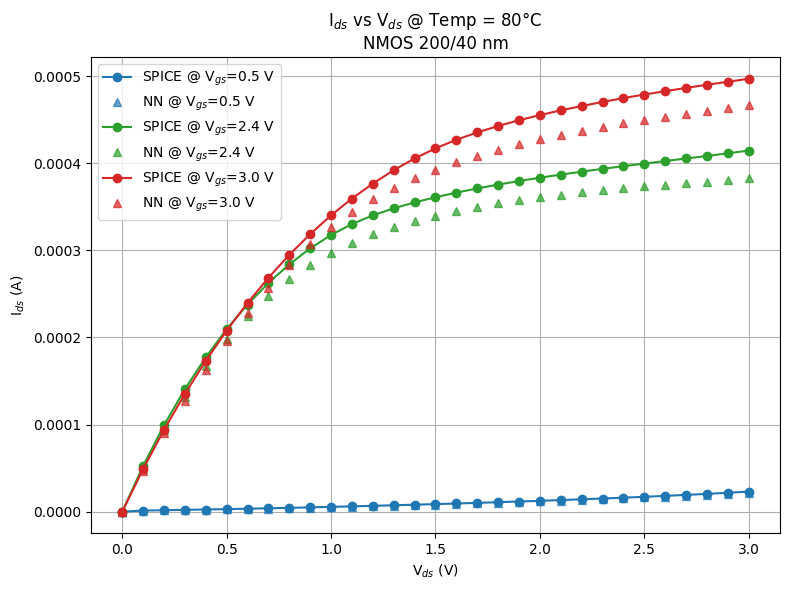

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 1  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_200_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 200/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


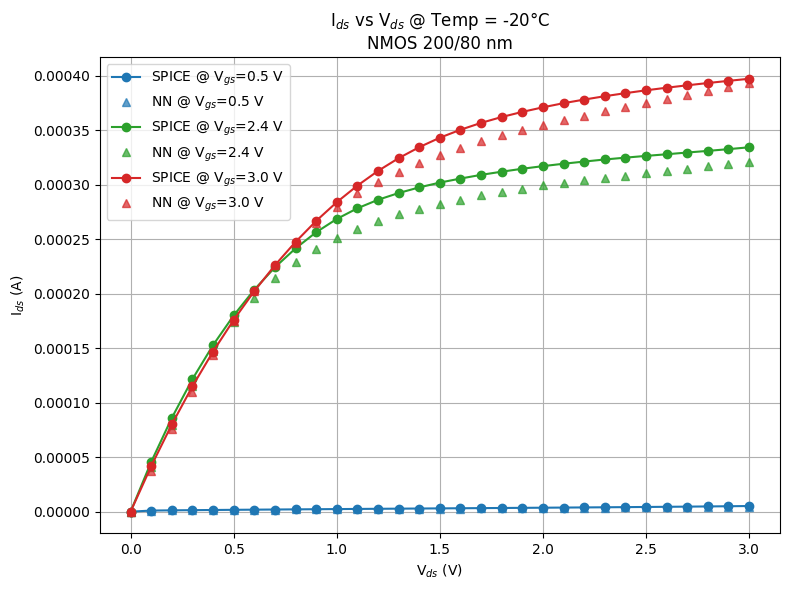

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


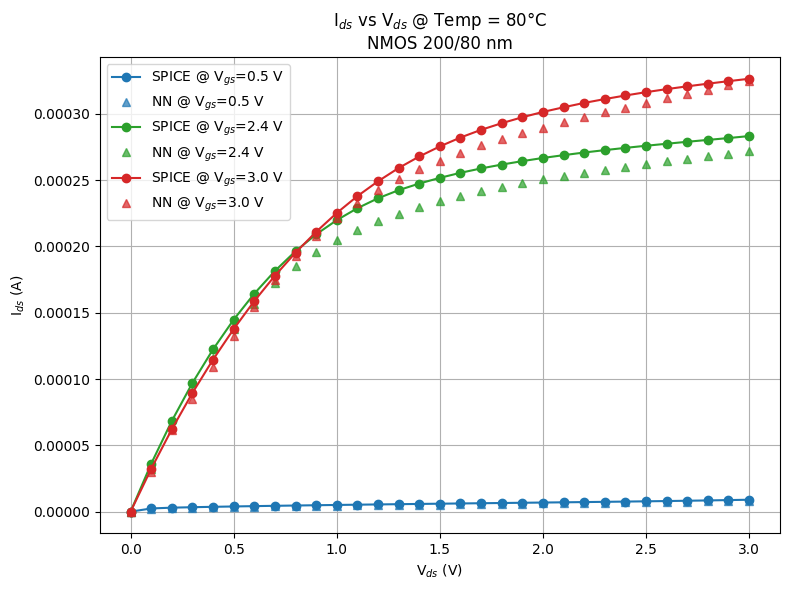

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 2  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_200_80-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 200/80 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


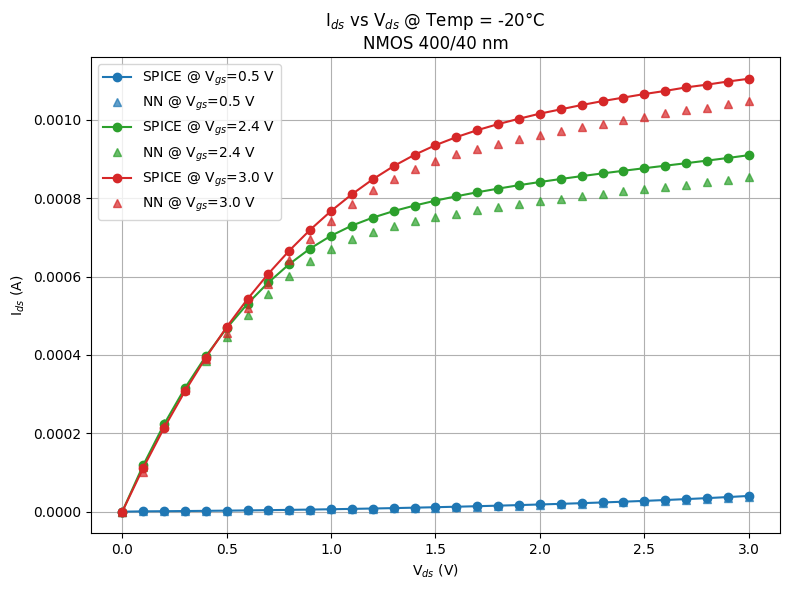

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


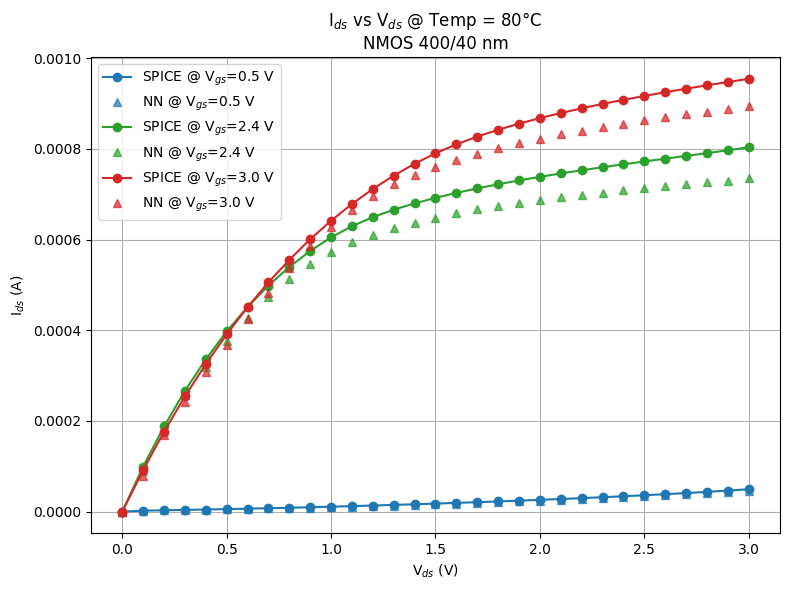

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 3  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_400_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 400/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


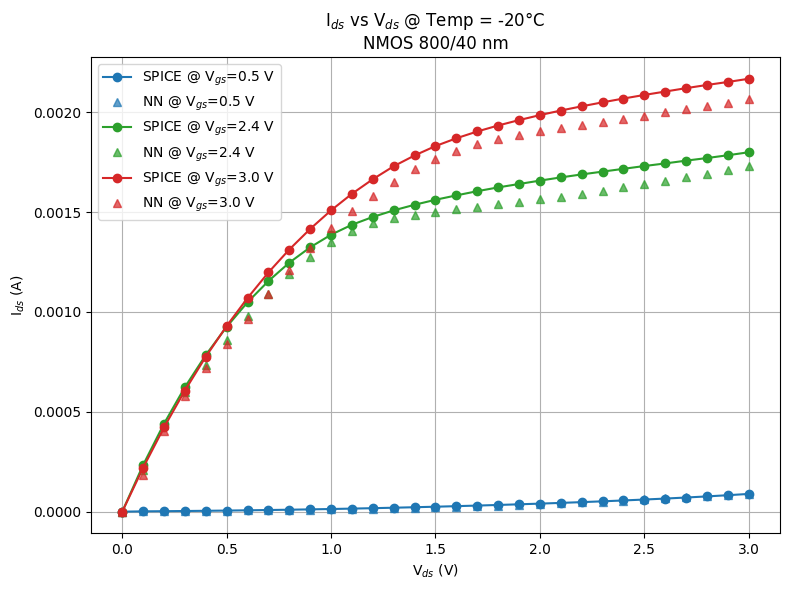

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


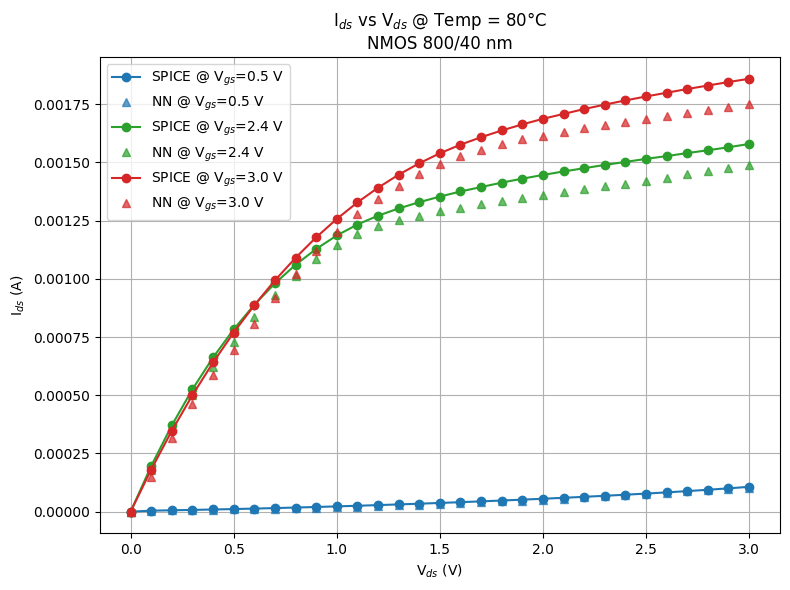

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 4  # nfet_200_80.csv
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load NMOS data
df_spice = pd.read_csv("nfet_800_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color = COLOR_MAP[VGS_TARGET]
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # Prepare NN input
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)
        y_pred = model.predict(X_scaled)
        log_Id_pred = y_pred[:, 0]
        Id_pred = 10 ** log_Id_pred

        # SPICE
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE @ V$_{{gs}}$={VGS_TARGET} V")
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle='None', alpha=0.7, label=f"NN @ V$_{{gs}}$={VGS_TARGET} V")

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 800/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [2]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 23.3 MB/s eta 0:00:00


In [9]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam


In [17]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam

# ---- Step 1: Data Loading ----
device_files = [
    "nfet_120_40.CSV",
    "nfet_200_40.CSV",
    "nfet_200_80.CSV",
    "nfet_400_40.CSV",
    "nfet_800_40.CSV"
]

flattened_vectors = []
per_device_raw_data = []

for path in device_files:
    df = pd.read_csv(path).sort_values(by=["V_gs", "V_ds"])
    Id = df["I_ds"].values
    gm = df["gm"].values
    gds = df["gds"].values
    flat = np.stack([Id, gm, gds], axis=1).flatten()
    flattened_vectors.append(flat)
    per_device_raw_data.append(df)

device_matrix = np.array(flattened_vectors)
pca = PCA(n_components=3)
device_signatures = pca.fit_transform(device_matrix)

# ---- Step 2: Feature Construction ----
X = []
y_id, y_gm, y_gd = [], [], []

for i, df in enumerate(per_device_raw_data):
    P = device_signatures[i]
    for _, row in df.iterrows():
        vgs = row["V_gs"]
        vds = row["V_ds"]
        temp = row["temp"]
        id_val = max(row["I_ds"], 1e-12)
        gm_val = row["gm"]
        gd_val = row["gds"]
        X.append([*P, vgs, vds, temp])
        y_id.append(np.log10(id_val))
        y_gm.append(gm_val)
        y_gd.append(gd_val)

X = np.array(X)
y_id = np.array(y_id)
y_gm = np.array(y_gm)
y_gd = np.array(y_gd)

# ---- Step 3: Scaling ----
scaler_gm = StandardScaler()
scaler_gd = StandardScaler()
y_gm_scaled = scaler_gm.fit_transform(y_gm.reshape(-1, 1)).flatten()
y_gd_scaled = scaler_gd.fit_transform(y_gd.reshape(-1, 1)).flatten()

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

y_combined = np.stack([y_id, y_gm_scaled, y_gd_scaled], axis=1)

print("X_scaled shape:", X_scaled.shape)
print("y_combined shape:", y_combined.shape)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_combined, test_size=0.2, random_state=42)


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


X_scaled shape: (9300, 6)
y_combined shape: (9300, 3)


In [18]:
import optuna

def create_model(loss_weights):
    w_Id, w_gm, w_gd, w_gm_smooth, w_gd_smooth, w_gm_second, w_gd_second = loss_weights

    def hybrid_loss_optuna(y_true, y_pred):
        log_Id_true = y_true[:, 0]
        gm_true     = y_true[:, 1]
        gd_true     = y_true[:, 2]

        log_Id_pred = y_pred[:, 0]
        gm_pred     = y_pred[:, 1]
        gd_pred     = y_pred[:, 2]

        loss_Id = tf.reduce_mean(tf.square(log_Id_true - log_Id_pred))
        loss_gm = tf.reduce_mean(tf.square(gm_true - gm_pred))
        loss_gd = tf.reduce_mean(tf.square(gd_true - gd_pred))

        gm_smooth = tf.reduce_mean(tf.square(gm_pred[1:] - gm_pred[:-1]))
        gd_smooth = tf.reduce_mean(tf.square(gd_pred[1:] - gd_pred[:-1]))

        gm_second = tf.reduce_mean(tf.square(gm_pred[2:] - 2 * gm_pred[1:-1] + gm_pred[:-2]))
        gd_second = tf.reduce_mean(tf.square(gd_pred[2:] - 2 * gd_pred[1:-1] + gd_pred[:-2]))

        total_loss = (
            w_Id * loss_Id +
            w_gm * loss_gm +
            w_gd * loss_gd +
            w_gm_smooth * gm_smooth +
            w_gd_smooth * gd_smooth +
            w_gm_second * gm_second +
            w_gd_second * gd_second
        )
        return total_loss

    model = Sequential([
        Input(shape=(6,)),
        Dense(64, activation='tanh'),
        Dense(64, activation='tanh'),
        Dense(64, activation='tanh'),
        Dense(64, activation='tanh'),
        Dense(3)
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss=hybrid_loss_optuna)
    return model


In [19]:
def objective(trial):
    # Suggested loss weights using your specified ranges
    w_Id   = trial.suggest_float("w_Id", 2.0, 6.0)
    w_gm   = trial.suggest_float("w_gm", 1.0, 4.0)
    w_gd   = trial.suggest_float("w_gd", 0.5, 2.0)
    w_gm_s = trial.suggest_float("w_gm_smooth", 0.001, 0.05)
    w_gd_s = trial.suggest_float("w_gd_smooth", 0.001, 0.05)
    w_gm_2 = trial.suggest_float("w_gm_second", 0.0001, 0.01)
    w_gd_2 = trial.suggest_float("w_gd_second", 0.0001, 0.01)

    weights = [w_Id, w_gm, w_gd, w_gm_s, w_gd_s, w_gm_2, w_gd_2]

    # Create model with current trial's weights
    model = create_model(weights)

    # Train briefly to evaluate performance
    history = model.fit(X_train, y_train, validation_split=0.1, epochs=50, batch_size=64, verbose=0)

    # Return final validation loss for optimization
    return history.history["val_loss"][-1]


In [20]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=30)  # You can increase trials for better tuning
print("\nBest loss weights found:")
for key, val in study.best_params.items():
    print(f"{key}: {val:.4f}")


[I 2025-05-13 07:36:50,469] A new study created in memory with name: no-name-68b5408f-b473-4d54-9893-fc758ffda459
[I 2025-05-13 07:37:13,227] Trial 0 finished with value: 0.23385608196258545 and parameters: {'w_Id': 4.151740372321786, 'w_gm': 1.7742556917846393, 'w_gd': 1.6155331173736653, 'w_gm_smooth': 0.04483730360611687, 'w_gd_smooth': 0.03731192019766828, 'w_gm_second': 0.005954231009501321, 'w_gd_second': 0.005614439474303829}. Best is trial 0 with value: 0.23385608196258545.
[I 2025-05-13 07:37:33,028] Trial 1 finished with value: 0.17000791430473328 and parameters: {'w_Id': 2.4829226346795314, 'w_gm': 2.736372951352938, 'w_gd': 1.350931989742695, 'w_gm_smooth': 0.021043781217641597, 'w_gd_smooth': 0.0415470025657003, 'w_gm_second': 0.0038101262078728965, 'w_gd_second': 0.0024185303064736233}. Best is trial 1 with value: 0.17000791430473328.
[I 2025-05-13 07:37:52,796] Trial 2 finished with value: 0.3079397976398468 and parameters: {'w_Id': 5.457465123383475, 'w_gm': 3.118719518


Best loss weights found:
w_Id: 2.2956
w_gm: 1.4448
w_gd: 0.8774
w_gm_smooth: 0.0099
w_gd_smooth: 0.0019
w_gm_second: 0.0001
w_gd_second: 0.0014


In [21]:
print("Best trial:")
print(study.best_trial)

best_weights = [
    study.best_params["w_Id"],
    study.best_params["w_gm"],
    study.best_params["w_gd"],
    study.best_params["w_gm_smooth"],
    study.best_params["w_gd_smooth"],
    study.best_params["w_gm_second"],
    study.best_params["w_gd_second"]
]

Best trial:
FrozenTrial(number=23, state=1, values=[0.04793092608451843], datetime_start=datetime.datetime(2025, 5, 13, 7, 44, 32, 830353), datetime_complete=datetime.datetime(2025, 5, 13, 7, 44, 52, 885829), params={'w_Id': 2.2955909989463463, 'w_gm': 1.4447626648891663, 'w_gd': 0.8773563299264988, 'w_gm_smooth': 0.009885419481312364, 'w_gd_smooth': 0.0019069689250768573, 'w_gm_second': 0.00011330031157765776, 'w_gd_second': 0.0013511476882623733}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'w_Id': FloatDistribution(high=6.0, log=False, low=2.0, step=None), 'w_gm': FloatDistribution(high=4.0, log=False, low=1.0, step=None), 'w_gd': FloatDistribution(high=2.0, log=False, low=0.5, step=None), 'w_gm_smooth': FloatDistribution(high=0.05, log=False, low=0.001, step=None), 'w_gd_smooth': FloatDistribution(high=0.05, log=False, low=0.001, step=None), 'w_gm_second': FloatDistribution(high=0.01, log=False, low=0.0001, step=None), 'w_gd_second': FloatDistribution(hig

In [88]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Create model using the best weights
model = create_model(best_weights)

# Save only the best model during retraining
checkpoint_final = ModelCheckpoint(
    "best_final_model.h5",
    monitor="val_loss",
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

# Train final model thoroughly
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=400,
    batch_size=150,
    callbacks=[checkpoint_final],
    verbose=1
)


Epoch 1/400
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 36.0241
Epoch 1: val_loss improved from inf to 12.29222, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 35.7107 - val_loss: 12.2922
Epoch 2/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.7198
Epoch 2: val_loss improved from 12.29222 to 8.86505, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 11.5455 - val_loss: 8.8650
Epoch 3/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.3709 
Epoch 3: val_loss improved from 8.86505 to 6.76131, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.9760 - val_loss: 6.7613
Epoch 4/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8845 
Epoch 4: val_loss improved from 6.76131 to 5.63257, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8256 - val_loss: 5.6326
Epoch 5/400
23/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.6253 
Epoch 5: val_loss improved from 5.63257 to 4.83994, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7075 - val_loss: 4.8399
Epoch 6/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6955 
Epoch 6: val_loss improved from 4.83994 to 4.26985, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7916 - val_loss: 4.2699
Epoch 7/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.4162 
Epoch 7: val_loss improved from 4.26985 to 3.98016, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4684 - val_loss: 3.9802
Epoch 8/400
24/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2555 
Epoch 8: val_loss improved from 3.98016 to 3.80464, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3516 - val_loss: 3.8046
Epoch 9/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.3421 
Epoch 9: val_loss improved from 3.80464 to 3.60290, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2749 - val_loss: 3.6029
Epoch 10/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7847 
Epoch 10: val_loss improved from 3.60290 to 3.32131, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8348 - val_loss: 3.3213
Epoch 11/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4527 
Epoch 11: val_loss improved from 3.32131 to 3.07225, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5098 - val_loss: 3.0723
Epoch 12/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5271 
Epoch 12: val_loss improved from 3.07225 to 2.82202, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4611 - val_loss: 2.8220
Epoch 13/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2042 
Epoch 13: val_loss improved from 2.82202 to 2.58383, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1554 - val_loss: 2.5838
Epoch 14/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5888 
Epoch 14: val_loss improved from 2.58383 to 2.35979, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6668 - val_loss: 2.3598
Epoch 15/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6155 
Epoch 15: val_loss improved from 2.35979 to 2.12098, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5547 - val_loss: 2.1210
Epoch 16/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4225 
Epoch 16: val_loss improved from 2.12098 to 2.04359, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.3760 - val_loss: 2.0436
Epoch 17/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1020 
Epoch 17: val_loss improved from 2.04359 to 1.73570, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0763 - val_loss: 1.7357
Epoch 18/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8995 
Epoch 18: val_loss improved from 1.73570 to 1.53280, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.8716 - val_loss: 1.5328
Epoch 19/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3984 
Epoch 19: val_loss improved from 1.53280 to 1.29805, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4177 - val_loss: 1.2981
Epoch 20/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3336 
Epoch 20: val_loss improved from 1.29805 to 1.14262, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2856 - val_loss: 1.1426
Epoch 21/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1093 
Epoch 21: val_loss improved from 1.14262 to 0.98580, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1163 - val_loss: 0.9858
Epoch 22/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1159 
Epoch 22: val_loss improved from 0.98580 to 0.73181, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0619 - val_loss: 0.7318
Epoch 23/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7345 
Epoch 23: val_loss improved from 0.73181 to 0.71574, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7522 - val_loss: 0.7157
Epoch 24/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7538 
Epoch 24: val_loss improved from 0.71574 to 0.71421, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7442 - val_loss: 0.7142
Epoch 25/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6319 
Epoch 25: val_loss improved from 0.71421 to 0.47756, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6150 - val_loss: 0.4776
Epoch 26/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4906 
Epoch 26: val_loss improved from 0.47756 to 0.39845, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4716 - val_loss: 0.3985
Epoch 27/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3776 
Epoch 27: val_loss improved from 0.39845 to 0.32757, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3749 - val_loss: 0.3276
Epoch 28/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3031 
Epoch 28: val_loss improved from 0.32757 to 0.29633, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3102 - val_loss: 0.2963
Epoch 29/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2956 
Epoch 29: val_loss improved from 0.29633 to 0.24988, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2816 - val_loss: 0.2499
Epoch 30/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2274 
Epoch 30: val_loss improved from 0.24988 to 0.23899, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2281 - val_loss: 0.2390
Epoch 31/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2174 
Epoch 31: val_loss improved from 0.23899 to 0.19285, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2140 - val_loss: 0.1928
Epoch 32/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1837 
Epoch 32: val_loss did not improve from 0.19285
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1836 - val_loss: 0.2266
Epoch 33/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2141 
Epoch 33: val_loss improved from 0.19285 to 0.16728, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2150 - val_loss: 0.1673
Epoch 34/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1984 
Epoch 34: val_loss improved from 0.16728 to 0.15058, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1968 - val_loss: 0.1506
Epoch 35/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1464 
Epoch 35: val_loss improved from 0.15058 to 0.14772, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1461 - val_loss: 0.1477
Epoch 36/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1534 
Epoch 36: val_loss improved from 0.14772 to 0.13762, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1488 - val_loss: 0.1376
Epoch 37/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1220 
Epoch 37: val_loss improved from 0.13762 to 0.13280, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1225 - val_loss: 0.1328
Epoch 38/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1155 
Epoch 38: val_loss improved from 0.13280 to 0.12806, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1172 - val_loss: 0.1281
Epoch 39/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1107 
Epoch 39: val_loss improved from 0.12806 to 0.11262, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1121 - val_loss: 0.1126
Epoch 40/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1148 
Epoch 40: val_loss did not improve from 0.11262
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1143 - val_loss: 0.1141
Epoch 41/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1056 
Epoch 41: val_loss improved from 0.11262 to 0.10454, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1062 - val_loss: 0.1045
Epoch 42/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1013 
Epoch 42: val_loss did not improve from 0.10454
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1024 - val_loss: 0.1066
Epoch 43/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0908 
Epoch 43: val_loss improved from 0.10454 to 0.10108, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0938 - val_loss: 0.1011
Epoch 44/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0930 
Epoch 44: val_loss improved from 0.10108 to 0.09753, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0941 - val_loss: 0.0975
Epoch 45/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0882 
Epoch 45: val_loss improved from 0.09753 to 0.09210, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0900 - val_loss: 0.0921
Epoch 46/400
23/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0940 
Epoch 46: val_loss improved from 0.09210 to 0.08779, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0920 - val_loss: 0.0878
Epoch 47/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0833 
Epoch 47: val_loss improved from 0.08779 to 0.08640, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0834 - val_loss: 0.0864
Epoch 48/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0874 
Epoch 48: val_loss did not improve from 0.08640
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0890 - val_loss: 0.0888
Epoch 49/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0869 
Epoch 49: val_loss improved from 0.08640 to 0.08232, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0853 - val_loss: 0.0823
Epoch 50/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0777 
Epoch 50: val_loss did not improve from 0.08232
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0782 - val_loss: 0.0860
Epoch 51/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0886 
Epoch 51: val_loss improved from 0.08232 to 0.08102, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0865 - val_loss: 0.0810
Epoch 52/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0806 
Epoch 52: val_loss did not improve from 0.08102
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0794 - val_loss: 0.1118
Epoch 53/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0824 
Epoch 53: val_loss did not improve from 0.08102
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0824 - val_loss: 0.0860
Epoch 54/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0795 
Epoch 54: val_loss did not improve from 0.08102
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0787 - val_loss: 0.0864
Epoch 55/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0794 
Epoch 55: val_loss did not improve from 0.08102
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0799 - val_loss: 0.0824
Epoch 56/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0844 
Epoch 56: val_loss did not improve from 0.08102
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0826 -

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0719 - val_loss: 0.0679
Epoch 58/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0705 
Epoch 58: val_loss did not improve from 0.06788
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0704 - val_loss: 0.0685
Epoch 59/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0784 
Epoch 59: val_loss did not improve from 0.06788
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0768 - val_loss: 0.0699
Epoch 60/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0660 
Epoch 60: val_loss improved from 0.06788 to 0.06315, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0664 - val_loss: 0.0631
Epoch 61/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0632 
Epoch 61: val_loss did not improve from 0.06315
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0639 - val_loss: 0.0671
Epoch 62/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0663 
Epoch 62: val_loss did not improve from 0.06315
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0658 - val_loss: 0.0679
Epoch 63/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0688 
Epoch 63: val_loss did not improve from 0.06315
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0678 - val_loss: 0.0637
Epoch 64/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0631 
Epoch 64: val_loss improved from 0.06315 to 0.06018, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0639 - val_loss: 0.0602
Epoch 65/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0655 
Epoch 65: val_loss did not improve from 0.06018
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0643 - val_loss: 0.0612
Epoch 66/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0575 
Epoch 66: val_loss did not improve from 0.06018
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0585 - val_loss: 0.0659
Epoch 67/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0577 
Epoch 67: val_loss did not improve from 0.06018
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0587 - val_loss: 0.0676
Epoch 68/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0647 
Epoch 68: val_loss improved from 0.06018 to 0.05973, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0632 - val_loss: 0.0597
Epoch 69/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0554 
Epoch 69: val_loss did not improve from 0.05973
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0563 - val_loss: 0.0612
Epoch 70/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0658 
Epoch 70: val_loss did not improve from 0.05973
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0676 - val_loss: 0.1838
Epoch 71/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0990 
Epoch 71: val_loss did not improve from 0.05973
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0893 - val_loss: 0.0702
Epoch 72/400
22/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0599 
Epoch 72: val_loss did not improve from 0.05973
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0617 - val_loss: 0.0606
Epoch 73/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0570 
Epoch 73: val_loss improved from 0.05973 to 0.05552, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0567 - val_loss: 0.0555
Epoch 74/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0583 
Epoch 74: val_loss did not improve from 0.05552
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0576 - val_loss: 0.0617
Epoch 75/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0748 
Epoch 75: val_loss did not improve from 0.05552
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0728 - val_loss: 0.0635
Epoch 76/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0594 
Epoch 76: val_loss did not improve from 0.05552
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0607 - val_loss: 0.0624
Epoch 77/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0599 
Epoch 77: val_loss improved from 0.05552 to 0.05464, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0588 - val_loss: 0.0546
Epoch 78/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0526 
Epoch 78: val_loss did not improve from 0.05464
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0529 - val_loss: 0.0565
Epoch 79/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0530 
Epoch 79: val_loss did not improve from 0.05464
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0553 - val_loss: 0.0572
Epoch 80/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0601 
Epoch 80: val_loss did not improve from 0.05464
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0603 - val_loss: 0.0652
Epoch 81/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0671 
Epoch 81: val_loss did not improve from 0.05464
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0661 - val_loss: 0.0575
Epoch 82/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0577 
Epoch 82: val_loss improved from 0.05464 to 0.05323, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0565 - val_loss: 0.0532
Epoch 83/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0463 
Epoch 83: val_loss improved from 0.05323 to 0.04805, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0473 - val_loss: 0.0481
Epoch 84/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0510 
Epoch 84: val_loss did not improve from 0.04805
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0511 - val_loss: 0.0484
Epoch 85/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0511 
Epoch 85: val_loss did not improve from 0.04805
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0521 - val_loss: 0.0585
Epoch 86/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0570 
Epoch 86: val_loss did not improve from 0.04805
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0561 - val_loss: 0.0487
Epoch 87/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0542 
Epoch 87: val_loss did not improve from 0.04805
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0561 - val_loss: 0.0653
Epoch 88/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0568 
Epoch 88: val_loss improved from 0.04805 to 0.04652, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0567 - val_loss: 0.0465
Epoch 89/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0481 
Epoch 89: val_loss did not improve from 0.04652
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0484 - val_loss: 0.0478
Epoch 90/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0524 
Epoch 90: val_loss improved from 0.04652 to 0.04554, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0512 - val_loss: 0.0455
Epoch 91/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0485 
Epoch 91: val_loss did not improve from 0.04554
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0489 - val_loss: 0.0486
Epoch 92/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0486 
Epoch 92: val_loss improved from 0.04554 to 0.04470, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0486 - val_loss: 0.0447
Epoch 93/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0447 
Epoch 93: val_loss did not improve from 0.04470
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0453 - val_loss: 0.0459
Epoch 94/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0439 
Epoch 94: val_loss did not improve from 0.04470
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0450 - val_loss: 0.0467
Epoch 95/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0529 
Epoch 95: val_loss did not improve from 0.04470
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0532 - val_loss: 0.0529
Epoch 96/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0540 
Epoch 96: val_loss did not improve from 0.04470
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0545 - val_loss: 0.0548
Epoch 97/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0609 
Epoch 97: val_loss did not improve from 0.04470
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0618 -

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0474 - val_loss: 0.0433
Epoch 102/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0452 
Epoch 102: val_loss improved from 0.04331 to 0.04300, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0449 - val_loss: 0.0430
Epoch 103/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0434 
Epoch 103: val_loss did not improve from 0.04300
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0437 - val_loss: 0.0432
Epoch 104/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0475 
Epoch 104: val_loss did not improve from 0.04300
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0474 - val_loss: 0.0432
Epoch 105/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0470 
Epoch 105: val_loss improved from 0.04300 to 0.04133, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0461 - val_loss: 0.0413
Epoch 106/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0463 
Epoch 106: val_loss improved from 0.04133 to 0.04118, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0456 - val_loss: 0.0412
Epoch 107/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0414 
Epoch 107: val_loss did not improve from 0.04118
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0422 - val_loss: 0.0450
Epoch 108/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0427 
Epoch 108: val_loss did not improve from 0.04118
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0428 - val_loss: 0.0429
Epoch 109/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0433 
Epoch 109: val_loss did not improve from 0.04118
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0432 - val_loss: 0.0427
Epoch 110/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0461 
Epoch 110: val_loss improved from 0.04118 to 0.04032, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0451 - val_loss: 0.0403
Epoch 111/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0437 
Epoch 111: val_loss did not improve from 0.04032
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0430 - val_loss: 0.0420
Epoch 112/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0438 
Epoch 112: val_loss did not improve from 0.04032
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0443 - val_loss: 0.0455
Epoch 113/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0701 
Epoch 113: val_loss did not improve from 0.04032
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0910 - val_loss: 0.3864
Epoch 114/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8734 
Epoch 114: val_loss did not improve from 0.04032
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9808 - val_loss: 1.6169
Epoch 115/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7190 
Epoch 115: val_loss did not improve from 0.04032
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0407 - val_loss: 0.0398
Epoch 122/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0406 
Epoch 122: val_loss did not improve from 0.03980
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0409 - val_loss: 0.0418
Epoch 123/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0418 
Epoch 123: val_loss improved from 0.03980 to 0.03936, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0417 - val_loss: 0.0394
Epoch 124/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0424 
Epoch 124: val_loss improved from 0.03936 to 0.03899, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0417 - val_loss: 0.0390
Epoch 125/400
24/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0437 
Epoch 125: val_loss did not improve from 0.03899
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0426 - val_loss: 0.0418
Epoch 126/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0408 
Epoch 126: val_loss did not improve from 0.03899
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0407 - val_loss: 0.0393
Epoch 127/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0384 
Epoch 127: val_loss improved from 0.03899 to 0.03892, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0390 - val_loss: 0.0389
Epoch 128/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0410 
Epoch 128: val_loss improved from 0.03892 to 0.03839, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0410 - val_loss: 0.0384
Epoch 129/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0398 
Epoch 129: val_loss did not improve from 0.03839
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0400 - val_loss: 0.0410
Epoch 130/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0396 
Epoch 130: val_loss improved from 0.03839 to 0.03828, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0398 - val_loss: 0.0383
Epoch 131/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0431 
Epoch 131: val_loss did not improve from 0.03828
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0422 - val_loss: 0.0385
Epoch 132/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0418 
Epoch 132: val_loss improved from 0.03828 to 0.03811, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0418 - val_loss: 0.0381
Epoch 133/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0419 
Epoch 133: val_loss did not improve from 0.03811
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0416 - val_loss: 0.0398
Epoch 134/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376 
Epoch 134: val_loss improved from 0.03811 to 0.03733, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0382 - val_loss: 0.0373
Epoch 135/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0417 
Epoch 135: val_loss did not improve from 0.03733
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0410 - val_loss: 0.0383
Epoch 136/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0402 
Epoch 136: val_loss did not improve from 0.03733
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0401 - val_loss: 0.0379
Epoch 137/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0364 
Epoch 137: val_loss did not improve from 0.03733
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0371 - val_loss: 0.0388
Epoch 138/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0395 
Epoch 138: val_loss did not improve from 0.03733
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0398 - val_loss: 0.0375
Epoch 139/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0403 
Epoch 139: val_loss did not improve from 0.03733
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0385 - val_loss: 0.0373
Epoch 142/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0402 
Epoch 142: val_loss improved from 0.03729 to 0.03678, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0396 - val_loss: 0.0368
Epoch 143/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0385 
Epoch 143: val_loss did not improve from 0.03678
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0386 - val_loss: 0.0369
Epoch 144/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0397 
Epoch 144: val_loss did not improve from 0.03678
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0393 - val_loss: 0.0394
Epoch 145/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0383 
Epoch 145: val_loss improved from 0.03678 to 0.03649, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0388 - val_loss: 0.0365
Epoch 146/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0377 
Epoch 146: val_loss improved from 0.03649 to 0.03641, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0381 - val_loss: 0.0364
Epoch 147/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0403 
Epoch 147: val_loss did not improve from 0.03641
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0401 - val_loss: 0.0365
Epoch 148/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0394 
Epoch 148: val_loss improved from 0.03641 to 0.03631, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0393 - val_loss: 0.0363
Epoch 149/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0373 
Epoch 149: val_loss did not improve from 0.03631
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0377 - val_loss: 0.0386
Epoch 150/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0393 
Epoch 150: val_loss did not improve from 0.03631
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0393 - val_loss: 0.0363
Epoch 151/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0383 
Epoch 151: val_loss did not improve from 0.03631
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0384 - val_loss: 0.0376
Epoch 152/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0402 
Epoch 152: val_loss did not improve from 0.03631
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0401 - val_loss: 0.0392
Epoch 153/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0432 
Epoch 153: val_loss improved from 0.03631 to 0.03623, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0418 - val_loss: 0.0362
Epoch 154/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0362 
Epoch 154: val_loss improved from 0.03623 to 0.03597, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0369 - val_loss: 0.0360
Epoch 155/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0399 
Epoch 155: val_loss did not improve from 0.03597
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0395 - val_loss: 0.0375
Epoch 156/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0399 
Epoch 156: val_loss did not improve from 0.03597
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0394 - val_loss: 0.0384
Epoch 157/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376 
Epoch 157: val_loss did not improve from 0.03597
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0376 - val_loss: 0.0360
Epoch 158/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0390 
Epoch 158: val_loss did not improve from 0.03597
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0386 - val_loss: 0.0361
Epoch 159/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0375 
Epoch 159: val_loss did not improve from 0.03597
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0393 - val_loss: 0.0355
Epoch 163/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0375 
Epoch 163: val_loss did not improve from 0.03546
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0380 - val_loss: 0.0364
Epoch 164/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0406 
Epoch 164: val_loss did not improve from 0.03546
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0397 - val_loss: 0.0362
Epoch 165/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0359 
Epoch 165: val_loss did not improve from 0.03546
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0364 - val_loss: 0.0382
Epoch 166/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0397 
Epoch 166: val_loss did not improve from 0.03546
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0391 - val_loss: 0.0357
Epoch 167/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0371 
Epoch 167: val_loss did not improve from 0.03546
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0383 - val_loss: 0.0350
Epoch 169/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0371 
Epoch 169: val_loss did not improve from 0.03502
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0374 - val_loss: 0.0365
Epoch 170/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0388 
Epoch 170: val_loss did not improve from 0.03502
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0386 - val_loss: 0.0357
Epoch 171/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0365 
Epoch 171: val_loss did not improve from 0.03502
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0369 - val_loss: 0.0357
Epoch 172/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0364 
Epoch 172: val_loss did not improve from 0.03502
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0372 - val_loss: 0.0389
Epoch 173/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0401 
Epoch 173: val_loss did not improve from 0.03502
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0369 - val_loss: 0.0346
Epoch 180/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0383 
Epoch 180: val_loss did not improve from 0.03461
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0379 - val_loss: 0.0363
Epoch 181/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0366 
Epoch 181: val_loss improved from 0.03461 to 0.03434, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0365 - val_loss: 0.0343
Epoch 182/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361 
Epoch 182: val_loss did not improve from 0.03434
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0366 - val_loss: 0.0355
Epoch 183/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0369 
Epoch 183: val_loss did not improve from 0.03434
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0375 - val_loss: 0.0360
Epoch 184/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0371 
Epoch 184: val_loss did not improve from 0.03434
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0370 - val_loss: 0.0356
Epoch 185/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0374 
Epoch 185: val_loss did not improve from 0.03434
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0376 - val_loss: 0.0346
Epoch 186/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0385 
Epoch 186: val_loss did not improve from 0.03434
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0374 - val_loss: 0.0342
Epoch 193/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0382 
Epoch 193: val_loss did not improve from 0.03416
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0385 - val_loss: 0.0385
Epoch 194/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0373 
Epoch 194: val_loss did not improve from 0.03416
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0375 - val_loss: 0.0353
Epoch 195/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0357 
Epoch 195: val_loss improved from 0.03416 to 0.03392, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0360 - val_loss: 0.0339
Epoch 196/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367 
Epoch 196: val_loss did not improve from 0.03392
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0366 - val_loss: 0.0346
Epoch 197/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0366 
Epoch 197: val_loss did not improve from 0.03392
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0369 - val_loss: 0.0378
Epoch 198/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367 
Epoch 198: val_loss did not improve from 0.03392
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0371 - val_loss: 0.0378
Epoch 199/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376 
Epoch 199: val_loss did not improve from 0.03392
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0376 - val_loss: 0.0352
Epoch 200/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0360 
Epoch 200: val_loss did not improve from 0.03392
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0345 - val_loss: 0.0339
Epoch 204/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0351 
Epoch 204: val_loss improved from 0.03391 to 0.03356, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0350 - val_loss: 0.0336
Epoch 205/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0339 
Epoch 205: val_loss did not improve from 0.03356
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0346 - val_loss: 0.0338
Epoch 206/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0362 
Epoch 206: val_loss did not improve from 0.03356
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0364 - val_loss: 0.0342
Epoch 207/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0346 
Epoch 207: val_loss did not improve from 0.03356
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0348 - val_loss: 0.0378
Epoch 208/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0356 
Epoch 208: val_loss did not improve from 0.03356
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0355 - val_loss: 0.0363
Epoch 209/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0366 
Epoch 209: val_loss did not improve from 0.03356
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0365 - val_loss: 0.0327
Epoch 225/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0360 
Epoch 225: val_loss did not improve from 0.03273
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0358 - val_loss: 0.0365
Epoch 226/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0384 
Epoch 226: val_loss did not improve from 0.03273
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0381 - val_loss: 0.0337
Epoch 227/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0358 
Epoch 227: val_loss did not improve from 0.03273
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0357 - val_loss: 0.0343
Epoch 228/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0374 
Epoch 228: val_loss did not improve from 0.03273
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0369 - val_loss: 0.0343
Epoch 229/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0388 
Epoch 229: val_loss did not improve from 0.03273
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0342 - val_loss: 0.0324
Epoch 256/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0324 
Epoch 256: val_loss did not improve from 0.03241
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0331 - val_loss: 0.0325
Epoch 257/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0368 
Epoch 257: val_loss did not improve from 0.03241
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0364 - val_loss: 0.0337
Epoch 258/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0338 
Epoch 258: val_loss did not improve from 0.03241
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0342 - val_loss: 0.0335
Epoch 259/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0348 
Epoch 259: val_loss did not improve from 0.03241
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0351 - val_loss: 0.0342
Epoch 260/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0374 
Epoch 260: val_loss did not improve from 0.03241
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0349 - val_loss: 0.0321
Epoch 264/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0338 
Epoch 264: val_loss did not improve from 0.03213
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0340 - val_loss: 0.0340
Epoch 265/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0413 
Epoch 265: val_loss did not improve from 0.03213
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0410 - val_loss: 0.0351
Epoch 266/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0368 
Epoch 266: val_loss did not improve from 0.03213
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0364 - val_loss: 0.0325
Epoch 267/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0357 
Epoch 267: val_loss did not improve from 0.03213
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0353 - val_loss: 0.0327
Epoch 268/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344 
Epoch 268: val_loss did not improve from 0.03213
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0328 - val_loss: 0.0320
Epoch 270/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0332 
Epoch 270: val_loss did not improve from 0.03203
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0334 - val_loss: 0.0343
Epoch 271/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0331 
Epoch 271: val_loss did not improve from 0.03203
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0335 - val_loss: 0.0324
Epoch 272/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0355 
Epoch 272: val_loss did not improve from 0.03203
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0354 - val_loss: 0.0328
Epoch 273/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340 
Epoch 273: val_loss did not improve from 0.03203
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0340 - val_loss: 0.0338
Epoch 274/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0334 
Epoch 274: val_loss did not improve from 0.03203
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0350 - val_loss: 0.0319
Epoch 287/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0358 
Epoch 287: val_loss did not improve from 0.03191
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0359 - val_loss: 0.0369
Epoch 288/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0347 
Epoch 288: val_loss did not improve from 0.03191
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0353 - val_loss: 0.0327
Epoch 289/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0349 
Epoch 289: val_loss did not improve from 0.03191
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0349 - val_loss: 0.0352
Epoch 290/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0363 
Epoch 290: val_loss did not improve from 0.03191
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0359 - val_loss: 0.0328
Epoch 291/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0319 
Epoch 291: val_loss did not improve from 0.03191
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0342 - val_loss: 0.0319
Epoch 299/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0353 
Epoch 299: val_loss did not improve from 0.03191
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0349 - val_loss: 0.0330
Epoch 300/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0347 
Epoch 300: val_loss improved from 0.03191 to 0.03180, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0348 - val_loss: 0.0318
Epoch 301/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0347 
Epoch 301: val_loss did not improve from 0.03180
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0346 - val_loss: 0.0330
Epoch 302/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344 
Epoch 302: val_loss did not improve from 0.03180
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0344 - val_loss: 0.0320
Epoch 303/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0345 
Epoch 303: val_loss improved from 0.03180 to 0.03167, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0344 - val_loss: 0.0317
Epoch 304/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336 
Epoch 304: val_loss did not improve from 0.03167
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0339 - val_loss: 0.0336
Epoch 305/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0369 
Epoch 305: val_loss did not improve from 0.03167
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0361 - val_loss: 0.0323
Epoch 306/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0303 
Epoch 306: val_loss did not improve from 0.03167
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0314 - val_loss: 0.0320
Epoch 307/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0341 
Epoch 307: val_loss did not improve from 0.03167
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0347 - val_loss: 0.0341
Epoch 308/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0357 
Epoch 308: val_loss did not improve from 0.03167
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0335 - val_loss: 0.0316
Epoch 319/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0348 
Epoch 319: val_loss did not improve from 0.03157
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0346 - val_loss: 0.0317
Epoch 320/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0373 
Epoch 320: val_loss did not improve from 0.03157
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0365 - val_loss: 0.0349
Epoch 321/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367 
Epoch 321: val_loss did not improve from 0.03157
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0364 - val_loss: 0.0345
Epoch 322/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0357 
Epoch 322: val_loss did not improve from 0.03157
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0352 - val_loss: 0.0338
Epoch 323/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361 
Epoch 323: val_loss did not improve from 0.03157
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0346 - val_loss: 0.0315
Epoch 331/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0346 
Epoch 331: val_loss did not improve from 0.03145
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0346 - val_loss: 0.0323
Epoch 332/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340 
Epoch 332: val_loss did not improve from 0.03145
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0344 - val_loss: 0.0366
Epoch 333/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0364 
Epoch 333: val_loss did not improve from 0.03145
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0359 - val_loss: 0.0316
Epoch 334/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0329 
Epoch 334: val_loss did not improve from 0.03145
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0330 - val_loss: 0.0332
Epoch 335/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0330 
Epoch 335: val_loss did not improve from 0.03145
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0357 - val_loss: 0.0313
Epoch 341/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0331 
Epoch 341: val_loss did not improve from 0.03135
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0332 - val_loss: 0.0321
Epoch 342/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0332 
Epoch 342: val_loss did not improve from 0.03135
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0334 - val_loss: 0.0328
Epoch 343/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0310 
Epoch 343: val_loss did not improve from 0.03135
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0319 - val_loss: 0.0324
Epoch 344/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0318 
Epoch 344: val_loss did not improve from 0.03135
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0326 - val_loss: 0.0318
Epoch 345/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0343 
Epoch 345: val_loss did not improve from 0.03135
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0339 - val_loss: 0.0313
Epoch 359/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0335 
Epoch 359: val_loss did not improve from 0.03127
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0334 - val_loss: 0.0320
Epoch 360/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0348 
Epoch 360: val_loss did not improve from 0.03127
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0347 - val_loss: 0.0326
Epoch 361/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0322 
Epoch 361: val_loss did not improve from 0.03127
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0326 - val_loss: 0.0315
Epoch 362/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0342 
Epoch 362: val_loss did not improve from 0.03127
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0342 - val_loss: 0.0315
Epoch 363/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340 
Epoch 363: val_loss did not improve from 0.03127
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0342 - val_loss: 0.0311
Epoch 388/400
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0299 
Epoch 388: val_loss did not improve from 0.03113
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0308 - val_loss: 0.0316
Epoch 389/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0331 
Epoch 389: val_loss did not improve from 0.03113
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0335 - val_loss: 0.0317
Epoch 390/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0317 
Epoch 390: val_loss improved from 0.03113 to 0.03108, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0323 - val_loss: 0.0311
Epoch 391/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0323 
Epoch 391: val_loss did not improve from 0.03108
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0327 - val_loss: 0.0324
Epoch 392/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0318 
Epoch 392: val_loss did not improve from 0.03108
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0321 - val_loss: 0.0323
Epoch 393/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0327 
Epoch 393: val_loss improved from 0.03108 to 0.03099, saving model to best_final_model.h5


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0326 - val_loss: 0.0310
Epoch 394/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0317 
Epoch 394: val_loss did not improve from 0.03099
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0320 - val_loss: 0.0325
Epoch 395/400
25/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0373 
Epoch 395: val_loss did not improve from 0.03099
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0359 - val_loss: 0.0313
Epoch 396/400
26/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0333 
Epoch 396: val_loss did not improve from 0.03099
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0333 - val_loss: 0.0317
Epoch 397/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336 
Epoch 397: val_loss did not improve from 0.03099
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0333 - val_loss: 0.0314
Epoch 398/400
27/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0319 
Epoch 398: val_loss did not improve from 0.03099
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

In [26]:
def hybrid_loss_optuna(y_true, y_pred):
    log_Id_true = y_true[:, 0]
    gm_true     = y_true[:, 1]
    gd_true     = y_true[:, 2]

    log_Id_pred = y_pred[:, 0]
    gm_pred     = y_pred[:, 1]
    gd_pred     = y_pred[:, 2]

    # Use the same best weights found by Optuna
    w_Id   = study.best_params["w_Id"]
    w_gm   = study.best_params["w_gm"]
    w_gd   = study.best_params["w_gd"]
    w_gm_s = study.best_params["w_gm_smooth"]
    w_gd_s = study.best_params["w_gd_smooth"]
    w_gm_2 = study.best_params["w_gm_second"]
    w_gd_2 = study.best_params["w_gd_second"]

    # Base losses
    loss_Id = tf.reduce_mean(tf.square(log_Id_true - log_Id_pred))
    loss_gm = tf.reduce_mean(tf.square(gm_true - gm_pred))
    loss_gd = tf.reduce_mean(tf.square(gd_true - gd_pred))

    # Smoothness
    gm_smooth = tf.reduce_mean(tf.square(gm_pred[1:] - gm_pred[:-1]))
    gd_smooth = tf.reduce_mean(tf.square(gd_pred[1:] - gd_pred[:-1]))

    gm_second = tf.reduce_mean(tf.square(gm_pred[2:] - 2 * gm_pred[1:-1] + gm_pred[:-2]))
    gd_second = tf.reduce_mean(tf.square(gd_pred[2:] - 2 * gd_pred[1:-1] + gd_pred[:-2]))

    total_loss = (
        w_Id * loss_Id +
        w_gm * loss_gm +
        w_gd * loss_gd +
        w_gm_s * gm_smooth +
        w_gd_s * gd_smooth +
        w_gm_2 * gm_second +
        w_gd_2 * gd_second
    )

    return total_loss


In [27]:
from tensorflow.keras.models import load_model

model = load_model("best_final_model.h5", custom_objects={"hybrid_loss_optuna": hybrid_loss_optuna})

# Predict and evaluate on test set
y_pred = model.predict(X_test)
log_Id_pred = y_pred[:, 0]
gm_pred = scaler_gm.inverse_transform(y_pred[:, 1].reshape(-1, 1)).flatten()
gd_pred = scaler_gd.inverse_transform(y_pred[:, 2].reshape(-1, 1)).flatten()

log_Id_true = y_test[:, 0]
gm_true = scaler_gm.inverse_transform(y_test[:, 1].reshape(-1, 1)).flatten()
gd_true = scaler_gd.inverse_transform(y_test[:, 2].reshape(-1, 1)).flatten()

Id_pred = 10 ** log_Id_pred
Id_true = 10 ** log_Id_true

from sklearn.metrics import mean_squared_error, r2_score
def evaluate_metrics(true, pred, label):
    mse = mean_squared_error(true, pred)
    r2 = r2_score(true, pred)
    print(f"{label} → MSE: {mse:.4e}, R²: {r2:.4f}")

evaluate_metrics(Id_true, Id_pred, "Final NN I_ds")
evaluate_metrics(gm_true, gm_pred, "Final gm")
evaluate_metrics(gd_true, gd_pred, "Final gd")

59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Final NN I_ds → MSE: 6.4757e-11, R²: 0.9995
Final gm → MSE: 3.2518e-11, R²: 0.9994
Final gd → MSE: 2.9644e-11, R²: 0.9997


In [89]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

# Step 1: NN prediction
y_pred = model.predict(X_test)

log_Id_pred = y_pred[:, 0]
gm_pred = scaler_gm.inverse_transform(y_pred[:, 1].reshape(-1, 1)).flatten()
gd_pred = scaler_gd.inverse_transform(y_pred[:, 2].reshape(-1, 1)).flatten()

log_Id_true = y_test[:, 0]
gm_true = scaler_gm.inverse_transform(y_test[:, 1].reshape(-1, 1)).flatten()
gd_true = scaler_gd.inverse_transform(y_test[:, 2].reshape(-1, 1)).flatten()

# Step 2: Calculate residuals for log10(Id)
residuals = log_Id_true - log_Id_pred

# Step 3: Fit GPR model on input [Vgs, Vds, Temp]
X_gp = X_test[:, 3:]  # Columns: Vgs, Vds, Temp

kernel = C(1.0, (1e-3, 1e3)) * RBF([0.1, 0.1, 10.0], (1e-2, 1e2))
gpr = GaussianProcessRegressor(kernel=kernel, alpha=1e-12, normalize_y=True, n_restarts_optimizer=10)

gpr.fit(X_gp, residuals)

# Step 4: Predict residual correction and apply it
residual_pred, _ = gpr.predict(X_gp, return_std=True)
log_Id_corrected = log_Id_pred + residual_pred

# Step 5: Convert back from log10 to linear Id
Id_nn = 10 ** log_Id_pred
Id_hybrid = 10 ** log_Id_corrected
Id_true = 10 ** log_Id_true


59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/gaussian_process/_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/usr/local/lib/python3.11/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/gaussian_process/k

In [90]:
evaluate_metrics(Id_true, Id_nn, "NN I_ds")
evaluate_metrics(Id_true, Id_hybrid, "Hybrid NN+GPR I_ds")
evaluate_metrics(gm_true, gm_pred, "gm")
evaluate_metrics(gd_true, gd_pred, "gd")


NN I_ds → MSE: 3.7053e-10, R²: 0.9970
Hybrid NN+GPR I_ds → MSE: 1.4171e-11, R²: 0.9999
gm → MSE: 3.0740e-11, R²: 0.9994
gd → MSE: 1.0876e-10, R²: 0.9987


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


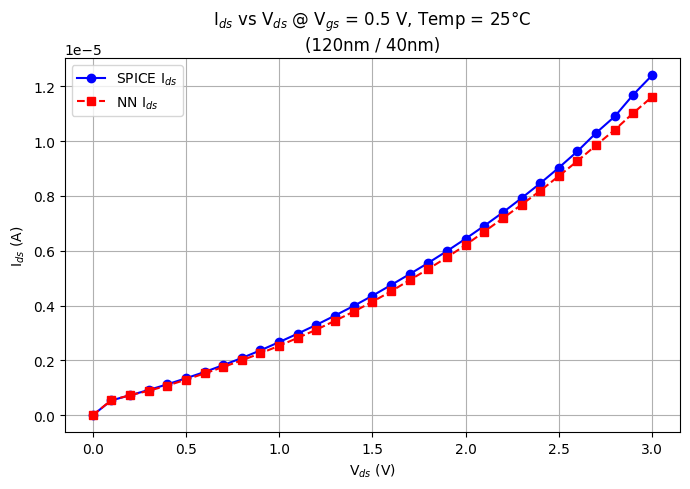

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


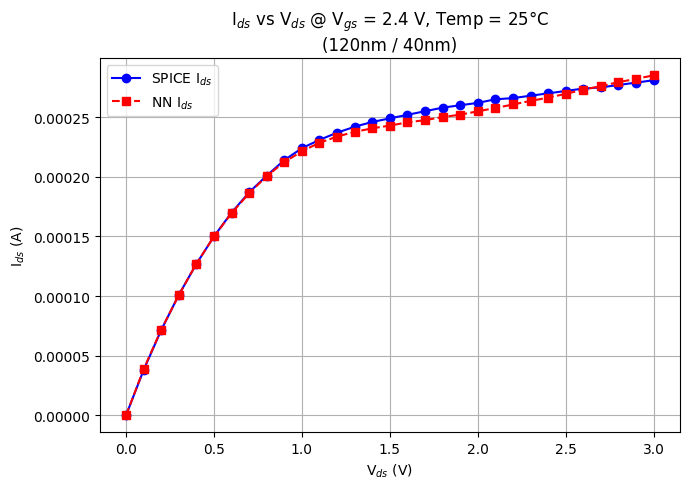

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


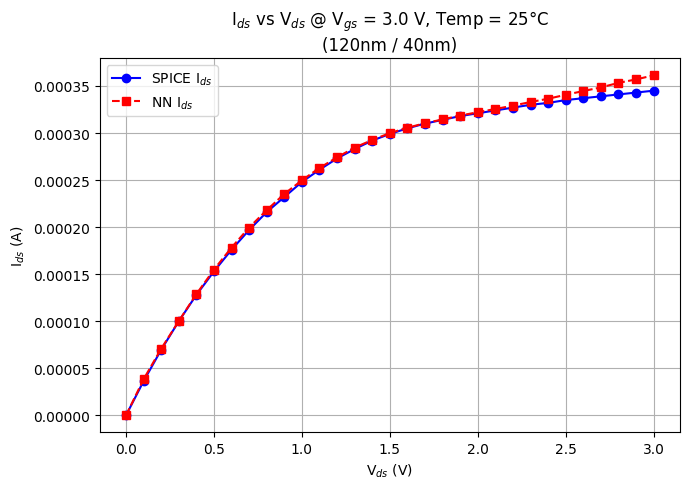

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load SPICE data for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[0]  # PCA vector for Device 1

TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Build inputs for NN (6D) and GPR (3D)
    X_nn_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_nn_scaled = scaler.transform(X_nn_input)
    X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_nn = model.predict(X_nn_scaled)
    log_Id_nn = y_nn[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_gpr_input)
    log_Id_hybrid = log_Id_nn + residual_pred

    # Final current predictions
    Id_hybrid = 10 ** log_Id_hybrid

    # Ground truth
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plotting
    plt.figure(figsize=(7, 5))
    plt.plot(Vds_vals, Id_spice, "bo-", label="SPICE I$_{ds}$")         # blue circles + line
    plt.plot(Vds_vals, Id_hybrid, "rs--", label="NN I$_{ds}$")  # red squares + dashed line

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n(120nm / 40nm)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


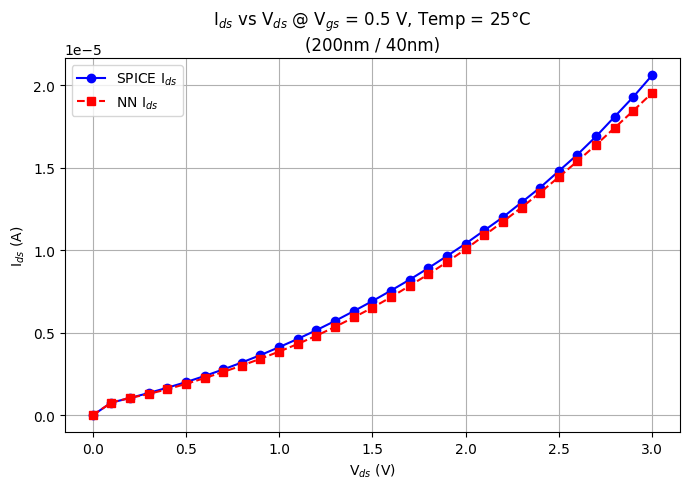

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


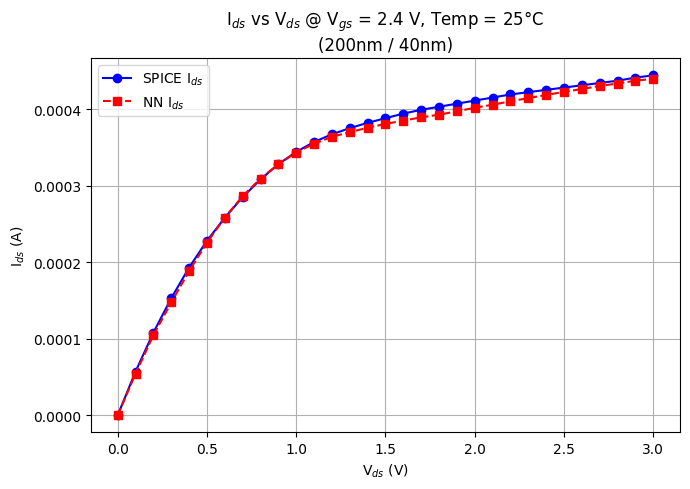

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


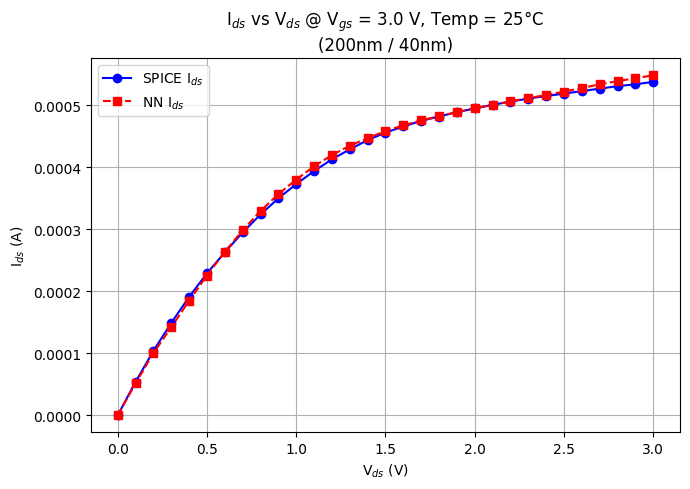

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load SPICE data for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[1]  # PCA vector for Device 1

TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Build inputs for NN (6D) and GPR (3D)
    X_nn_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_nn_scaled = scaler.transform(X_nn_input)
    X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_nn = model.predict(X_nn_scaled)
    log_Id_nn = y_nn[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_gpr_input)
    log_Id_hybrid = log_Id_nn + residual_pred

    # Final current predictions
    Id_hybrid = 10 ** log_Id_hybrid

    # Ground truth
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plotting
    plt.figure(figsize=(7, 5))
    plt.plot(Vds_vals, Id_spice, "bo-", label="SPICE I$_{ds}$")         # blue circles + line
    plt.plot(Vds_vals, Id_hybrid, "rs--", label="NN I$_{ds}$")  # red squares + dashed line

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n(200nm / 40nm)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


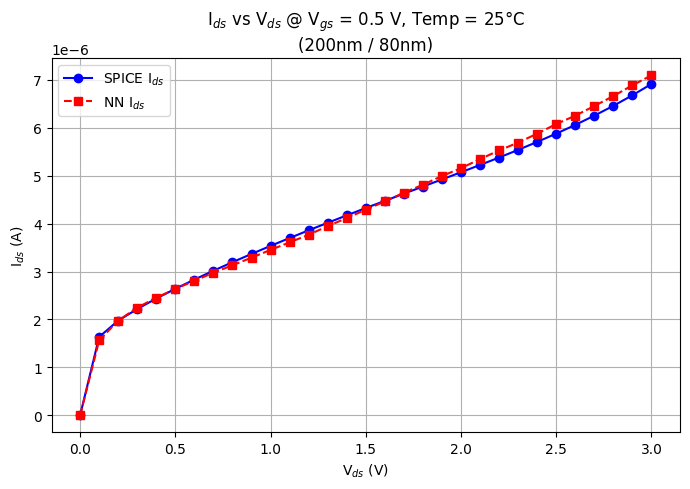

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


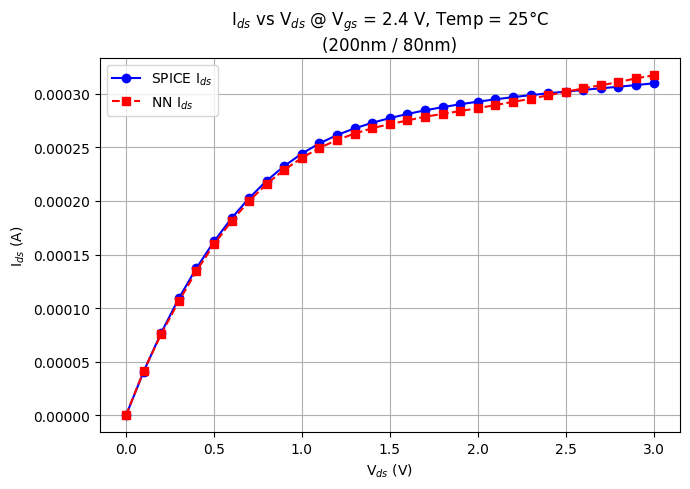

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


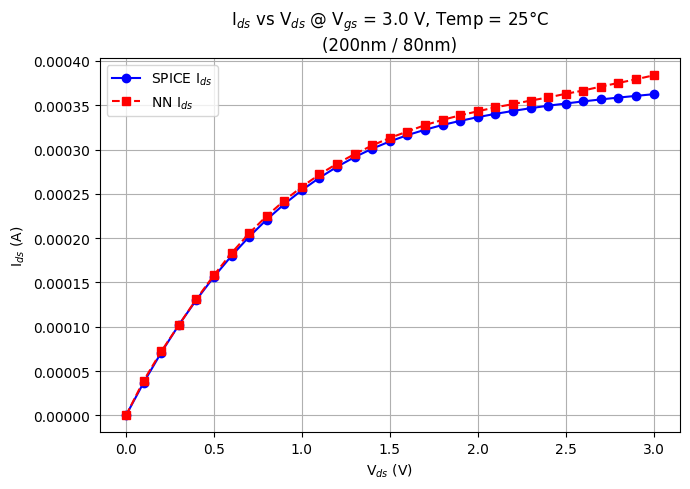

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load SPICE data for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[2]  # PCA vector for Device 1

TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Build inputs for NN (6D) and GPR (3D)
    X_nn_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_nn_scaled = scaler.transform(X_nn_input)
    X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_nn = model.predict(X_nn_scaled)
    log_Id_nn = y_nn[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_gpr_input)
    log_Id_hybrid = log_Id_nn + residual_pred

    # Final current predictions
    Id_hybrid = 10 ** log_Id_hybrid

    # Ground truth
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plotting
    plt.figure(figsize=(7, 5))
    plt.plot(Vds_vals, Id_spice, "bo-", label="SPICE I$_{ds}$")         # blue circles + line
    plt.plot(Vds_vals, Id_hybrid, "rs--", label="NN I$_{ds}$")  # red squares + dashed line

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n(200nm / 80nm)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


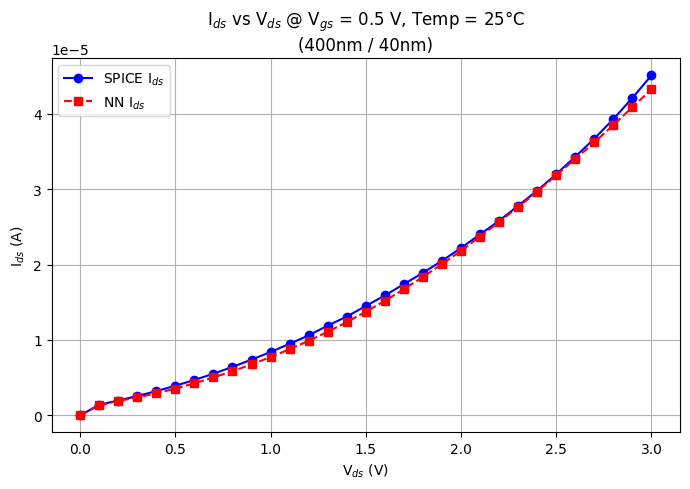

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


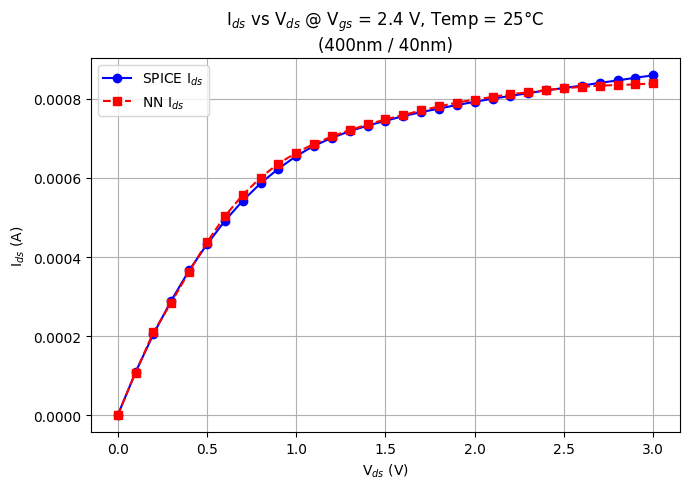

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


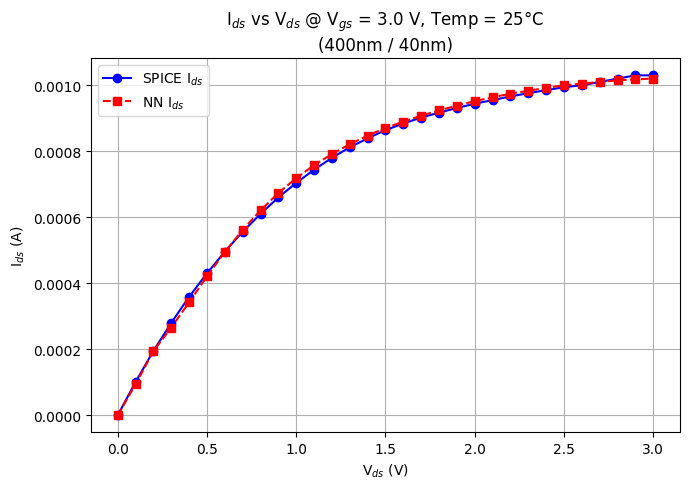

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load SPICE data for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[3]  # PCA vector for Device 1

TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Build inputs for NN (6D) and GPR (3D)
    X_nn_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_nn_scaled = scaler.transform(X_nn_input)
    X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_nn = model.predict(X_nn_scaled)
    log_Id_nn = y_nn[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_gpr_input)
    log_Id_hybrid = log_Id_nn + residual_pred

    # Final current predictions
    Id_hybrid = 10 ** log_Id_hybrid

    # Ground truth
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plotting
    plt.figure(figsize=(7, 5))
    plt.plot(Vds_vals, Id_spice, "bo-", label="SPICE I$_{ds}$")         # blue circles + line
    plt.plot(Vds_vals, Id_hybrid, "rs--", label="NN I$_{ds}$")  # red squares + dashed line

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n(400nm / 40nm)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


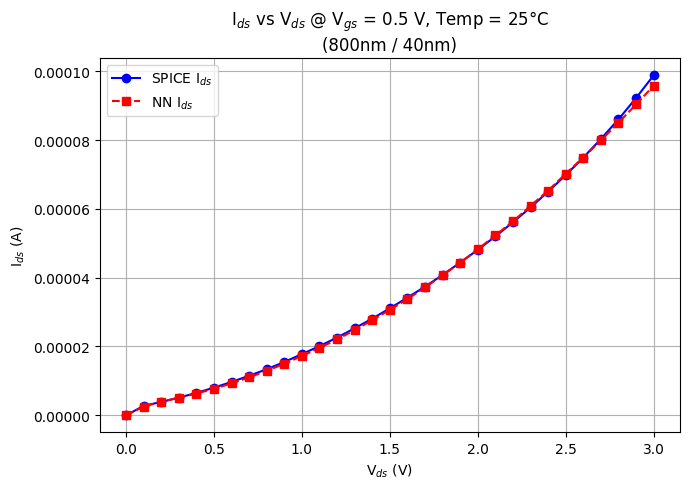

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


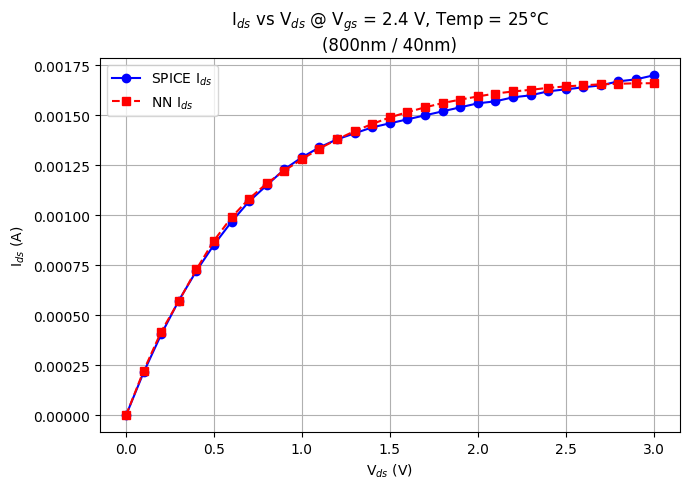

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


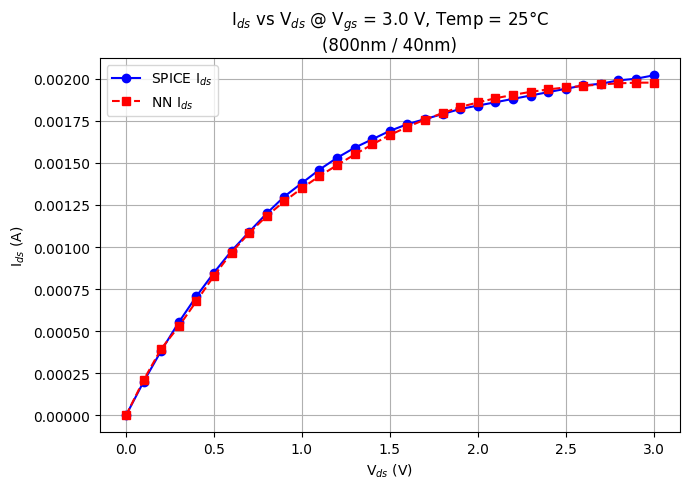

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load SPICE data for Device 1 (nfet_120_40)
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[4]  # PCA vector for Device 1

TEMP_TARGET = 25
VGS_TARGETS = [0.5, 2.4, 3.0]

for VGS_TARGET in VGS_TARGETS:
    # Filter SPICE data
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP_TARGET}°C")
        continue

    # Build inputs for NN (6D) and GPR (3D)
    X_nn_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_nn_scaled = scaler.transform(X_nn_input)
    X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_nn = model.predict(X_nn_scaled)
    log_Id_nn = y_nn[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_gpr_input)
    log_Id_hybrid = log_Id_nn + residual_pred

    # Final current predictions
    Id_hybrid = 10 ** log_Id_hybrid

    # Ground truth
    Id_spice = df_filtered["I_ds"].values
    Vds_vals = df_filtered["V_ds"].values

    # Plotting
    plt.figure(figsize=(7, 5))
    plt.plot(Vds_vals, Id_spice, "bo-", label="SPICE I$_{ds}$")         # blue circles + line
    plt.plot(Vds_vals, Id_hybrid, "rs--", label="NN I$_{ds}$")  # red squares + dashed line

    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C\n(800nm / 40nm)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 2  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


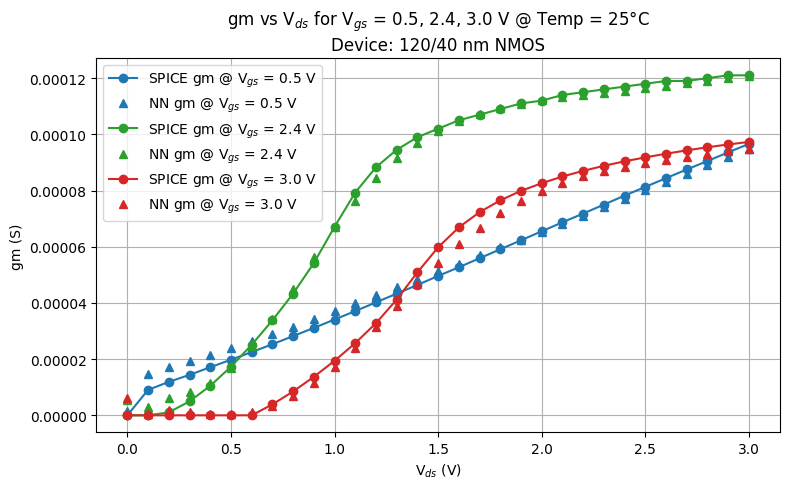

In [50]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 0  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


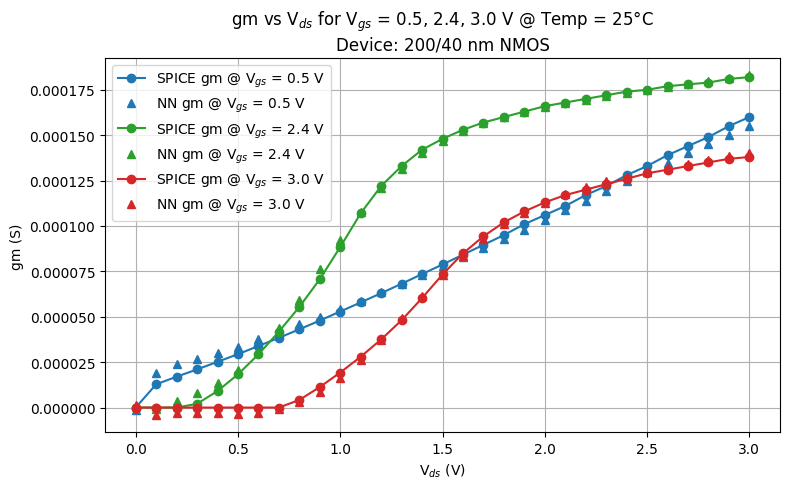

In [51]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 1  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 200/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


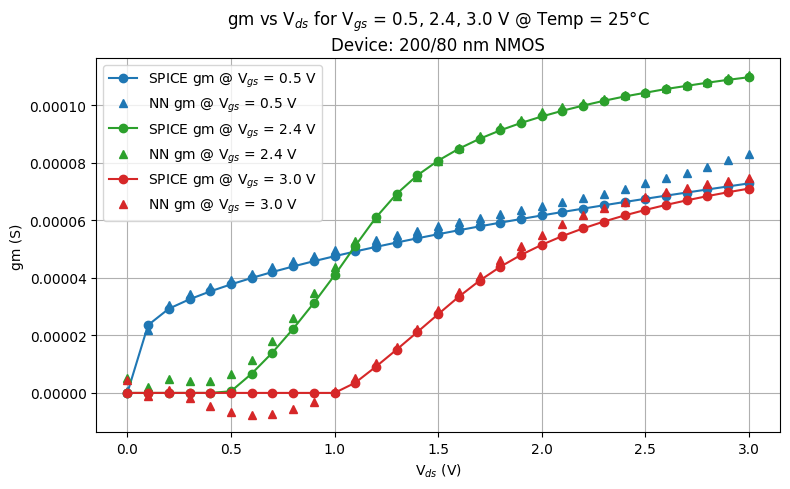

In [52]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 2  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 200/80 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


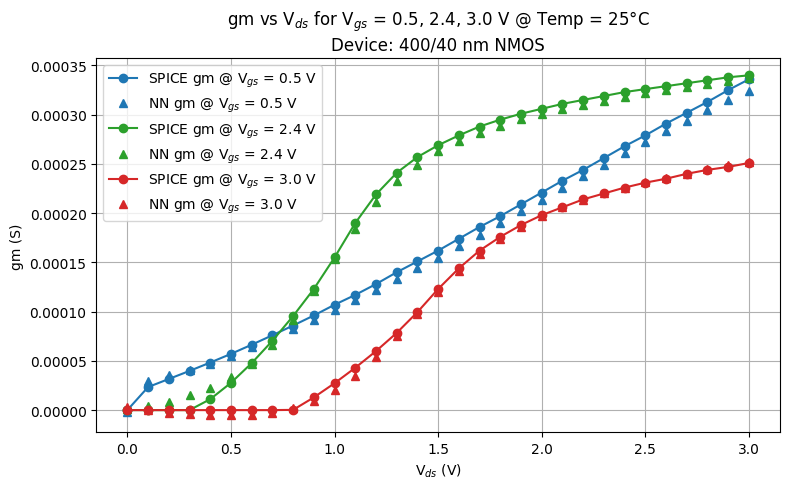

In [53]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 3  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 400/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


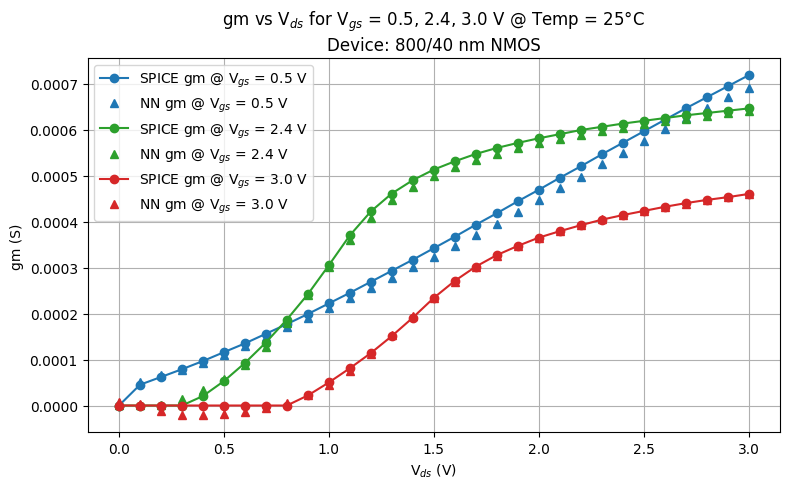

In [54]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 4  # nfet_800_40.CSV → 5th file → index 4
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {0.5: '#1f77b4', 2.4: '#2ca02c', 3.0: '#d62728'}

# Load device data
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # Model prediction
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)
    y_pred = model.predict(X_plot_scaled)
    gm_pred_scaled = y_pred[:, 1]
    gm_pred = scaler_gm.inverse_transform(gm_pred_scaled.reshape(-1, 1)).flatten()

    # SPICE gm
    gm_spice = df_filtered["gm"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot gm
    plt.plot(vds_vals, gm_spice, "o-", color=color, label=f"SPICE gm @ V$_{{gs}}$ = {VGS_TARGET} V")
    plt.plot(vds_vals, gm_pred, "^", color=color, linestyle='None', label=f"NN gm @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("gm (S)")
plt.title("gm vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 800/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


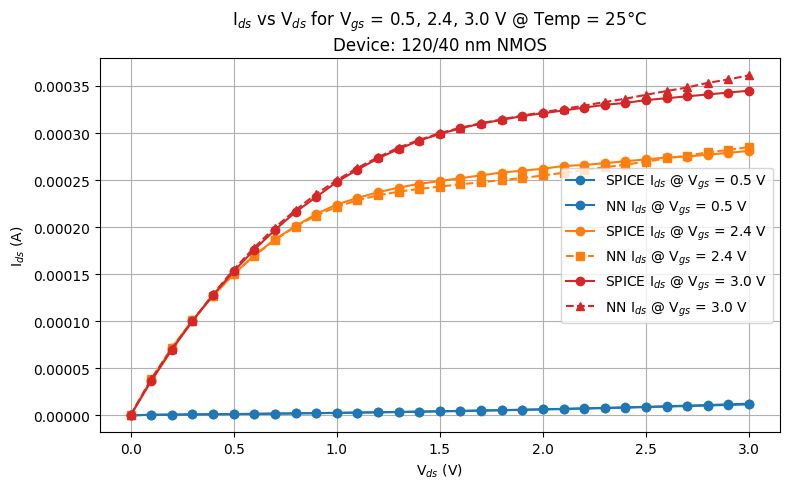

In [72]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 0  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # GPR input (3D): Vgs, Vds, Temp
    X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values

    # Predict with NN
    y_pred = model.predict(X_plot_scaled)
    log_Id_nn = y_pred[:, 0]

    # Predict residual with GPR
    residual_pred = gpr.predict(X_plot_gpr)
    log_Id_hybrid = log_Id_nn + residual_pred
    Id_hybrid = 10 ** log_Id_hybrid

    # Ground truth from SPICE
    Id_spice = df_filtered["I_ds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, Id_spice, "o-", color=color, label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot Hybrid
    plt.plot(vds_vals, Id_hybrid, marker_style, color=color, label=f"NN I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("I$_{ds}$ (A)")
plt.title("I$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


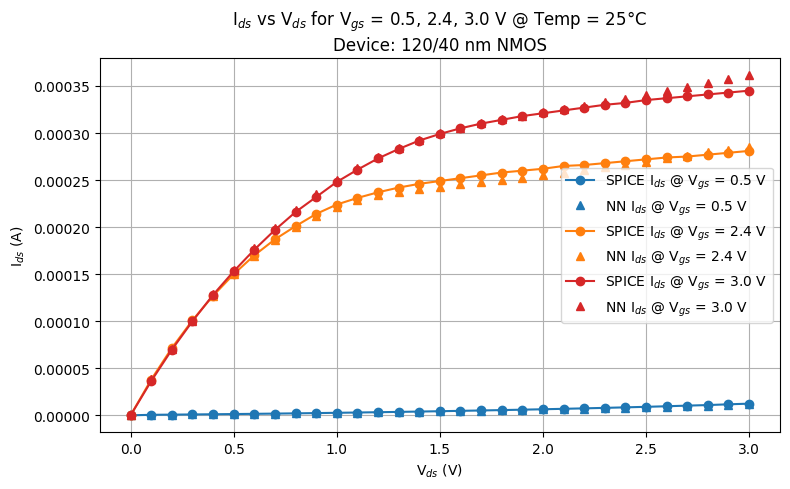

In [73]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 0  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # GPR input (3D): Vgs, Vds, Temp
    X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    log_Id_nn = y_pred[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_plot_gpr)
    log_Id_hybrid = log_Id_nn + residual_pred
    Id_hybrid = 10 ** log_Id_hybrid

    # SPICE ground truth
    Id_spice = df_filtered["I_ds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, Id_spice, "o-", color=color, label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot Hybrid NN+GPR
    plt.plot(vds_vals, Id_hybrid, "^", color=color, label=f"NN I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("I$_{ds}$ (A)")
plt.title("I$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


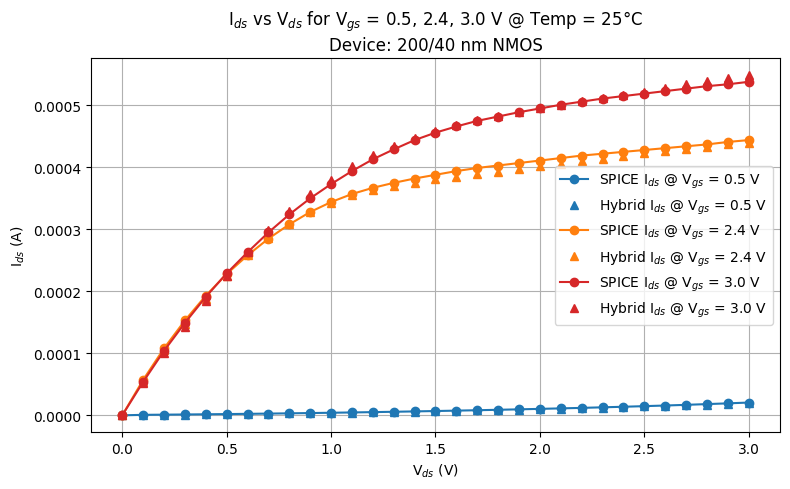

In [67]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 1  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # GPR input (3D): Vgs, Vds, Temp
    X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    log_Id_nn = y_pred[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_plot_gpr)
    log_Id_hybrid = log_Id_nn + residual_pred
    Id_hybrid = 10 ** log_Id_hybrid

    # SPICE ground truth
    Id_spice = df_filtered["I_ds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, Id_spice, "o-", color=color, label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot Hybrid NN+GPR
    plt.plot(vds_vals, Id_hybrid, "^", color=color, label=f"NN I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("I$_{ds}$ (A)")
plt.title("I$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 200/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


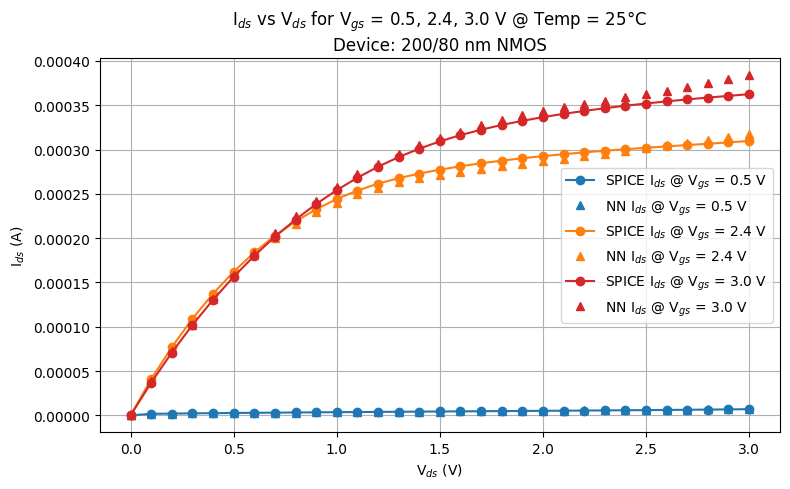

In [69]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 2  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # GPR input (3D): Vgs, Vds, Temp
    X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    log_Id_nn = y_pred[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_plot_gpr)
    log_Id_hybrid = log_Id_nn + residual_pred
    Id_hybrid = 10 ** log_Id_hybrid

    # SPICE ground truth
    Id_spice = df_filtered["I_ds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, Id_spice, "o-", color=color, label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot Hybrid NN+GPR
    plt.plot(vds_vals, Id_hybrid, "^", color=color, label=f"NN I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("I$_{ds}$ (A)")
plt.title("I$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 200/80 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


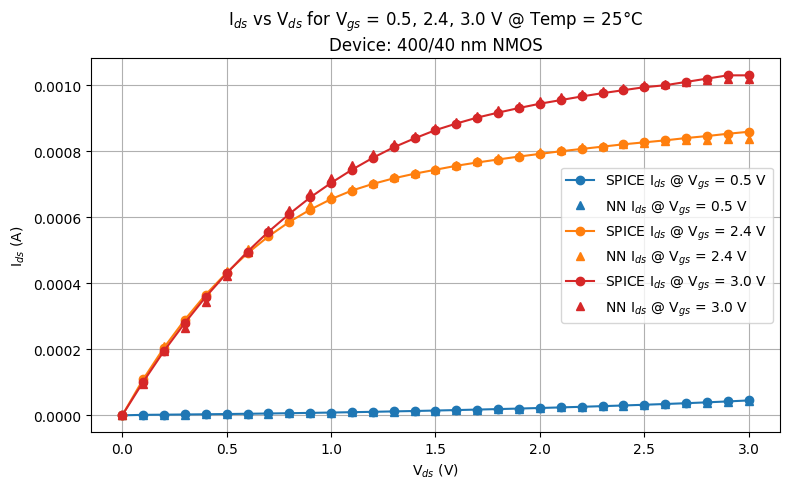

In [70]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 3  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # GPR input (3D): Vgs, Vds, Temp
    X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    log_Id_nn = y_pred[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_plot_gpr)
    log_Id_hybrid = log_Id_nn + residual_pred
    Id_hybrid = 10 ** log_Id_hybrid

    # SPICE ground truth
    Id_spice = df_filtered["I_ds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, Id_spice, "o-", color=color, label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot Hybrid NN+GPR
    plt.plot(vds_vals, Id_hybrid, "^", color=color, label=f"NN I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("I$_{ds}$ (A)")
plt.title("I$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 400/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


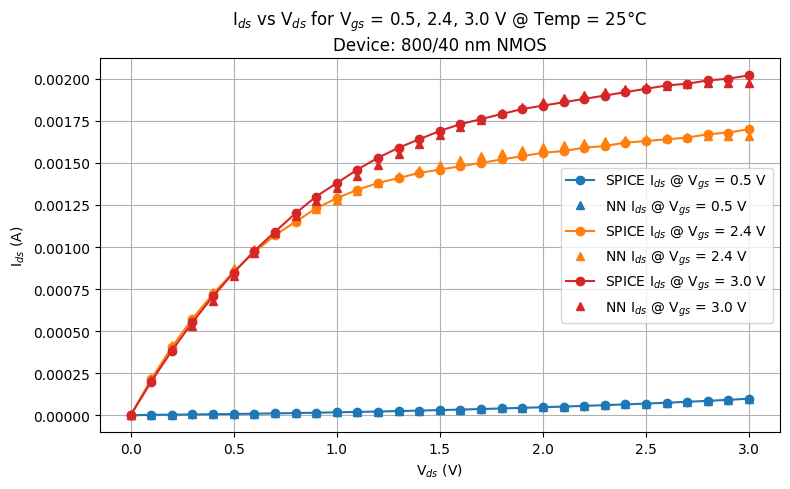

In [71]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 4  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # GPR input (3D): Vgs, Vds, Temp
    X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    log_Id_nn = y_pred[:, 0]

    # GPR residual correction
    residual_pred = gpr.predict(X_plot_gpr)
    log_Id_hybrid = log_Id_nn + residual_pred
    Id_hybrid = 10 ** log_Id_hybrid

    # SPICE ground truth
    Id_spice = df_filtered["I_ds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, Id_spice, "o-", color=color, label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot Hybrid NN+GPR
    plt.plot(vds_vals, Id_hybrid, "^", color=color, label=f"NN I$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("I$_{ds}$ (A)")
plt.title("I$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 800/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


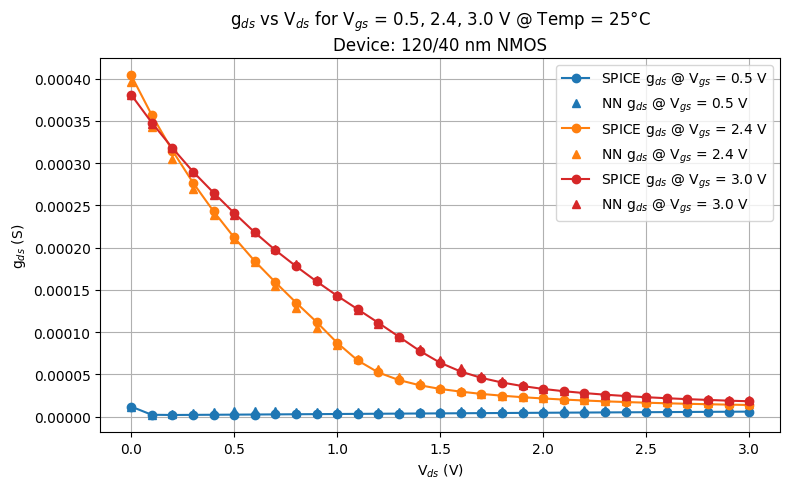

In [61]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 0  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred_nn = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # No GPR used for gd, but if needed:
    # X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values
    # Optionally apply a separate GPR for gds residuals here

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot NN-predicted gd
    plt.plot(vds_vals, gd_pred_nn, "^", color=color, label=f"NN g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("g$_{ds}$ (S)")
plt.title("g$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 120/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


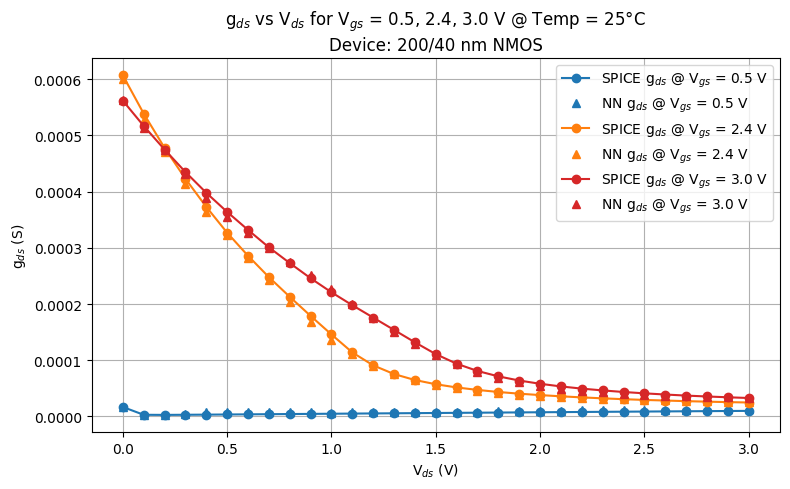

In [62]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 1  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred_nn = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # No GPR used for gd, but if needed:
    # X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values
    # Optionally apply a separate GPR for gds residuals here

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot NN-predicted gd
    plt.plot(vds_vals, gd_pred_nn, "^", color=color, label=f"NN g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("g$_{ds}$ (S)")
plt.title("g$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 200/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


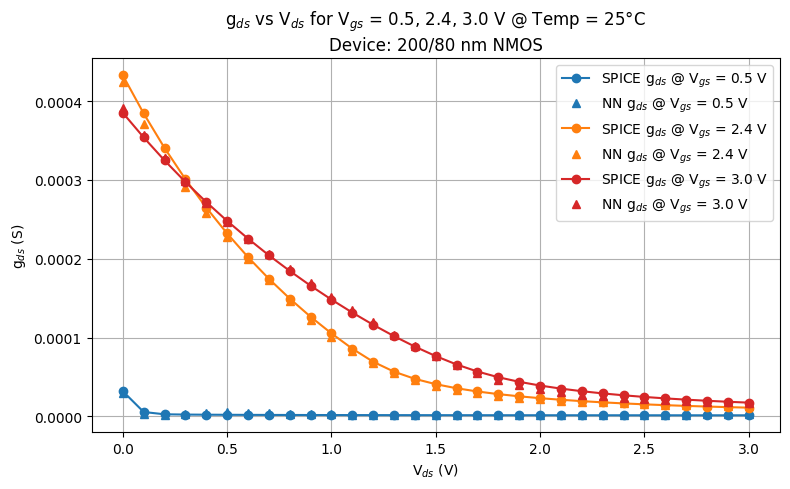

In [63]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 2  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred_nn = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # No GPR used for gd, but if needed:
    # X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values
    # Optionally apply a separate GPR for gds residuals here

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot NN-predicted gd
    plt.plot(vds_vals, gd_pred_nn, "^", color=color, label=f"NN g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("g$_{ds}$ (S)")
plt.title("g$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 200/80 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


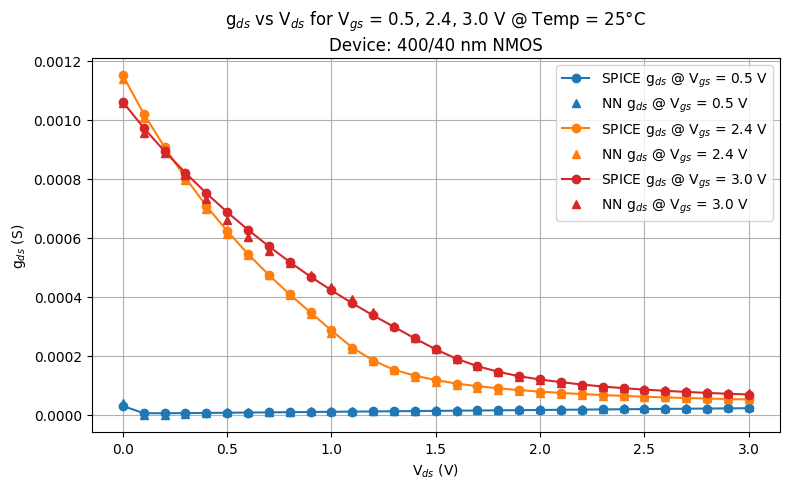

In [64]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 3  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred_nn = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # No GPR used for gd, but if needed:
    # X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values
    # Optionally apply a separate GPR for gds residuals here

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot NN-predicted gd
    plt.plot(vds_vals, gd_pred_nn, "^", color=color, label=f"NN g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("g$_{ds}$ (S)")
plt.title("g$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 400/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


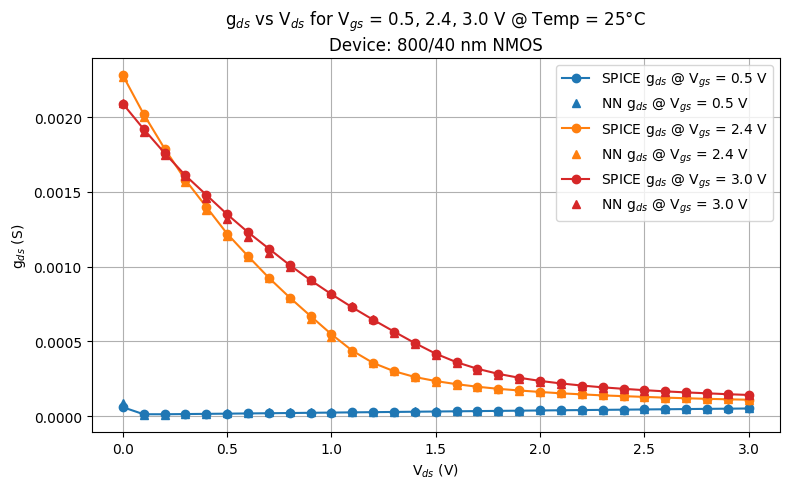

In [65]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Device and constants
TEMP_TARGET = 25
DEVICE_INDEX = 4  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-"),   # blue
    2.4: ("#ff7f0e", "s--"),  # orange
    3.0: ("#d62728", "^--")   # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# Initialize plot
plt.figure(figsize=(8, 5))

for VGS_TARGET in VGS_TARGETS:
    color, marker_style = COLOR_MAP[VGS_TARGET]
    mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP_TARGET)
    df_filtered = df_spice[mask].sort_values(by="V_ds")

    if df_filtered.empty:
        print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP_TARGET}°C")
        continue

    # NN input (6D): PCA + Vgs, Vds, Temp
    X_plot = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
    X_plot_scaled = scaler.transform(X_plot)

    # NN prediction
    y_pred = model.predict(X_plot_scaled)
    gd_pred_scaled = y_pred[:, 2]
    gd_pred_nn = scaler_gd.inverse_transform(gd_pred_scaled.reshape(-1, 1)).flatten()

    # No GPR used for gd, but if needed:
    # X_plot_gpr = df_filtered[["V_gs", "V_ds", "temp"]].values
    # Optionally apply a separate GPR for gds residuals here

    # SPICE gd
    gd_spice = df_filtered["gds"].values
    vds_vals = df_filtered["V_ds"].values

    # Plot SPICE
    plt.plot(vds_vals, gd_spice, "o-", color=color, label=f"SPICE g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Plot NN-predicted gd
    plt.plot(vds_vals, gd_pred_nn, "^", color=color, label=f"NN g$_{{ds}}$ @ V$_{{gs}}$ = {VGS_TARGET} V")

# Final plot styling
plt.xlabel("V$_{ds}$ (V)")
plt.ylabel("g$_{ds}$ (S)")
plt.title("g$_{ds}$ vs V$_{ds}$ for V$_{gs}$ = 0.5, 2.4, 3.0 V @ Temp = 25°C\nDevice: 800/40 nm NMOS")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


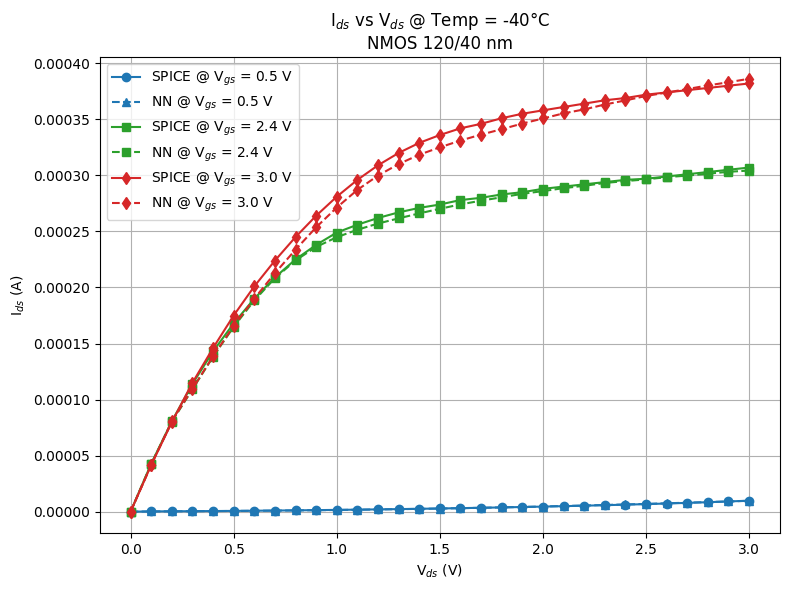

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


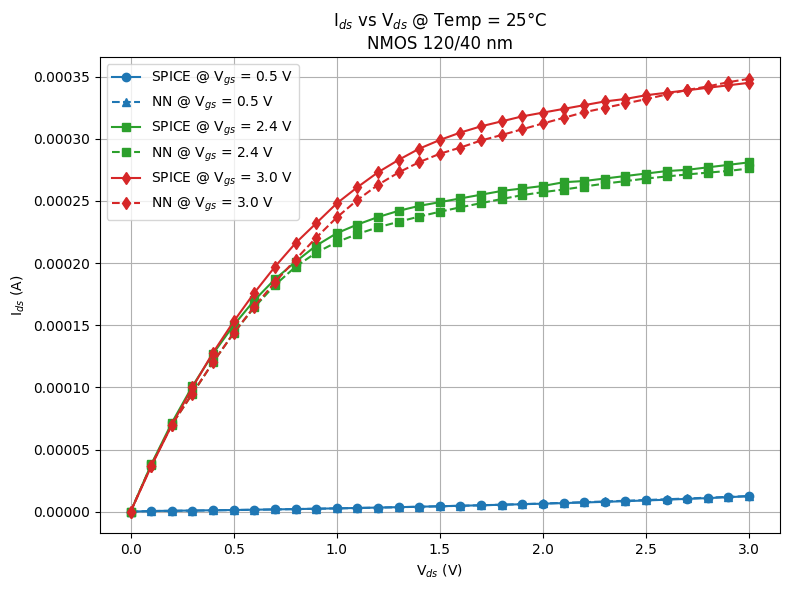

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


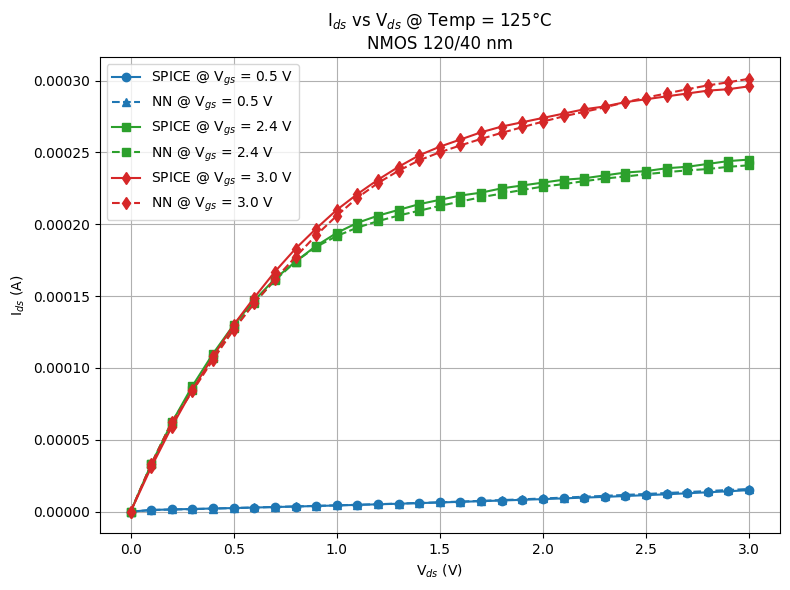

In [91]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 0  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-", "^--"),   # blue
    2.4: ("#2ca02c", "s-", "s--"),   # green
    3.0: ("#d62728", "d-", "d--")    # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color, spice_style, hybrid_style = COLOR_MAP[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # NN input (6D): PCA + Vgs, Vds, Temp
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)

        # GPR input (3D): Vgs, Vds, Temp
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled)
        log_Id_nn = y_pred[:, 0]

        # GPR residual correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_hybrid = 10 ** log_Id_hybrid

        # SPICE data
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE
        plt.plot(Vds_vals, Id_spice, spice_style, color=color, label=f"SPICE @ V$_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid NN+GPR
        plt.plot(Vds_vals, Id_hybrid, hybrid_style, color=color, label=f"NN @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Styling per temperature
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 120/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


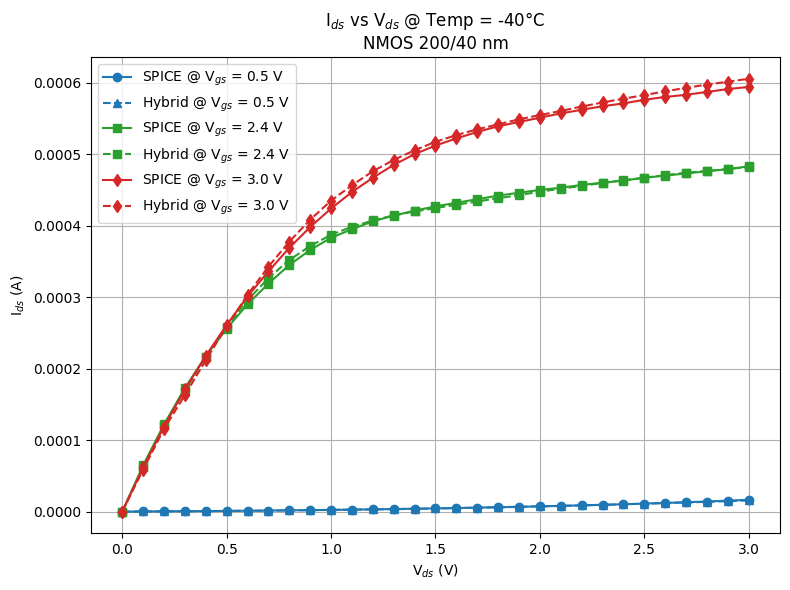

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


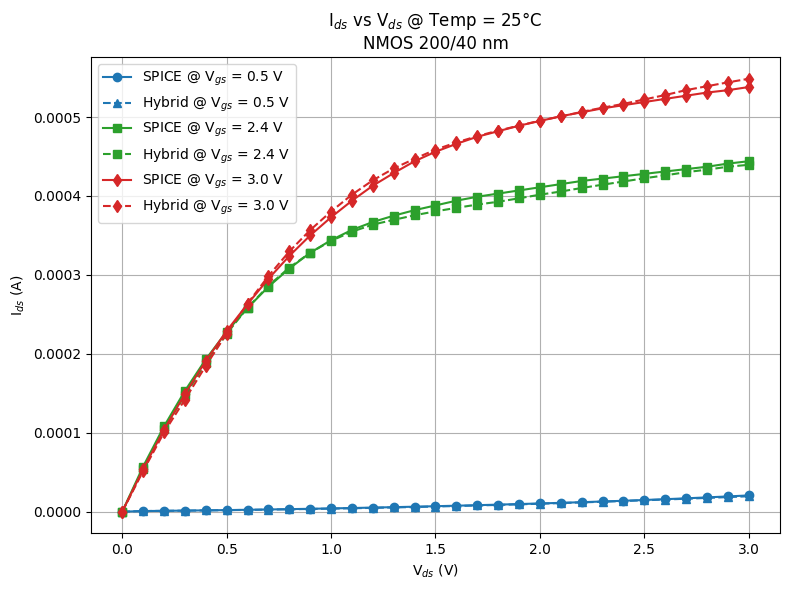

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


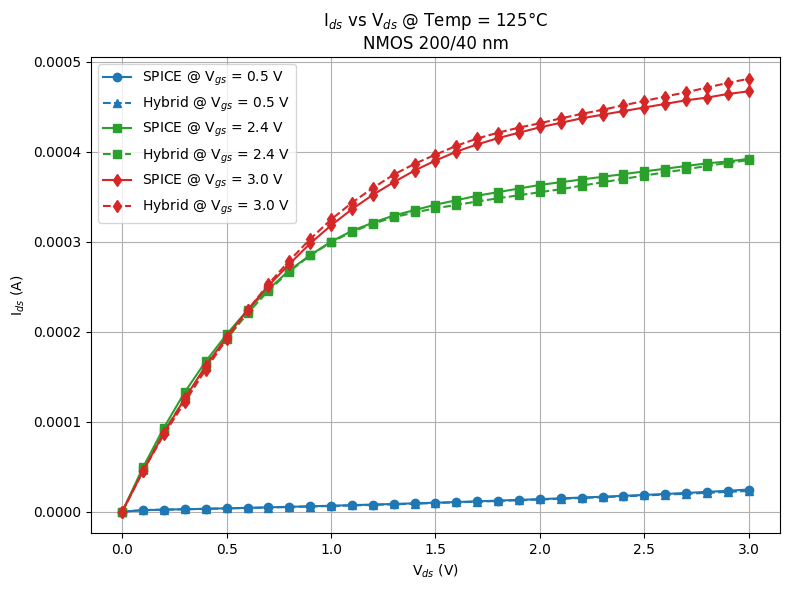

In [76]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 1  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-", "^--"),   # blue
    2.4: ("#2ca02c", "s-", "s--"),   # green
    3.0: ("#d62728", "d-", "d--")    # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color, spice_style, hybrid_style = COLOR_MAP[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # NN input (6D): PCA + Vgs, Vds, Temp
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)

        # GPR input (3D): Vgs, Vds, Temp
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled)
        log_Id_nn = y_pred[:, 0]

        # GPR residual correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_hybrid = 10 ** log_Id_hybrid

        # SPICE data
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE
        plt.plot(Vds_vals, Id_spice, spice_style, color=color, label=f"SPICE @ V$_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid NN+GPR
        plt.plot(Vds_vals, Id_hybrid, hybrid_style, color=color, label=f"Hybrid @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Styling per temperature
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 200/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


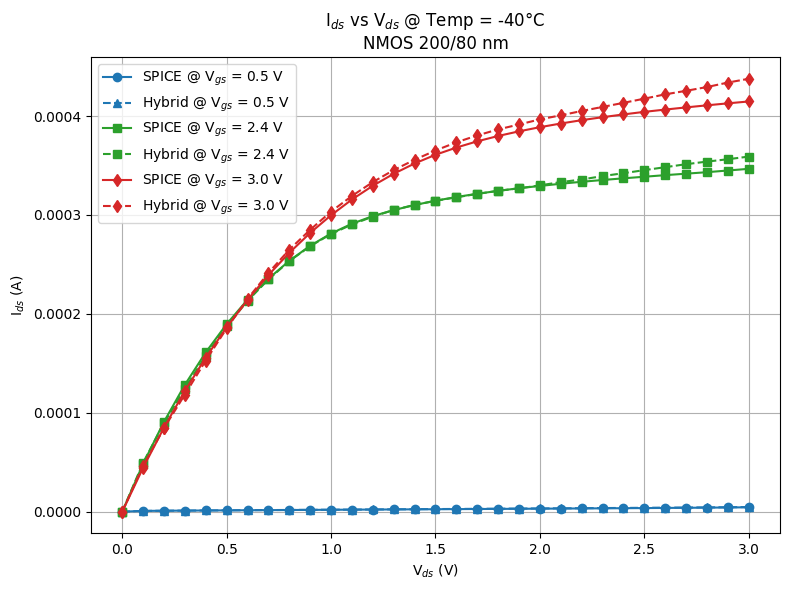

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


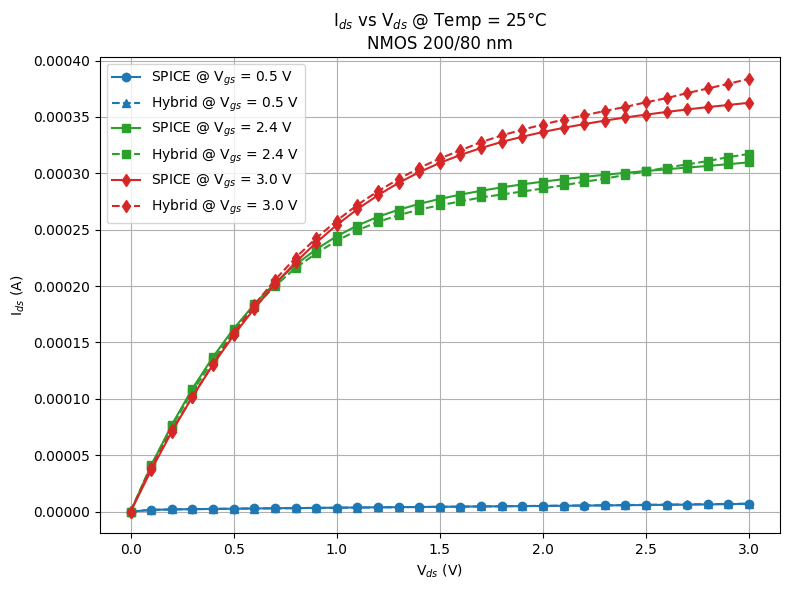

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


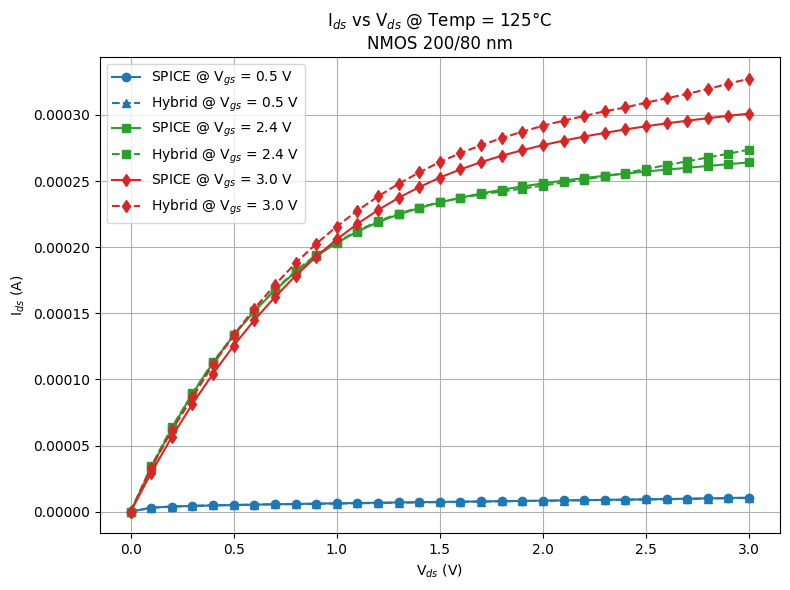

In [77]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 2  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-", "^--"),   # blue
    2.4: ("#2ca02c", "s-", "s--"),   # green
    3.0: ("#d62728", "d-", "d--")    # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color, spice_style, hybrid_style = COLOR_MAP[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # NN input (6D): PCA + Vgs, Vds, Temp
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)

        # GPR input (3D): Vgs, Vds, Temp
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled)
        log_Id_nn = y_pred[:, 0]

        # GPR residual correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_hybrid = 10 ** log_Id_hybrid

        # SPICE data
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE
        plt.plot(Vds_vals, Id_spice, spice_style, color=color, label=f"SPICE @ V$_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid NN+GPR
        plt.plot(Vds_vals, Id_hybrid, hybrid_style, color=color, label=f"Hybrid @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Styling per temperature
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 200/80 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


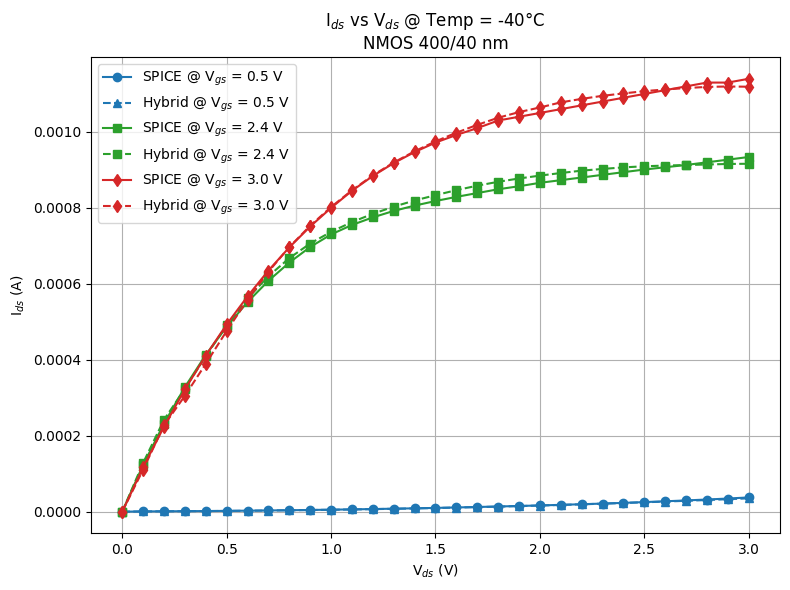

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


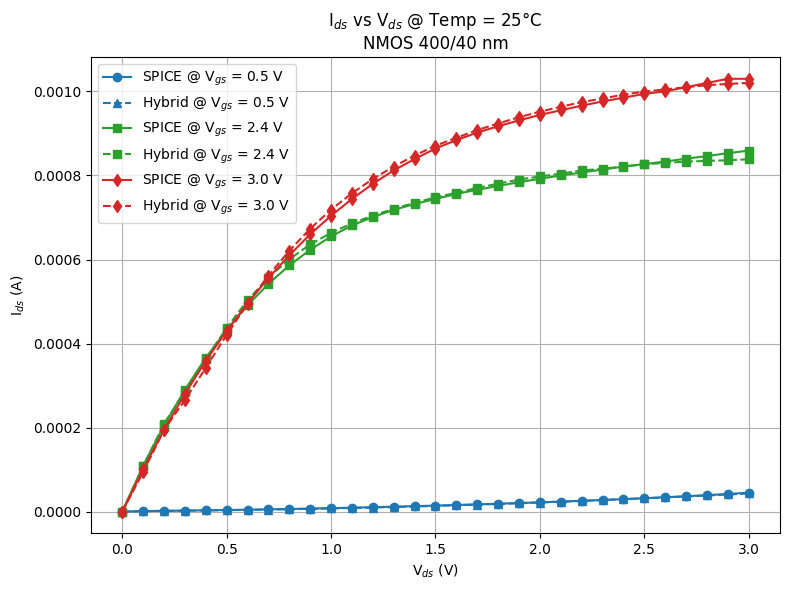

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


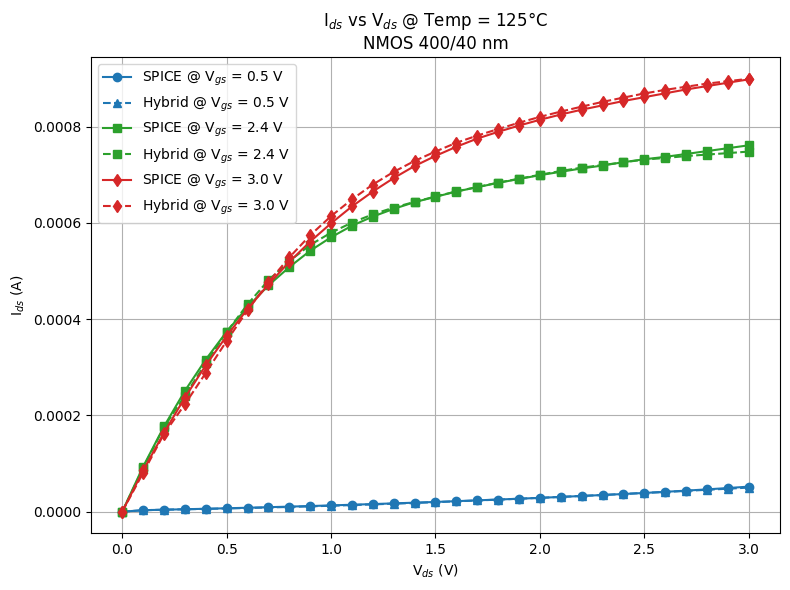

In [78]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 3  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-", "^--"),   # blue
    2.4: ("#2ca02c", "s-", "s--"),   # green
    3.0: ("#d62728", "d-", "d--")    # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color, spice_style, hybrid_style = COLOR_MAP[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # NN input (6D): PCA + Vgs, Vds, Temp
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)

        # GPR input (3D): Vgs, Vds, Temp
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled)
        log_Id_nn = y_pred[:, 0]

        # GPR residual correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_hybrid = 10 ** log_Id_hybrid

        # SPICE data
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE
        plt.plot(Vds_vals, Id_spice, spice_style, color=color, label=f"SPICE @ V$_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid NN+GPR
        plt.plot(Vds_vals, Id_hybrid, hybrid_style, color=color, label=f"Hybrid @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Styling per temperature
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 400/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


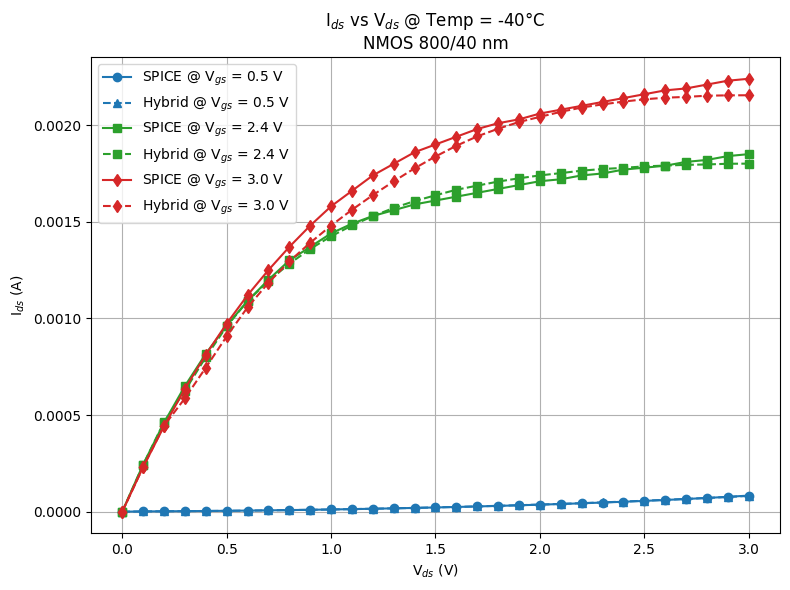

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


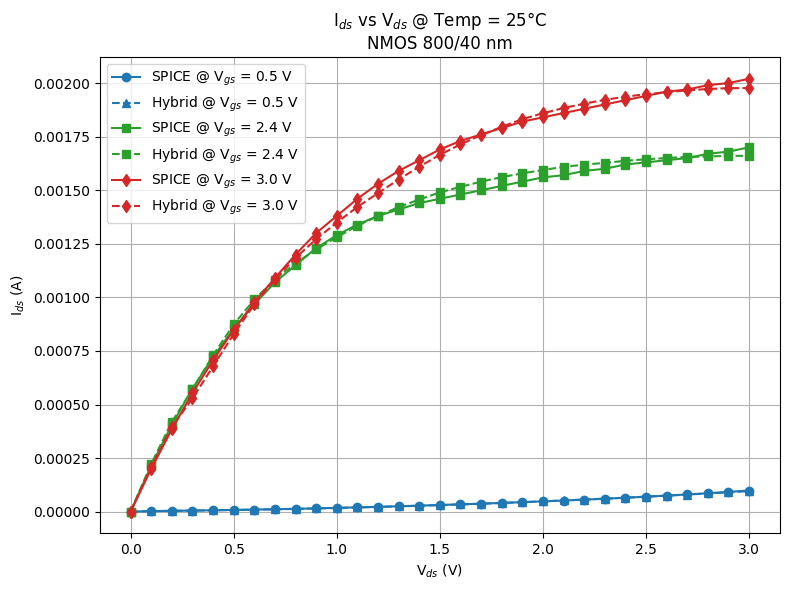

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


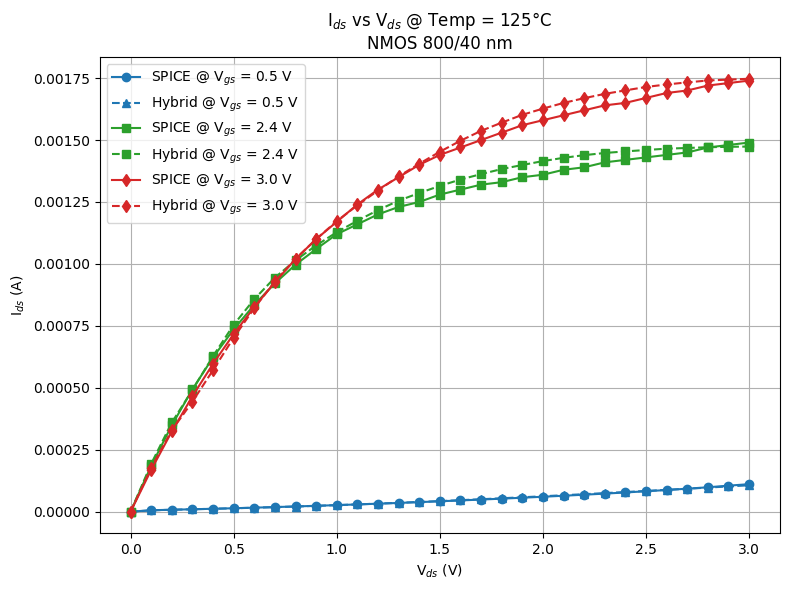

In [79]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 4  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]
COLOR_MAP = {
    0.5: ("#1f77b4", "o-", "^--"),   # blue
    2.4: ("#2ca02c", "s-", "s--"),   # green
    3.0: ("#d62728", "d-", "d--")    # red
}

# Load SPICE data
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        color, spice_style, hybrid_style = COLOR_MAP[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # NN input (6D): PCA + Vgs, Vds, Temp
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)

        # GPR input (3D): Vgs, Vds, Temp
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled)
        log_Id_nn = y_pred[:, 0]

        # GPR residual correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_hybrid = 10 ** log_Id_hybrid

        # SPICE data
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE
        plt.plot(Vds_vals, Id_spice, spice_style, color=color, label=f"SPICE @ V$_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid NN+GPR
        plt.plot(Vds_vals, Id_hybrid, hybrid_style, color=color, label=f"Hybrid @ V$_{{gs}}$ = {VGS_TARGET} V")

    # Styling per temperature
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 800/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


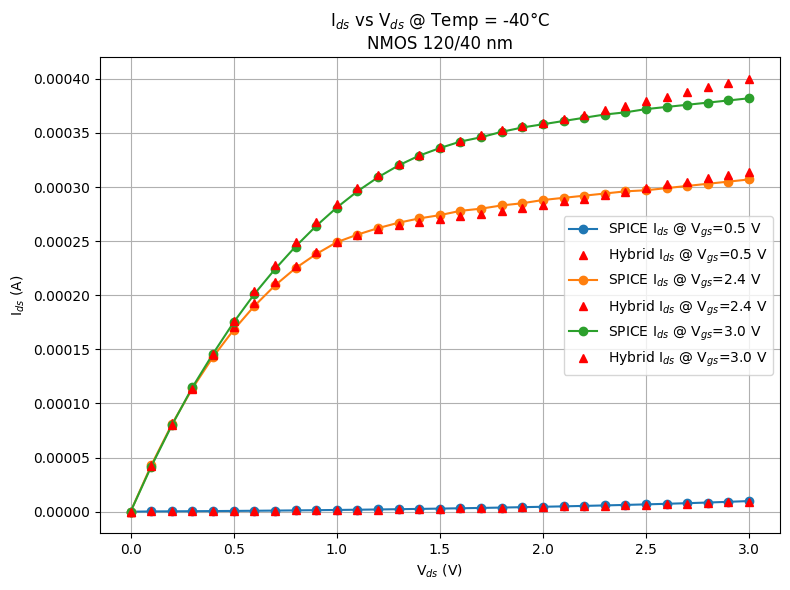

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


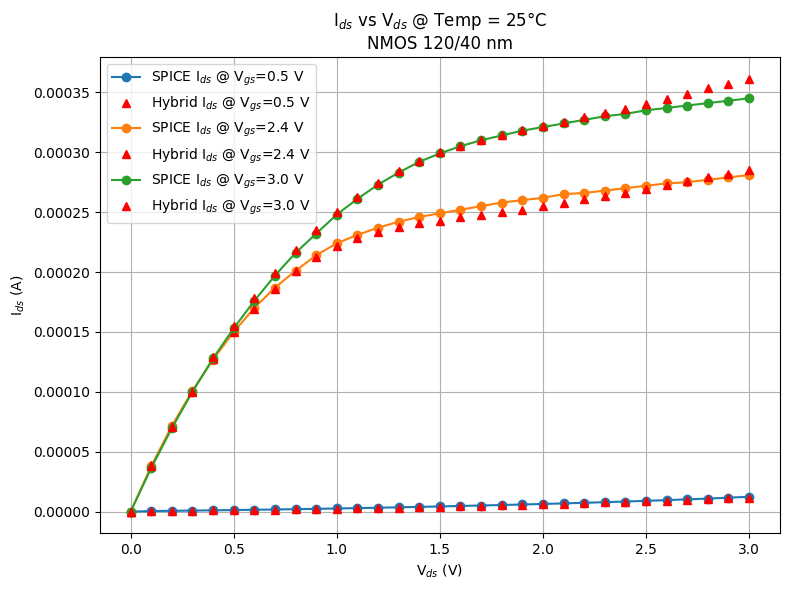

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


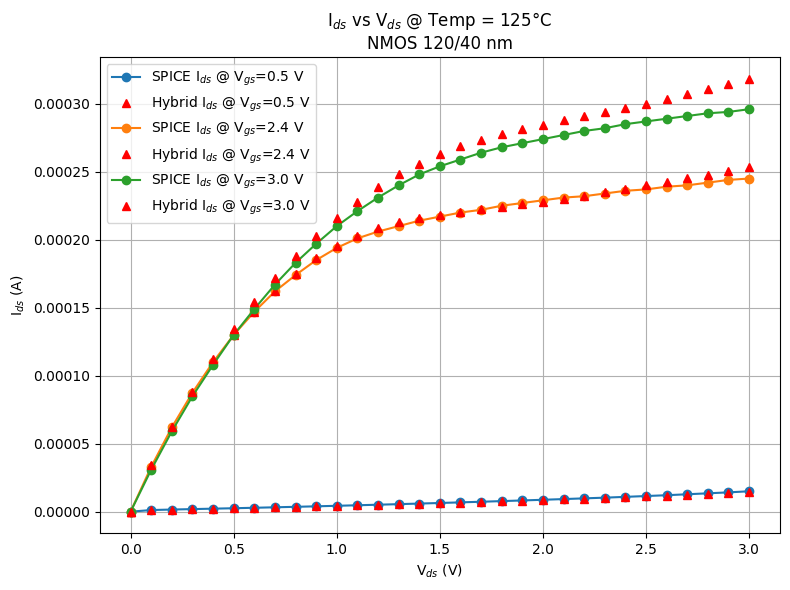

In [80]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 0  # nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Load SPICE data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One plot per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))
    for VGS_TARGET in VGS_TARGETS:
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No data for Vgs = {VGS_TARGET} V, Temp = {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE
        plt.plot(Vds_vals, Id_spice, "o-", label=f"SPICE I$_{{ds}}$ @ V$_{{gs}}$={VGS_TARGET} V")

        # Plot Hybrid NN+GPR
        plt.plot(Vds_vals, Id_pred, "^", color='red', label=f"Hybrid I$_{{ds}}$ @ V$_{{gs}}$={VGS_TARGET} V")

    # Final plot styling
    plt.xlabel("V$_{ds}$ (V)")
    plt.ylabel("I$_{ds}$ (A)")
    plt.title(f"I$_{{ds}}$ vs V$_{{ds}}$ @ Temp = {TEMP}°C\nNMOS 120/40 nm")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


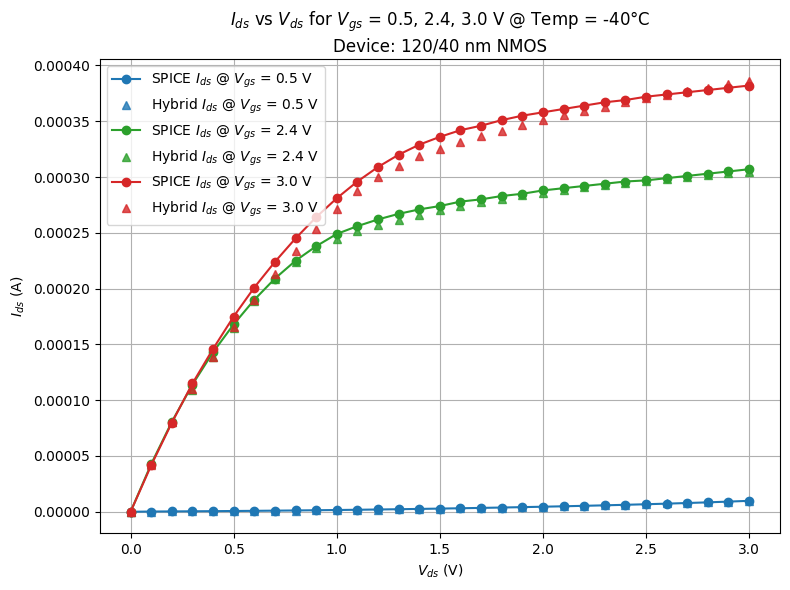

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


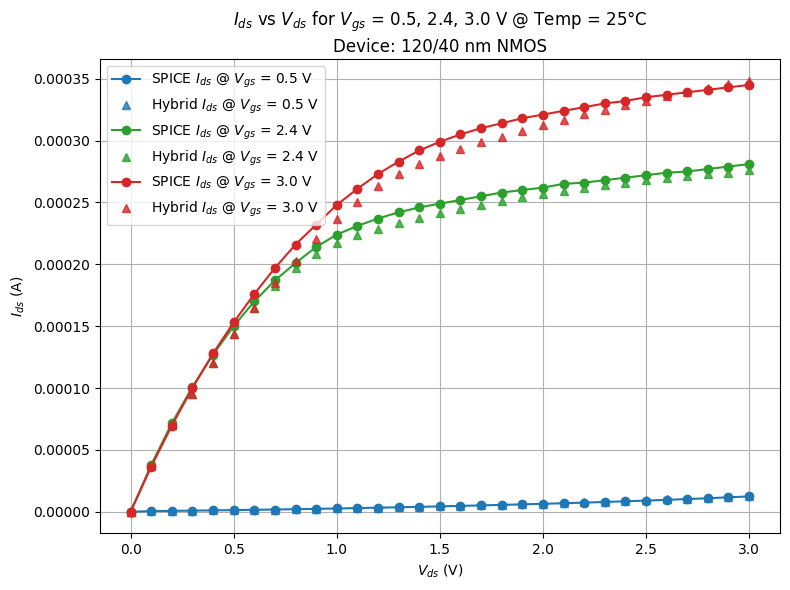

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


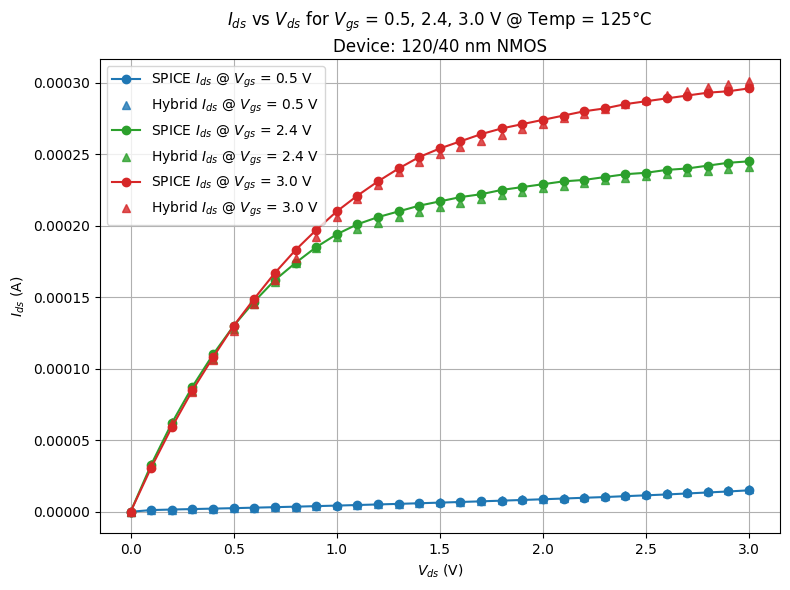

In [92]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 0  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_120_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 120/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


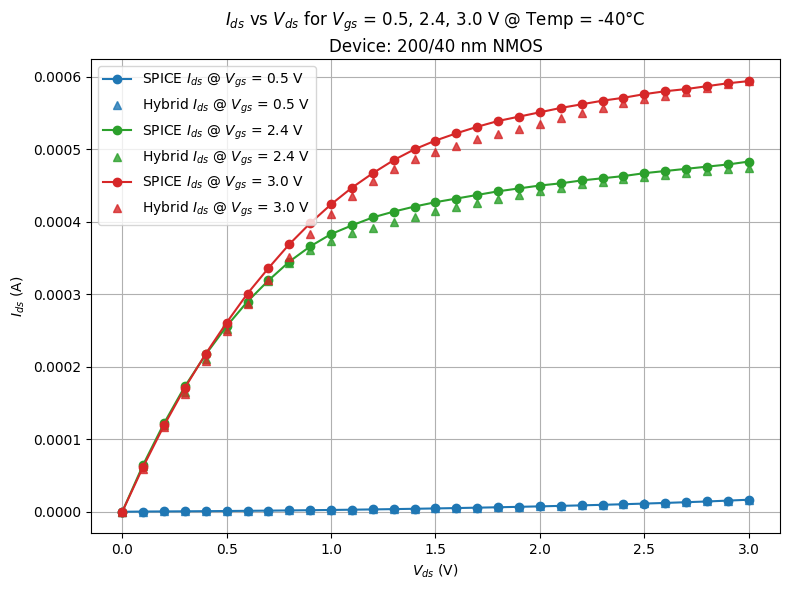

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


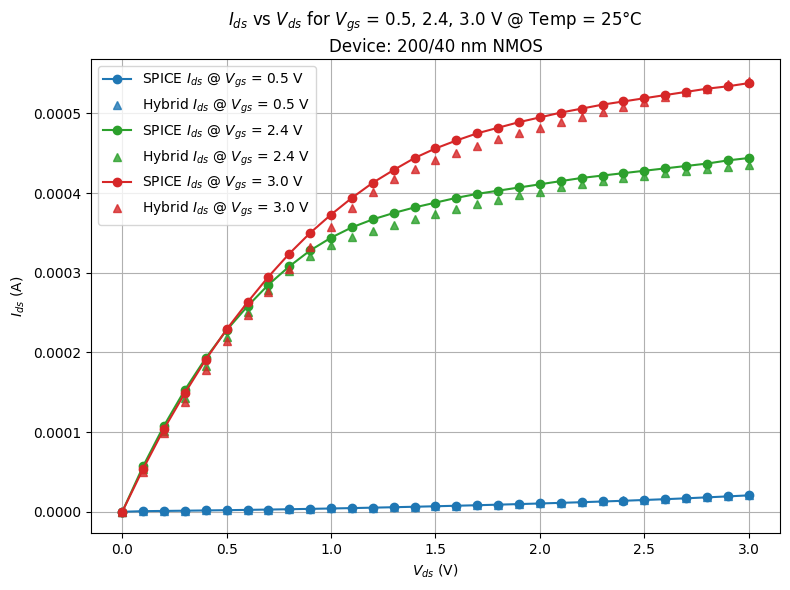

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


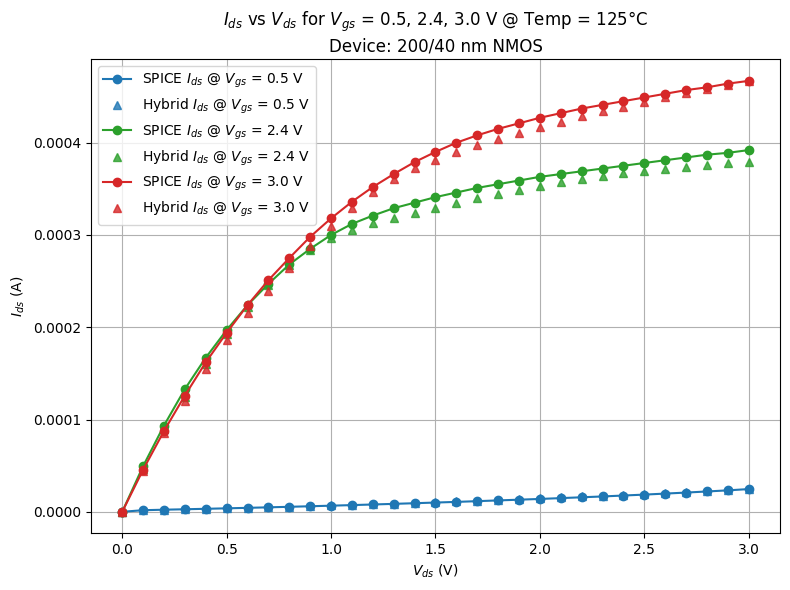

In [93]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 1  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 200/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


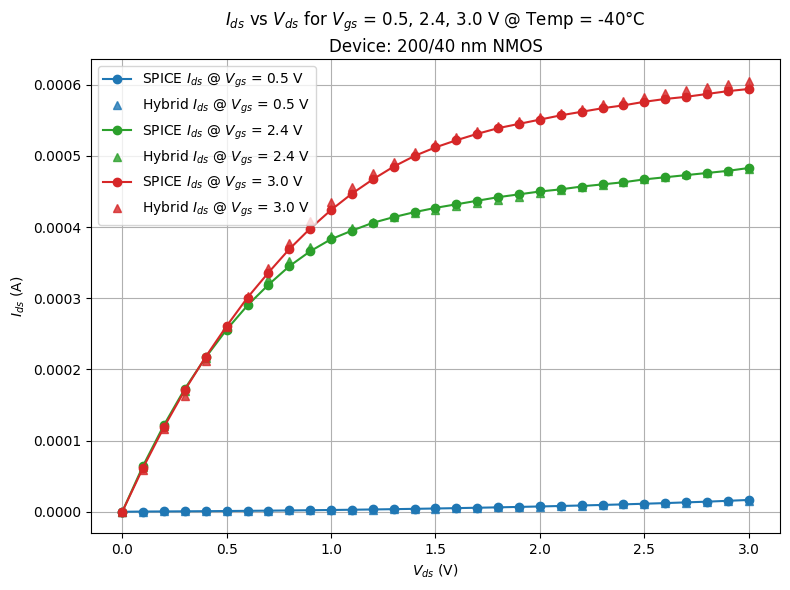

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


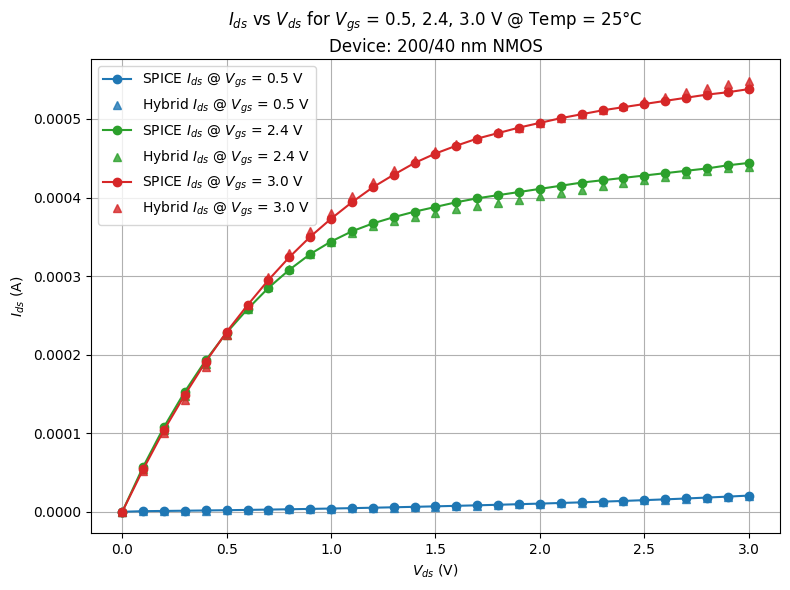

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


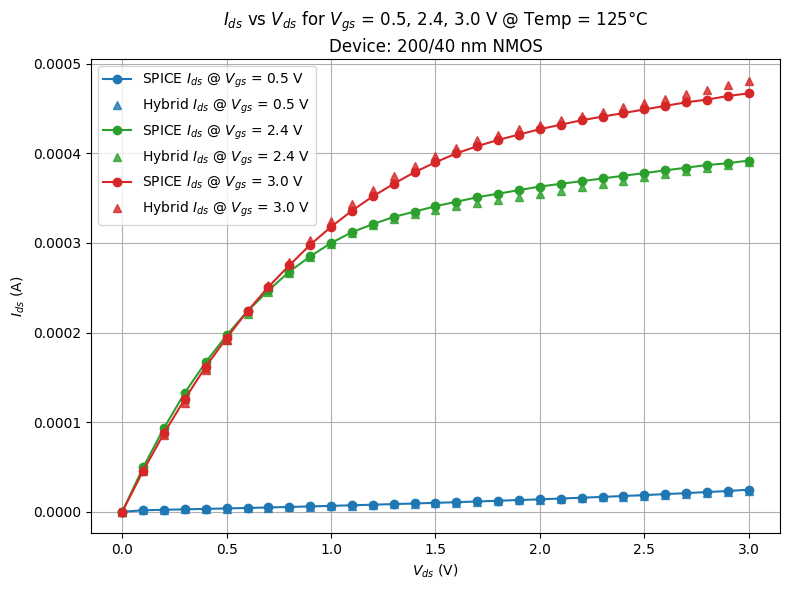

In [84]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 1  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_200_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 200/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


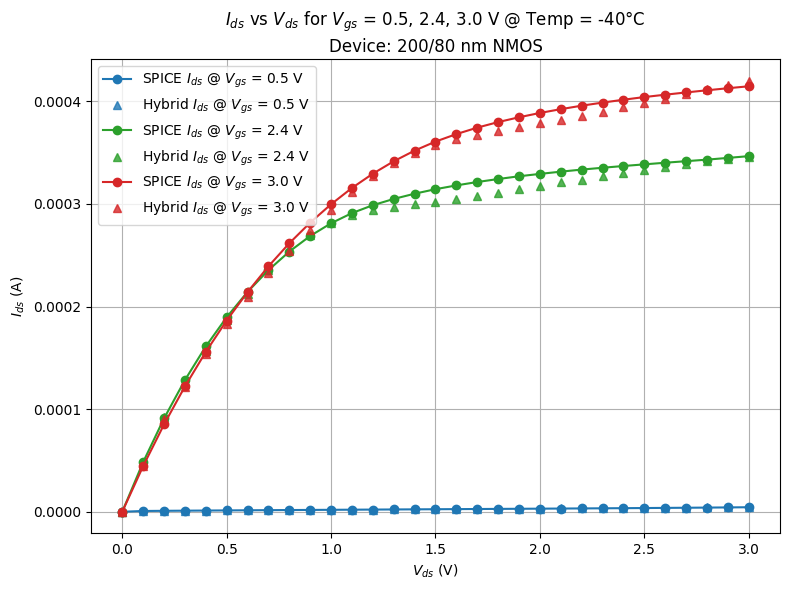

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


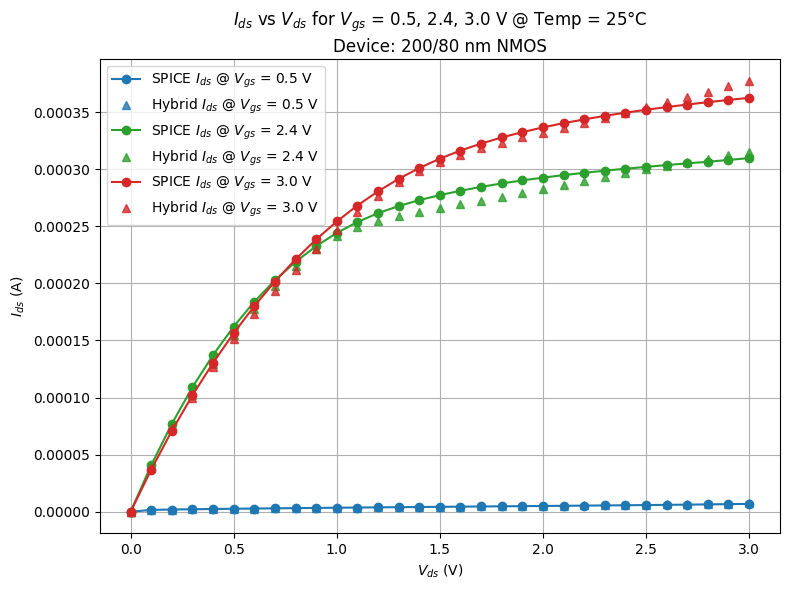

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


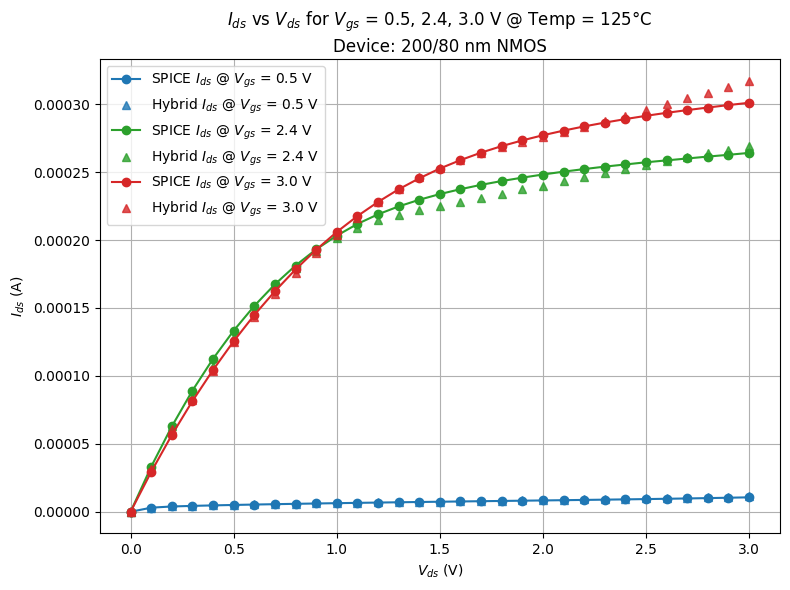

In [94]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 2  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_200_80.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 200/80 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


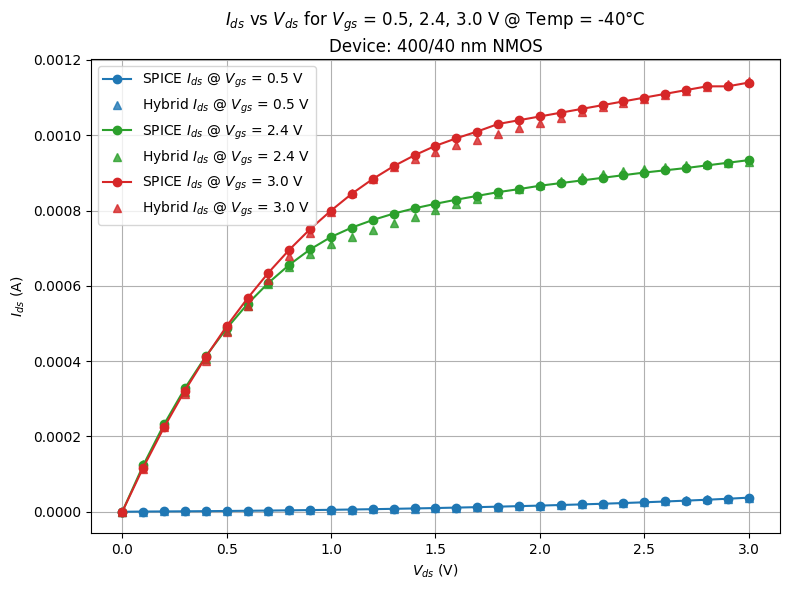

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


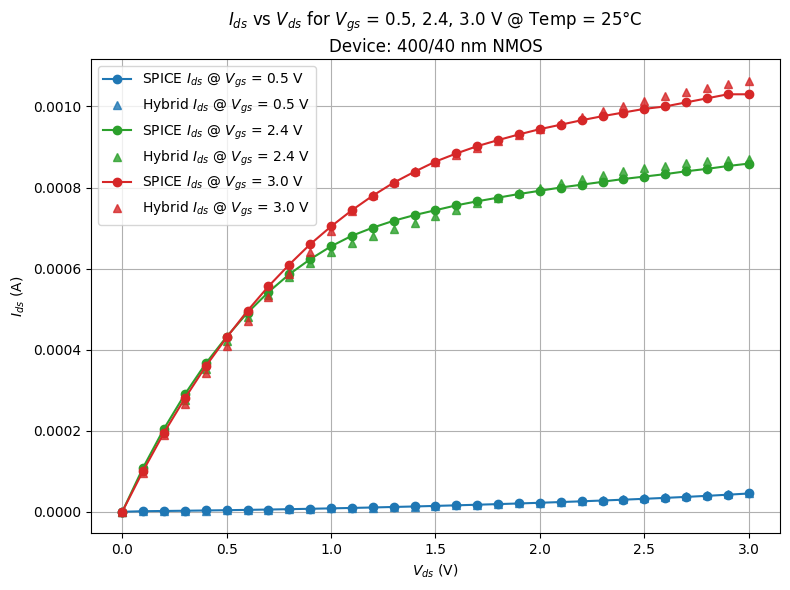

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


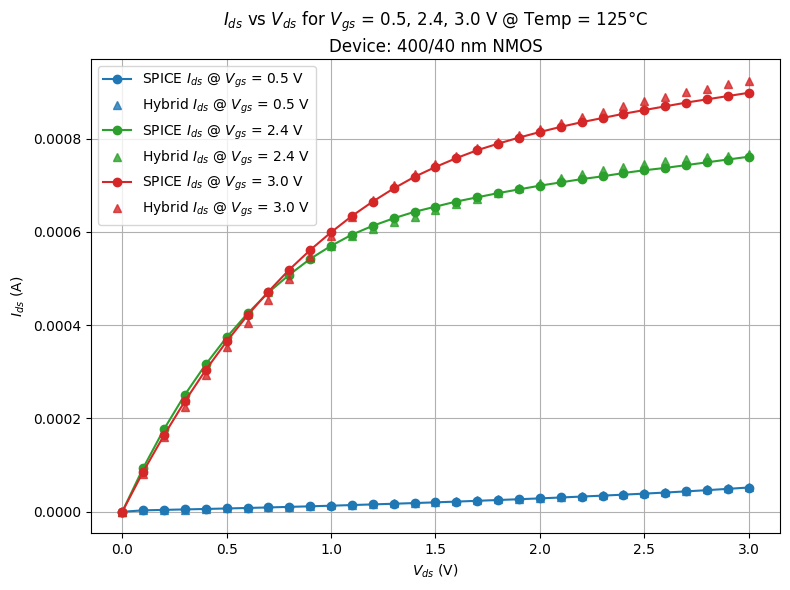

In [95]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 3 # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_400_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 400/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


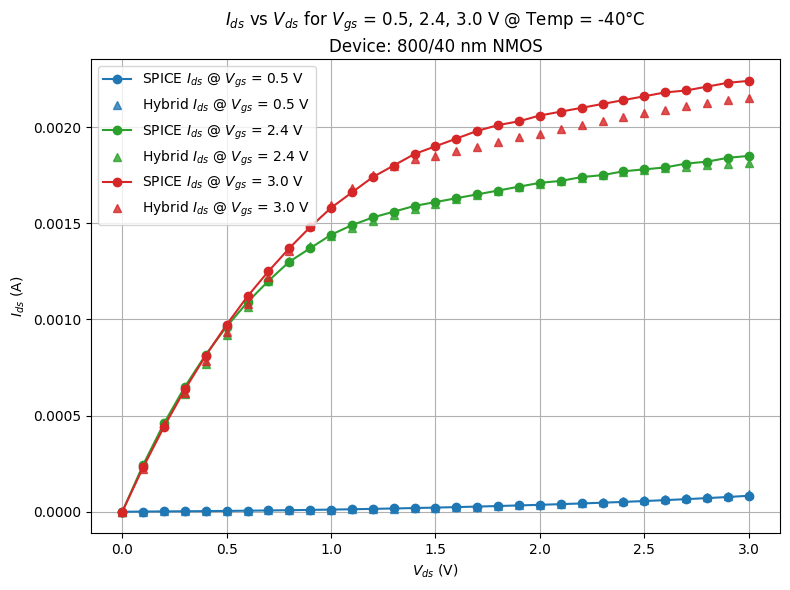

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


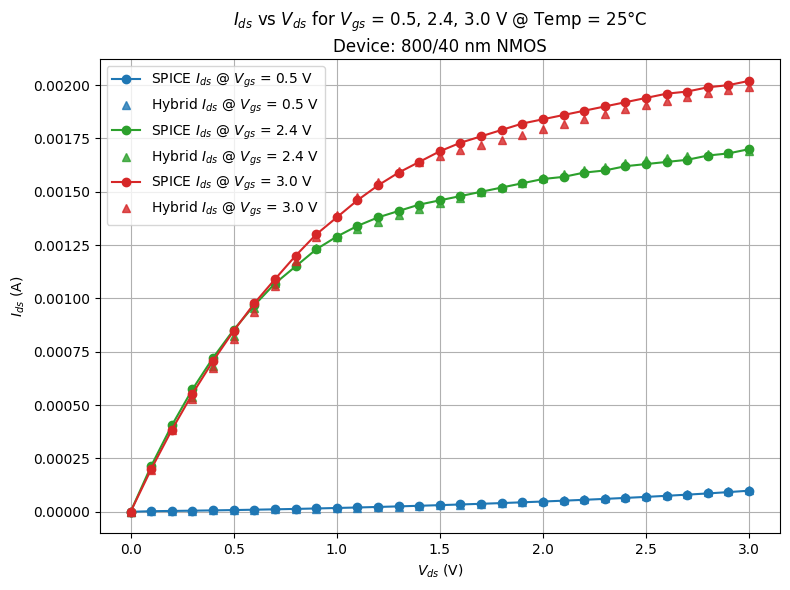

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


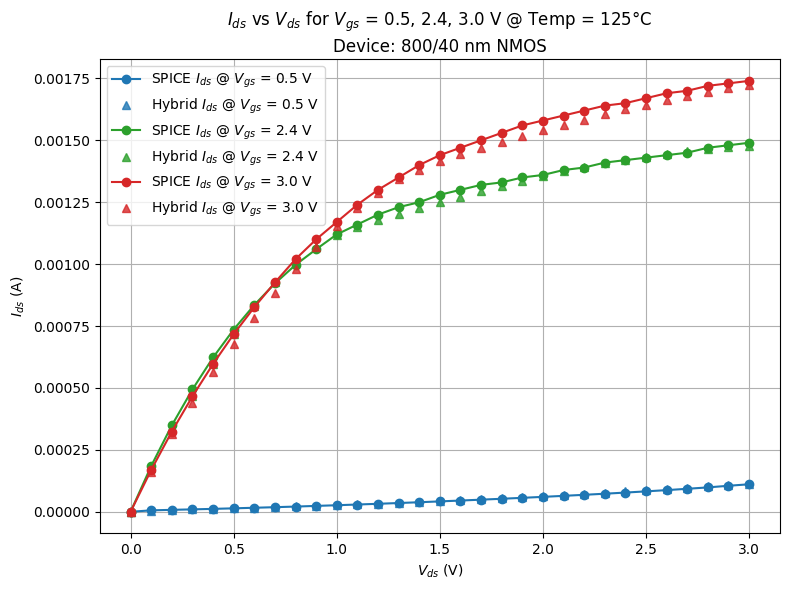

In [96]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 4  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-40, 25, 125]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_800_40.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 800/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


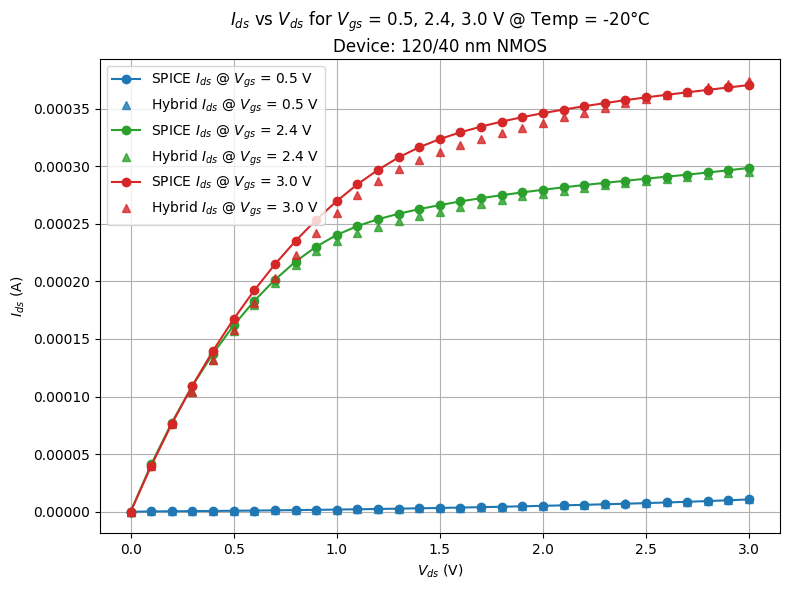

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


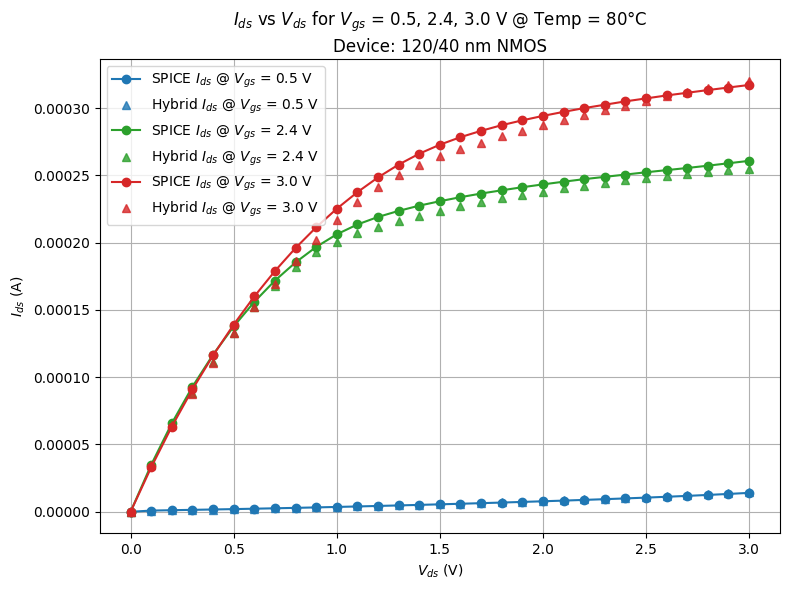

In [97]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 0  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_120_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 120/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


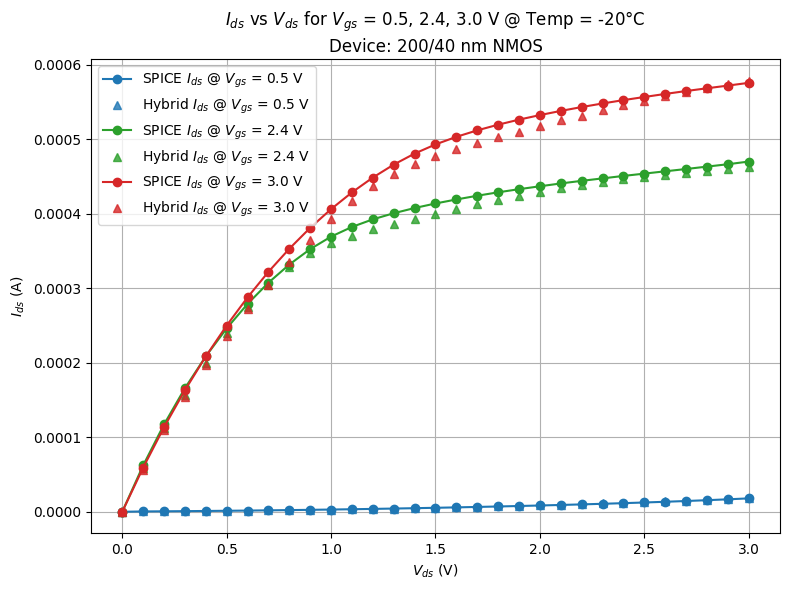

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


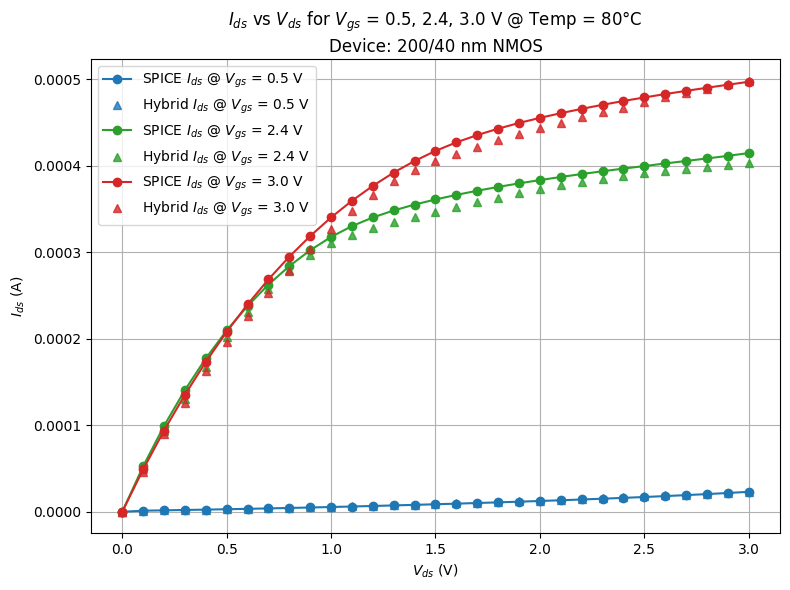

In [99]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 1  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_200_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 200/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


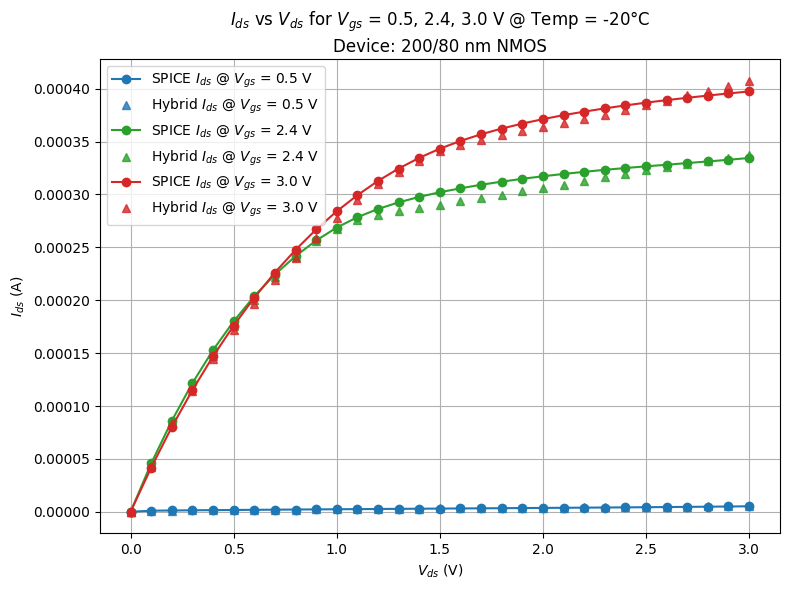

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


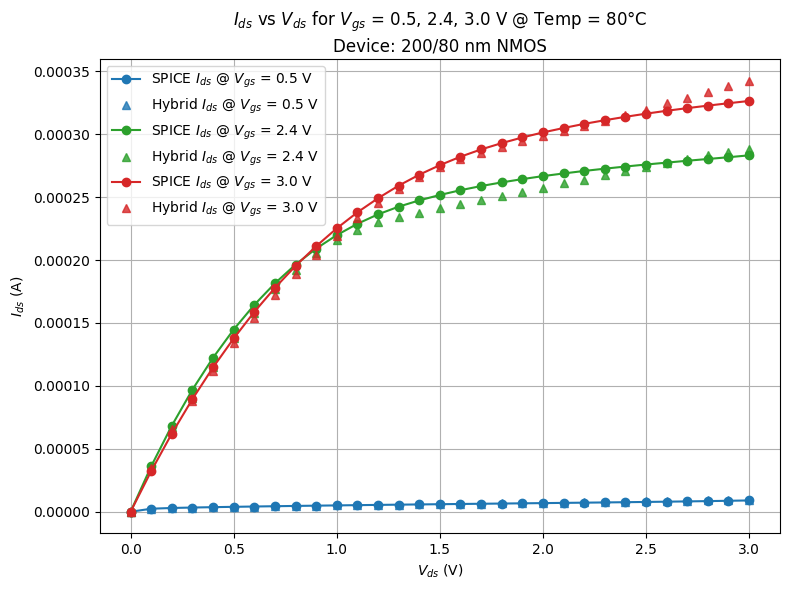

In [101]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 2  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_200_80-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 200/80 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


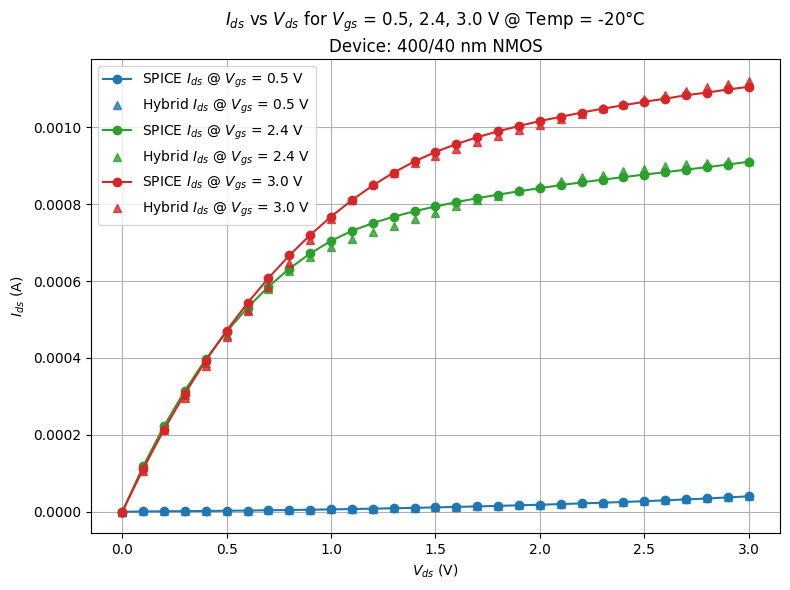

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


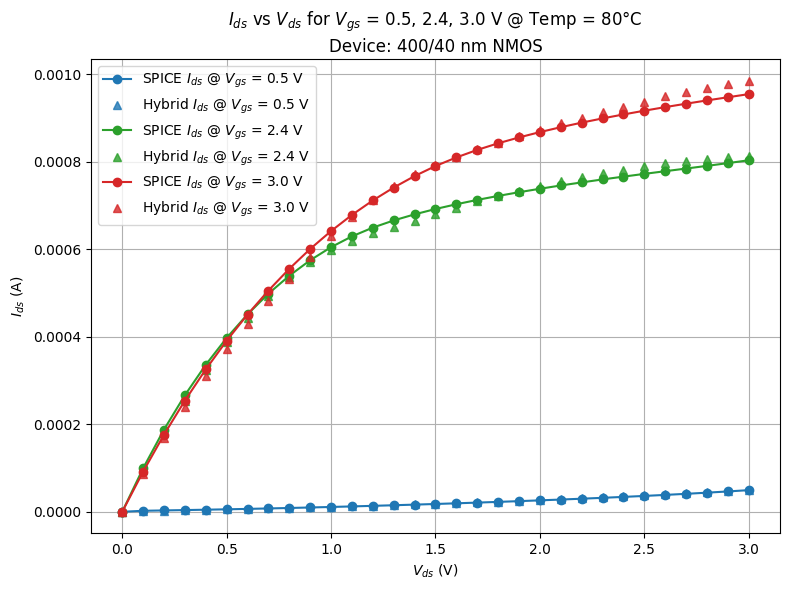

In [102]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 3  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_400_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 400/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


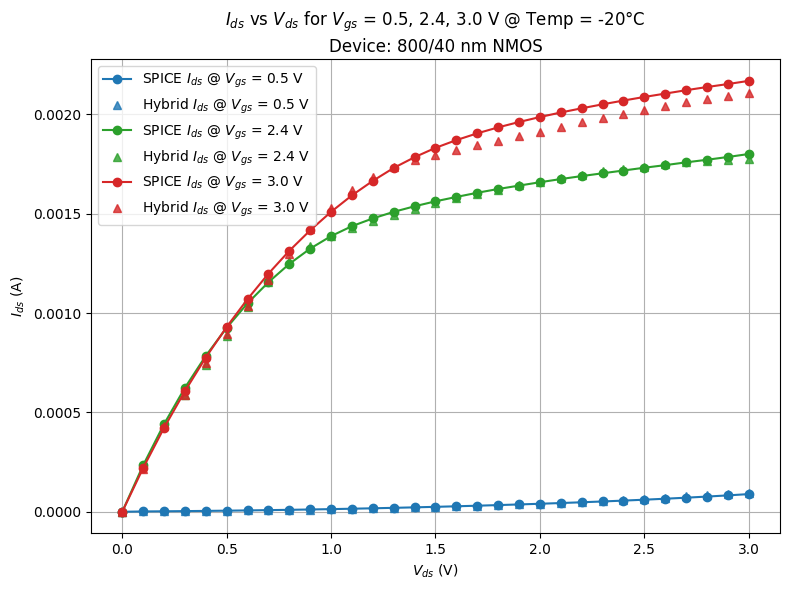

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


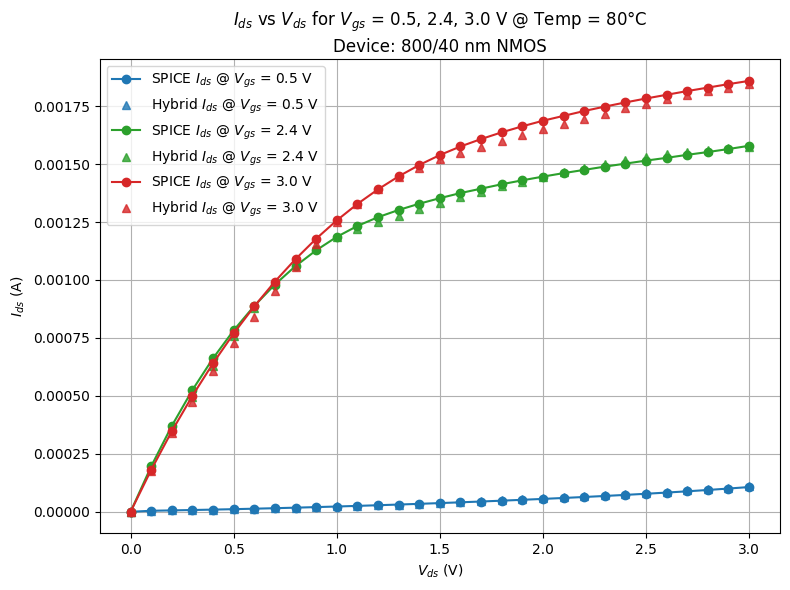

In [104]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuration
DEVICE_INDEX = 4  # Device: nfet_120_40.CSV
VGS_TARGETS = [0.5, 2.4, 3.0]
TEMP_TARGETS = [-20, 80]

# Color map for Vgs
color_map = {
    0.5: '#1f77b4',   # blue
    2.4: '#2ca02c',   # green
    3.0: '#d62728'    # red
}

# Load NMOS SPICE data
df_spice = pd.read_csv("nfet_800_40-1.CSV").sort_values(by=["temp", "V_gs", "V_ds"])
signature = device_signatures[DEVICE_INDEX]

# One figure per temperature
for TEMP in TEMP_TARGETS:
    plt.figure(figsize=(8, 6))

    for VGS_TARGET in VGS_TARGETS:
        color = color_map[VGS_TARGET]

        # Filter SPICE data
        mask = (df_spice["V_gs"] == VGS_TARGET) & (df_spice["temp"] == TEMP)
        df_filtered = df_spice[mask].sort_values(by="V_ds")

        if df_filtered.empty:
            print(f"⚠️ No SPICE data found for Vgs = {VGS_TARGET} V at {TEMP}°C")
            continue

        # NN input (6D)
        X_input = [[*signature, row["V_gs"], row["V_ds"], row["temp"]] for _, row in df_filtered.iterrows()]
        X_scaled_input = scaler.transform(X_input)

        # GPR input (3D)
        X_gpr_input = df_filtered[["V_gs", "V_ds", "temp"]].values

        # NN prediction
        y_pred = model.predict(X_scaled_input)
        log_Id_nn = y_pred[:, 0]

        # GPR correction
        residual_pred = gpr.predict(X_gpr_input)
        log_Id_hybrid = log_Id_nn + residual_pred
        Id_pred = 10 ** log_Id_hybrid

        # SPICE values
        Id_spice = df_filtered["I_ds"].values
        Vds_vals = df_filtered["V_ds"].values

        # Plot SPICE (lines with circles)
        plt.plot(Vds_vals, Id_spice, "o-", color=color, label=f"SPICE $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

        # Plot Hybrid (red triangle markers, no lines)
        plt.plot(Vds_vals, Id_pred, "^", color=color, linestyle="None", alpha=0.8, label=f"Hybrid $I_{{ds}}$ @ $V_{{gs}}$ = {VGS_TARGET} V")

    # Final figure styling
    plt.xlabel("$V_{ds}$ (V)")
    plt.ylabel("$I_{ds}$ (A)")
    plt.title(f"$I_{{ds}}$ vs $V_{{ds}}$ for $V_{{gs}}$ = 0.5, 2.4, 3.0 V @ Temp = {TEMP}°C\nDevice: 800/40 nm NMOS")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
